#DF Head


In [ ]:

# ========================================================
# ✅ Dataset Splitting (Train-Validation-Test set) Script
# ========================================================

import os
import random
import shutil

source_path = "/content/Original Dataset"
destination_path = "/content/train"

source_folder = os.listdir(source_path)

for i in source_folder:
    sub_folder = os.listdir(source_path+'/'+i)
    for j in sub_folder:
        sub_sub_folder_path = source_path + '/' + i + '/' + 'Head' + '/'

        destination_folder = destination_path + '/' + i + '/'
        selection_ratio = 0.6  # 0.6 -> 60%, 0.5 -> 50%, 1 ->100%

        # Supported image extensions
        image_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.gif', '.tiff')

        def collect_images(folder_path):
            image_paths = []
            for root, _, files in os.walk(folder_path):
                for file in files:
                    if file.lower().endswith(image_extensions):
                        full_path = os.path.join(root, file)
                        image_paths.append(full_path)
            return image_paths

        def copy_selected_images(images, dest_folder, ratio):
            os.makedirs(dest_folder, exist_ok=True)
            num_to_select = int(len(images) * ratio)
            selected_images = random.sample(images, num_to_select)

            for img_path in selected_images:
                filename = os.path.basename(img_path)
                dest_path = os.path.join(dest_folder, filename)
                shutil.move(img_path, dest_path)
                print(f"Moved: {filename}")

        if __name__ == "__main__":
            all_images = collect_images(sub_sub_folder_path)
            print(f"Found {len(all_images)} images.")
            copy_selected_images(all_images, destination_folder, selection_ratio)
        break

In [ ]:
import numpy as np
import pandas as pd
import os
from sklearn.metrics import classification_report
import seaborn as sn
from sklearn.utils import shuffle
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
from tqdm import tqdm

class_names= os.listdir('/content/drive/MyDrive/DF_Head/train')

class_names_labels={class_name:i for i, class_name in enumerate(class_names)}

print(class_names_labels)

nb_classes=len(class_names)

IMAGE_SIZE=(200,200)

def load_data():
    direct='/content/drive/MyDrive/DF_Head'
    category=['train','valid','test']

    output=[]

    for cat in category:
      path=os.path.join(direct,cat)
      print(path)

      images=[]
      labels=[]

      for folder in os.listdir(path):
        print("folder:",folder)
        label= class_names_labels[folder]
        i=0
        #Iterating each image
        for fle in os.listdir(os.path.join(path,folder)):

          img_path=os.path.join(os.path.join(path,folder),fle)

          image=cv2.imread(img_path)

          image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
          image=cv2.resize(image,IMAGE_SIZE)

          images.append(image)
          labels.append(label)

      images=np.array(images,dtype='float32')
      labels=np.array(labels,dtype='int32')

      output.append((images,labels))
    #print(type(output[0]))
    return output

(train_images,train_lables), (valid_images,valid_lables), (test_images,test_lables) = load_data()

####MobileNetV2

✅ Reproducibility enabled with SEED = 42


/tmp/ipython-input-4284054545.py:39: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 100, 100,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 100, 100,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 100, 100,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 100, 100,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 100, 100,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 100, 100,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 101, 101,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 50, 50,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 50, 50,    │      2,304 │ block_1_depthwis

 Total params: 2,268,232 (8.65 MB)

 Trainable params: 2,234,120 (8.52 MB)

 Non-trainable params: 34,112 (133.25 KB)

Epoch 1/30
61/61 ━━━━━━━━━━━━━━━━━━━━ 43s 140ms/step - accuracy: 0.6688 - loss: 1.1537 - val_accuracy: 0.5370 - val_loss: 1.6714
Epoch 2/30
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - accuracy: 1.0000 - loss: 0.0366 - val_accuracy: 0.5000 - val_loss: 1.7598
Epoch 3/30
61/61 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - accuracy: 1.0000 - loss: 0.0090 - val_accuracy: 0.5062 - val_loss: 1.7470
Epoch 4/30
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 89ms/step - accuracy: 1.0000 - loss: 0.0054 - val_accuracy: 0.5185 - val_loss: 1.7134
Epoch 5/30
61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 105ms/step - accuracy: 1.0000 - loss: 0.0038 - val_accuracy: 0.5741 - val_loss: 1.6257
Epoch 6/30
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 89ms/step - accuracy: 1.0000 - loss: 0.0029 - val_accuracy: 0.6173 - val_loss: 1.4976
Epoch 7/30
61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - accuracy: 1.0000 - loss: 0.0023 - val_accuracy: 0.6543 - val_loss: 1.3499
Epoch 8/30
61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - accuracy: 1.0000 - loss: 0.0019 - val_accuracy: 0.6790

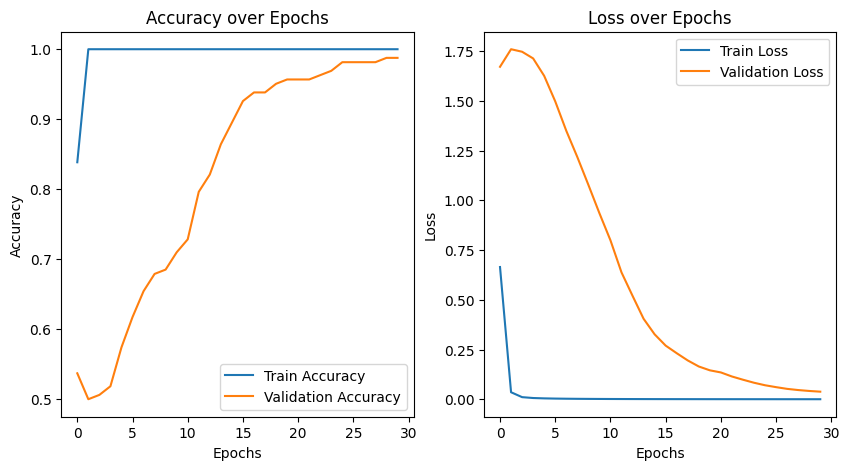

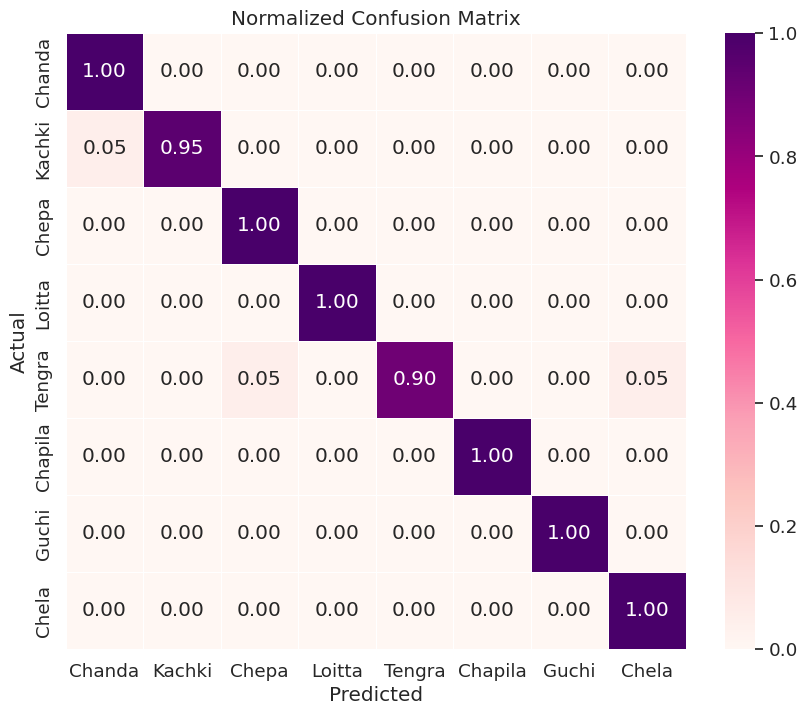

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


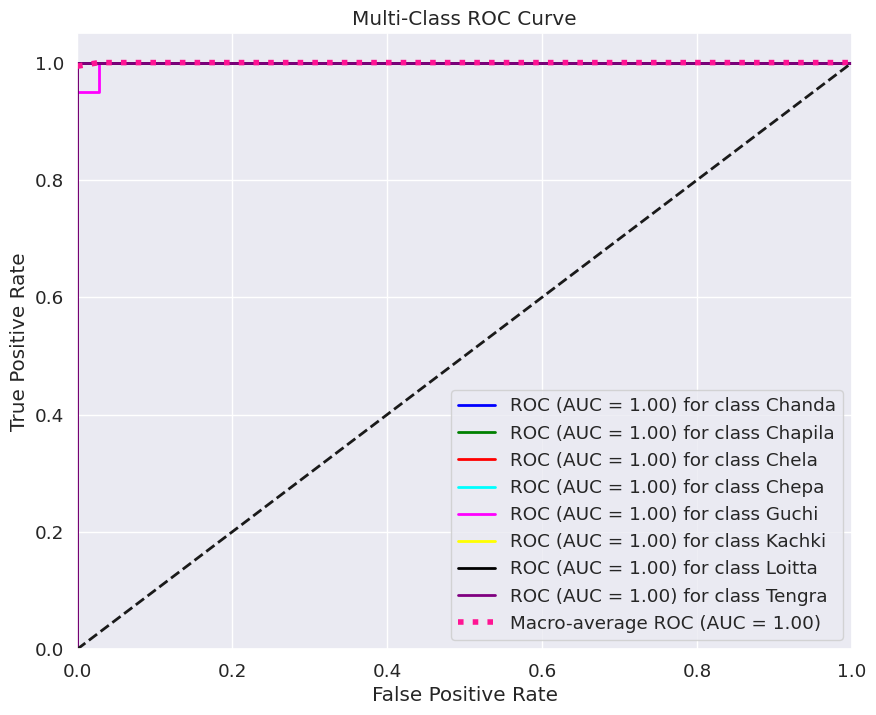

In [ ]:
# =====================================
# ✅ Reproducible MobileNetV2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=30,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=30,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/DF_Head/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


✅ Reproducibility enabled with SEED = 33


/tmp/ipython-input-1014003714.py:39: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 100, 100,  │        864 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 100, 100,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 100, 100,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 100, 100,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 100, 100,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 100, 100,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 101, 101,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 50, 50,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 50, 50,    │      2,304 │ block_1_depthwis

 Total params: 2,268,232 (8.65 MB)

 Trainable params: 2,234,120 (8.52 MB)

 Non-trainable params: 34,112 (133.25 KB)

Epoch 1/30
61/61 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - accuracy: 0.6185 - loss: 1.1782 - val_accuracy: 0.4074 - val_loss: 1.9531
Epoch 2/30
61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 104ms/step - accuracy: 1.0000 - loss: 0.0356 - val_accuracy: 0.4321 - val_loss: 1.8817
Epoch 3/30
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 89ms/step - accuracy: 1.0000 - loss: 0.0101 - val_accuracy: 0.4815 - val_loss: 1.6757
Epoch 4/30
61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 104ms/step - accuracy: 1.0000 - loss: 0.0063 - val_accuracy: 0.5494 - val_loss: 1.4653
Epoch 5/30
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - accuracy: 1.0000 - loss: 0.0045 - val_accuracy: 0.6111 - val_loss: 1.2988
Epoch 6/30
61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - accuracy: 1.0000 - loss: 0.0035 - val_accuracy: 0.6358 - val_loss: 1.1509
Epoch 7/30
61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 1.0000 - loss: 0.0027 - val_accuracy: 0.6852 - val_loss: 1.0539
Epoch 8/30
61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step - accuracy: 1.0000 - loss: 0.0022 - val_accuracy: 0.691

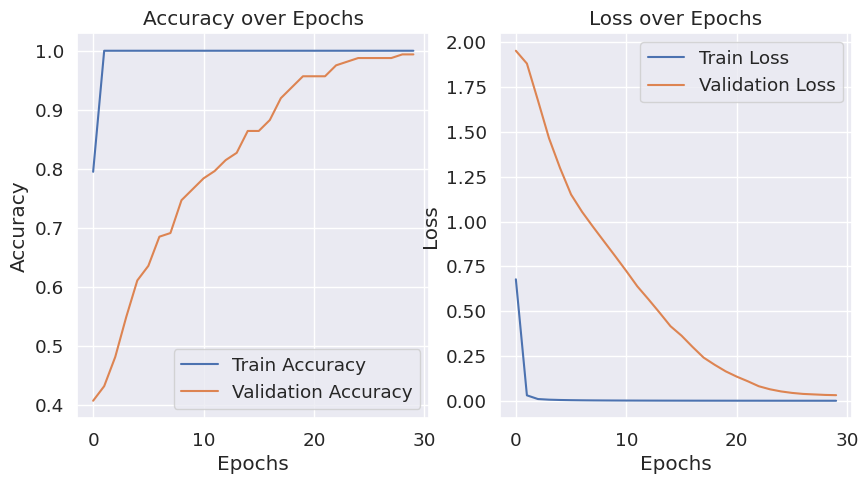

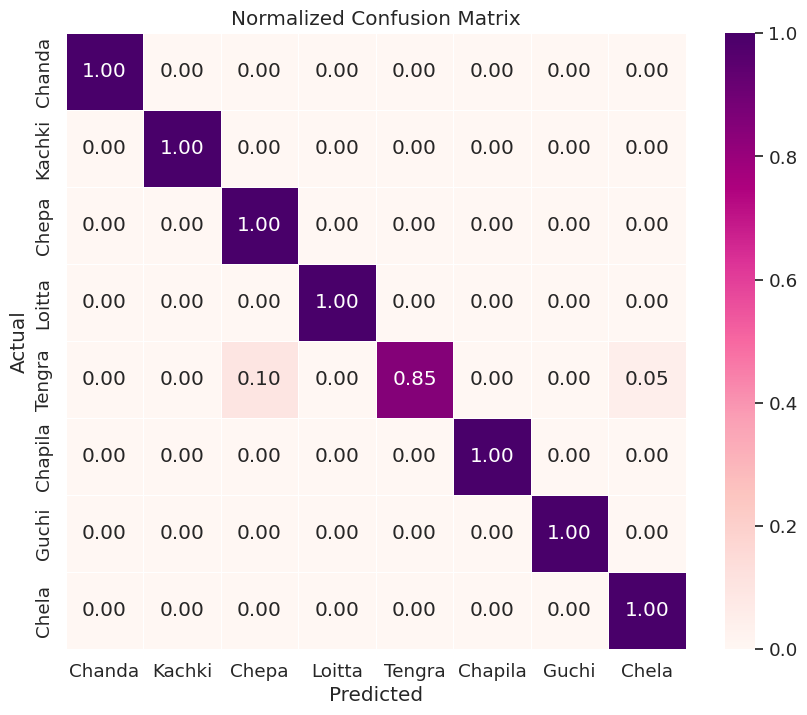

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


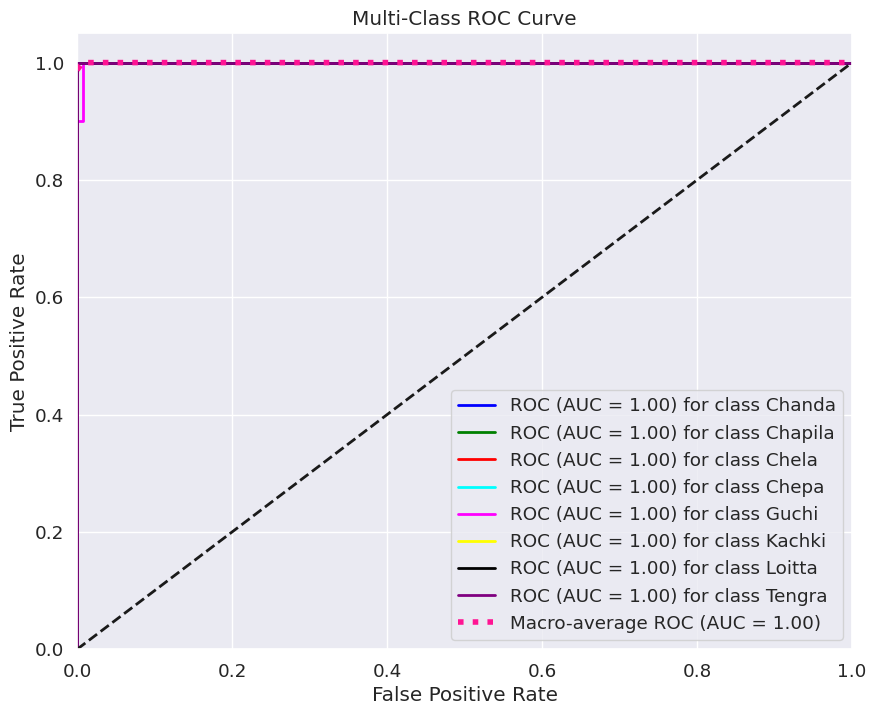

In [ ]:
# =====================================
# ✅ Reproducible MobileNetV2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 33

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=30,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=30,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/DF_Head/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


✅ Reproducibility enabled with SEED = 25


/tmp/ipython-input-4090600943.py:39: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 100, 100,  │        864 │ input_layer_2[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 100, 100,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 100, 100,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 100, 100,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 100, 100,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 100, 100,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 101, 101,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 50, 50,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 50, 50,    │      2,304 │ block_1_depthwis

 Total params: 2,268,232 (8.65 MB)

 Trainable params: 2,234,120 (8.52 MB)

 Non-trainable params: 34,112 (133.25 KB)

Epoch 1/30
61/61 ━━━━━━━━━━━━━━━━━━━━ 47s 121ms/step - accuracy: 0.5763 - loss: 1.2042 - val_accuracy: 0.4753 - val_loss: 1.6652
Epoch 2/30
61/61 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step - accuracy: 1.0000 - loss: 0.0376 - val_accuracy: 0.4568 - val_loss: 1.6161
Epoch 3/30
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - accuracy: 1.0000 - loss: 0.0108 - val_accuracy: 0.4753 - val_loss: 1.5096
Epoch 4/30
61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - accuracy: 1.0000 - loss: 0.0066 - val_accuracy: 0.5370 - val_loss: 1.2915
Epoch 5/30
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - accuracy: 1.0000 - loss: 0.0047 - val_accuracy: 0.5617 - val_loss: 1.1149
Epoch 6/30
61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - accuracy: 1.0000 - loss: 0.0036 - val_accuracy: 0.6111 - val_loss: 0.9499
Epoch 7/30
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 89ms/step - accuracy: 1.0000 - loss: 0.0029 - val_accuracy: 0.6975 - val_loss: 0.8227
Epoch 8/30
61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - accuracy: 1.0000 - loss: 0.0024 - val_accuracy: 0.77

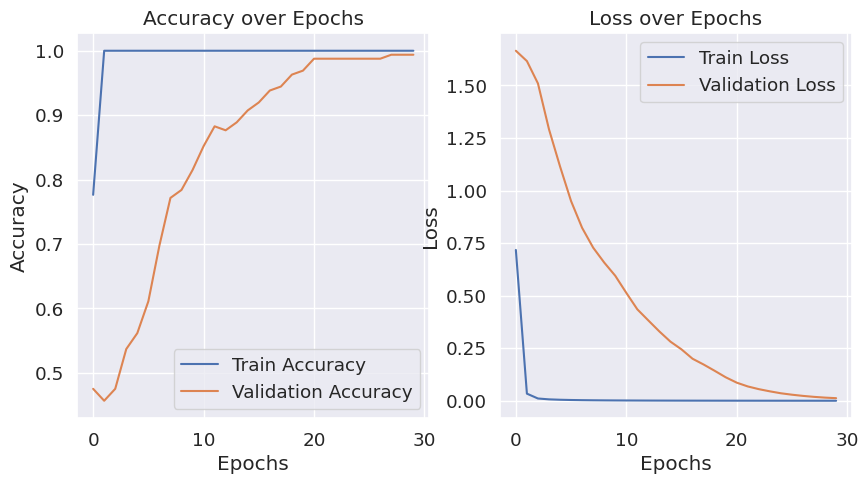

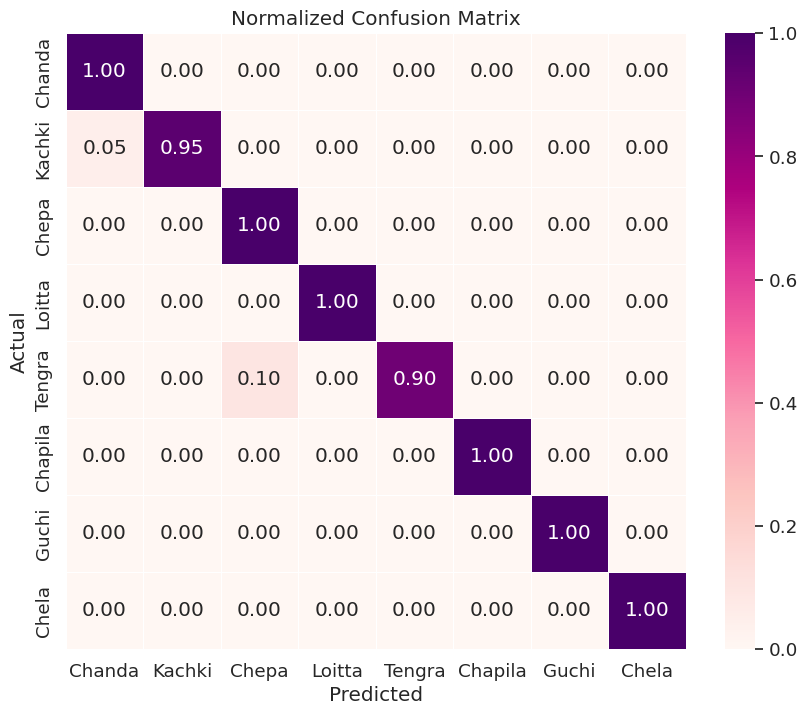

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


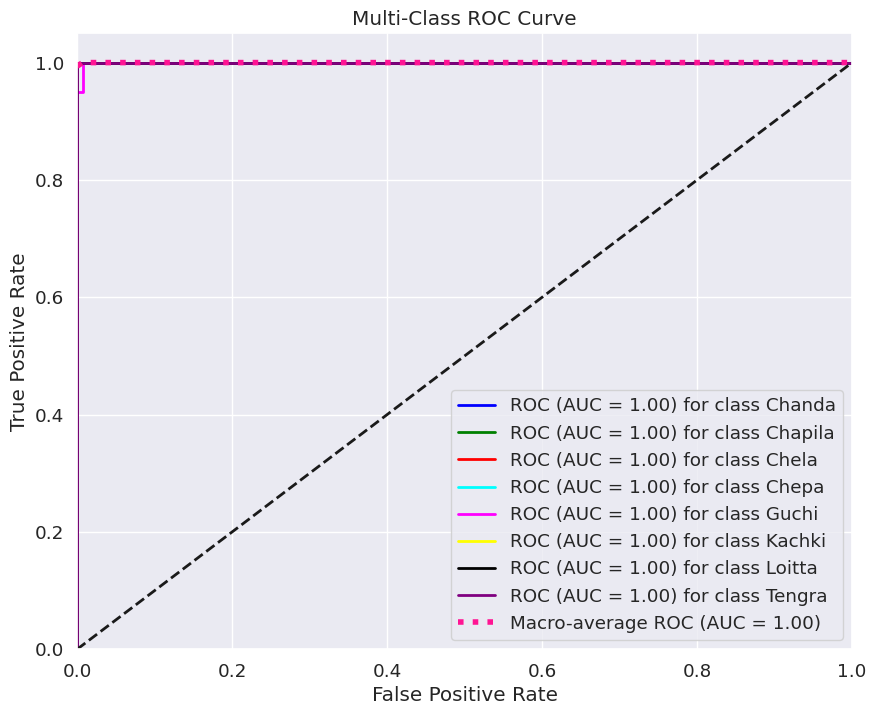

In [ ]:
# =====================================
# ✅ Reproducible MobileNetV2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 25

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=30,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=30,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/DF_Head/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


####ResNet50V2

✅ Reproducibility enabled with SEED = 25


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7       │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 206, 206,  │          0 │ input_layer_7[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 100, 100,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 102, 102,  │          0 │ conv1_conv[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 50, 50,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │        256 │ pool1_pool[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │          0 │ conv2_block1_pre… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 50, 50,    │      4,096 │ conv2_block1_pre… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 50, 50,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 50, 50,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_pad  │ (None, 52, 52,    │          0 │ conv2_block1_1_r… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 50, 50,    │     36,864 │ conv2_block1_2_p… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 50, 50,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 50, 50,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_pre… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_out    │ (None, 50, 50,    │          0 │ conv2_block1_0_c

 Total params: 23,581,192 (89.96 MB)

 Trainable params: 23,535,752 (89.78 MB)

 Non-trainable params: 45,440 (177.50 KB)

Epoch 1/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 54s 193ms/step - accuracy: 0.7120 - loss: 1.0064 - val_accuracy: 0.1296 - val_loss: 4.8728
Epoch 2/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - accuracy: 0.9828 - loss: 0.0641 - val_accuracy: 0.7593 - val_loss: 0.8649
Epoch 3/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 148ms/step - accuracy: 0.9922 - loss: 0.0327 - val_accuracy: 0.9815 - val_loss: 0.0659
Epoch 4/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - accuracy: 0.9921 - loss: 0.0396 - val_accuracy: 0.9938 - val_loss: 0.0456
Epoch 5/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - accuracy: 1.0000 - loss: 0.0059 - val_accuracy: 0.9938 - val_loss: 0.0223
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - accuracy: 0.9888 - loss: 0.0228 
Test Accuracy: 0.9877 | Test Loss: 0.0276
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 355ms/step

Classification Report:
              precision    recall  f1-score   support

           0       0.95      1.00      0.98        20
           1       1.00      0.95      0.98        21
           2       1.00

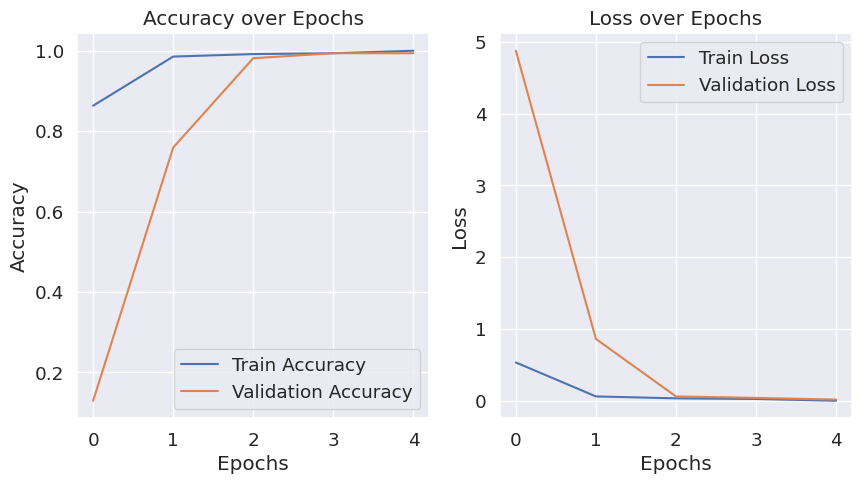

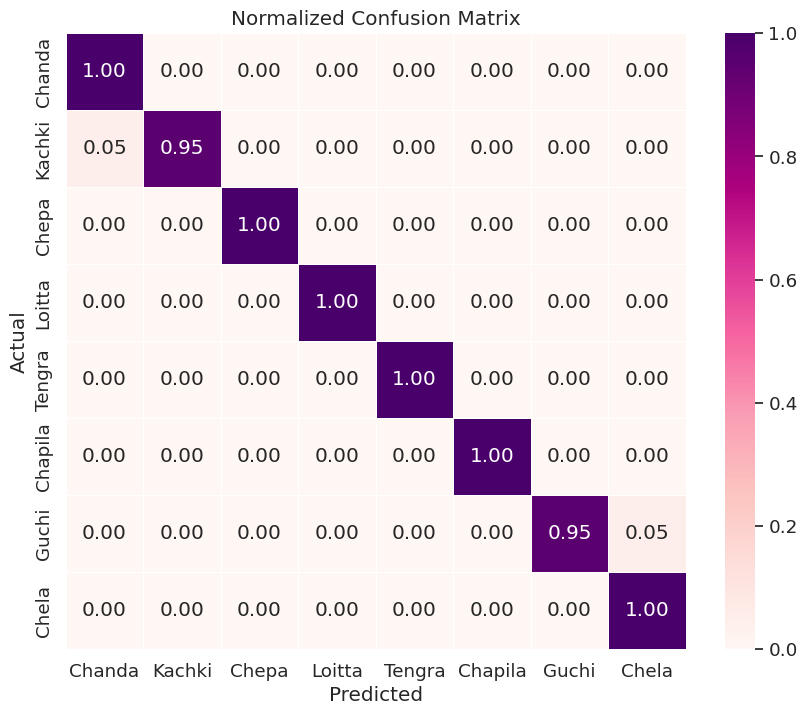

6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step


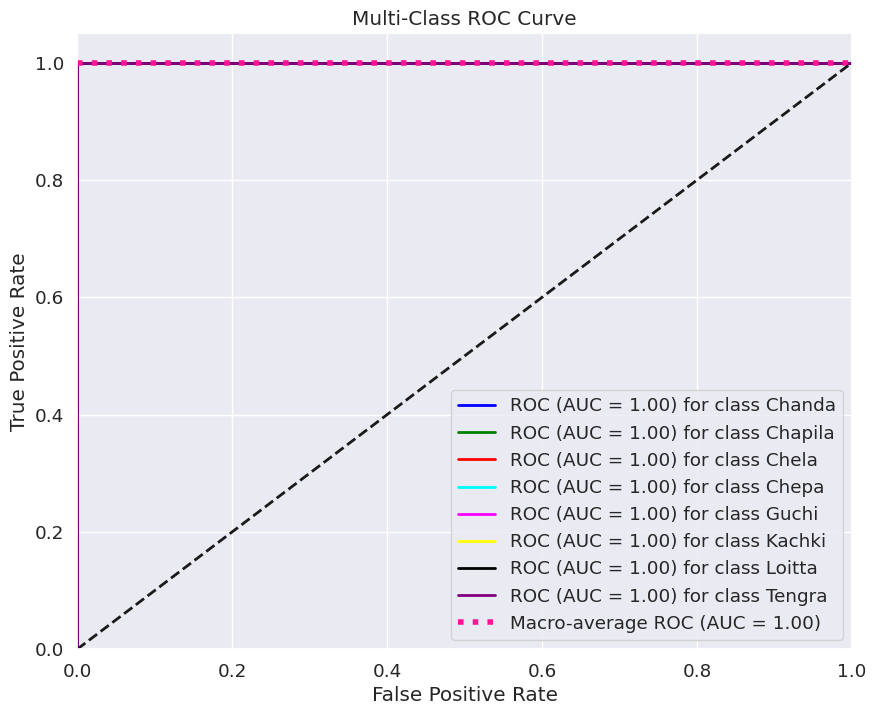

In [ ]:
# =====================================
# ✅ Reproducible ResNet50V2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 25

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = ResNet50V2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=5,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=5,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/DF_Head/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


✅ Reproducibility enabled with SEED = 33


Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8       │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 206, 206,  │          0 │ input_layer_8[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 100, 100,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 102, 102,  │          0 │ conv1_conv[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 50, 50,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │        256 │ pool1_pool[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │          0 │ conv2_block1_pre… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 50, 50,    │      4,096 │ conv2_block1_pre… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 50, 50,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 50, 50,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_pad  │ (None, 52, 52,    │          0 │ conv2_block1_1_r… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 50, 50,    │     36,864 │ conv2_block1_2_p… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 50, 50,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 50, 50,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_pre… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_out    │ (None, 50, 50,    │          0 │ conv2_block1_0_c

 Total params: 23,581,192 (89.96 MB)

 Trainable params: 23,535,752 (89.78 MB)

 Non-trainable params: 45,440 (177.50 KB)

Epoch 1/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 57s 191ms/step - accuracy: 0.7100 - loss: 0.9303 - val_accuracy: 0.1235 - val_loss: 6.9628
Epoch 2/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - accuracy: 0.9932 - loss: 0.0404 - val_accuracy: 0.6852 - val_loss: 1.1231
Epoch 3/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - accuracy: 1.0000 - loss: 0.0080 - val_accuracy: 0.9753 - val_loss: 0.0495
Epoch 4/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - accuracy: 1.0000 - loss: 0.0030 - val_accuracy: 0.9938 - val_loss: 0.0109
Epoch 5/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - accuracy: 1.0000 - loss: 0.0019 - val_accuracy: 1.0000 - val_loss: 0.0044
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - accuracy: 0.9888 - loss: 0.0245 
Test Accuracy: 0.9877 | Test Loss: 0.0273
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 477ms/step

Classification Report:
              precision    recall  f1-score   support

           0       0.95      1.00      0.98        20
           1       1.00      0.95      0.98        21
           2       1.0

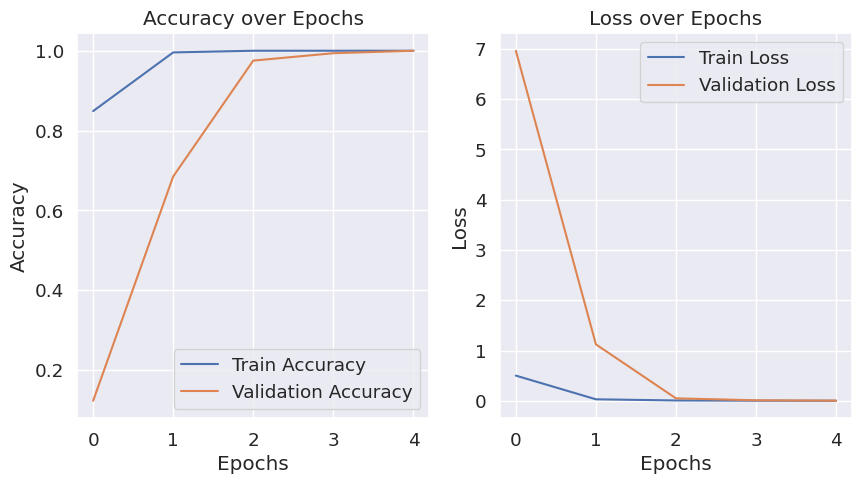

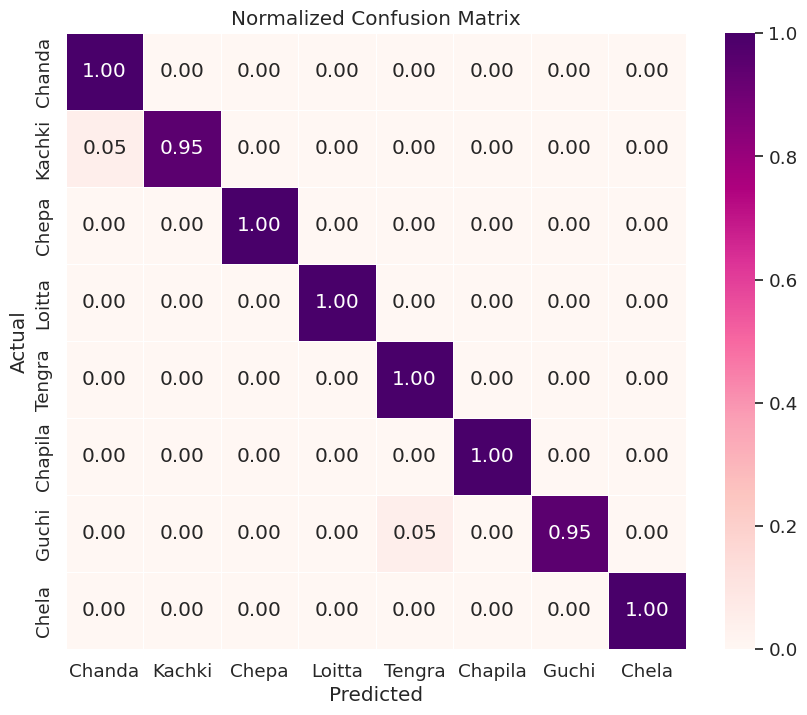

6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step 


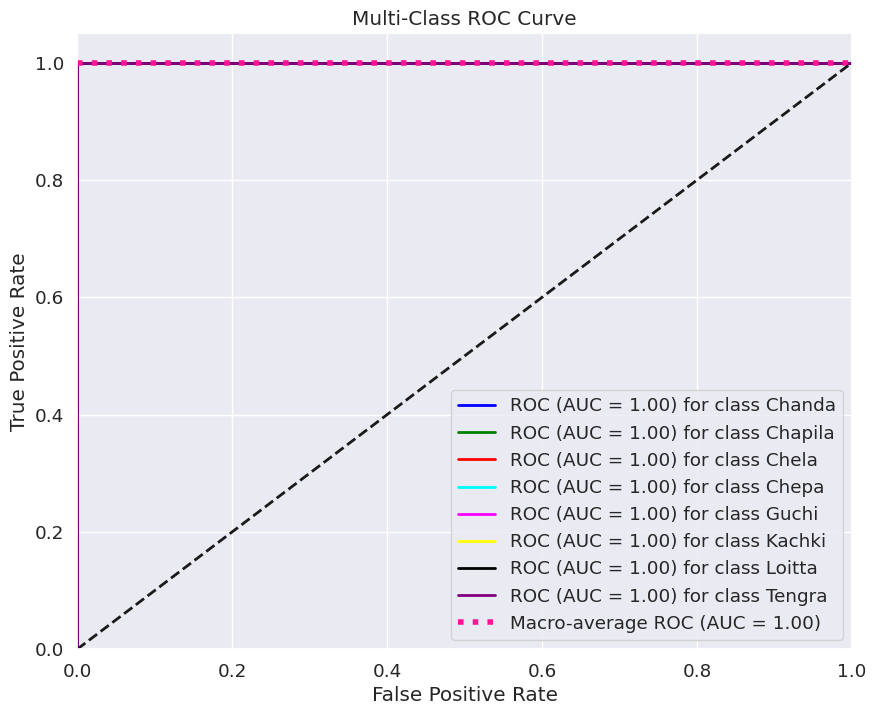

In [ ]:
# =====================================
# ✅ Reproducible ResNet50V2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 33

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = ResNet50V2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=5,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=5,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/DF_Head/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


✅ Reproducibility enabled with SEED = 42


Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_9       │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 206, 206,  │          0 │ input_layer_9[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 100, 100,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 102, 102,  │          0 │ conv1_conv[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 50, 50,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │        256 │ pool1_pool[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │          0 │ conv2_block1_pre… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 50, 50,    │      4,096 │ conv2_block1_pre… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 50, 50,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 50, 50,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_pad  │ (None, 52, 52,    │          0 │ conv2_block1_1_r… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 50, 50,    │     36,864 │ conv2_block1_2_p… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 50, 50,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 50, 50,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_pre… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_out    │ (None, 50, 50,    │          0 │ conv2_block1_0_c

 Total params: 23,581,192 (89.96 MB)

 Trainable params: 23,535,752 (89.78 MB)

 Non-trainable params: 45,440 (177.50 KB)

Epoch 1/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 58s 194ms/step - accuracy: 0.7164 - loss: 0.9730 - val_accuracy: 0.1790 - val_loss: 3.3925
Epoch 2/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - accuracy: 0.9923 - loss: 0.0376 - val_accuracy: 0.9259 - val_loss: 0.3268
Epoch 3/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - accuracy: 0.9999 - loss: 0.0181 - val_accuracy: 0.9815 - val_loss: 0.0359
Epoch 4/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - accuracy: 1.0000 - loss: 0.0051 - val_accuracy: 0.9877 - val_loss: 0.0347
Epoch 5/5
61/61 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - accuracy: 1.0000 - loss: 0.0022 - val_accuracy: 0.9938 - val_loss: 0.0129
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - accuracy: 0.9925 - loss: 0.0250 
Test Accuracy: 0.9939 | Test Loss: 0.0214
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 362ms/step

Classification Report:
              precision    recall  f1-score   support

           0       0.95      1.00      0.98        20
           1       1.00      0.95      0.98        21
           2       1.

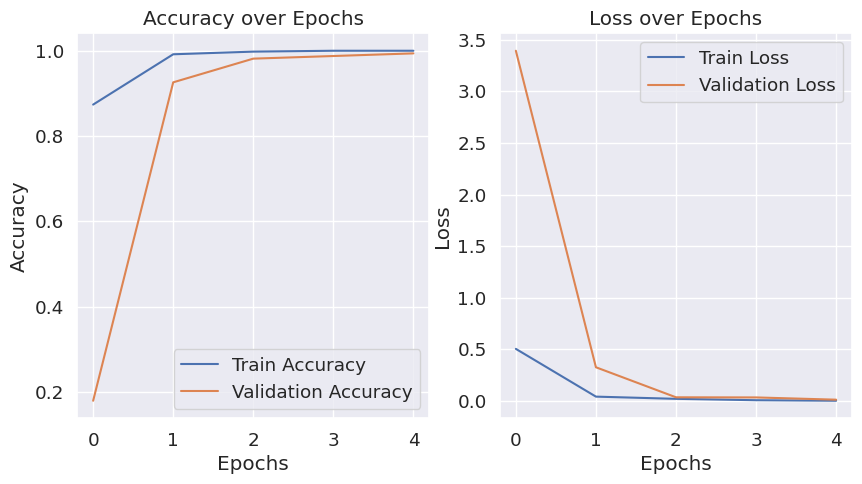

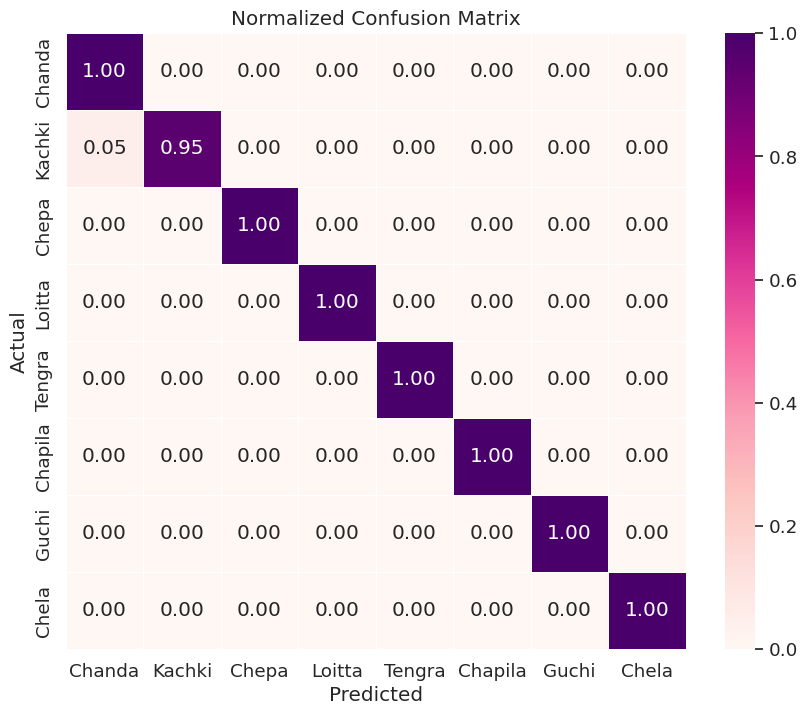

6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step 


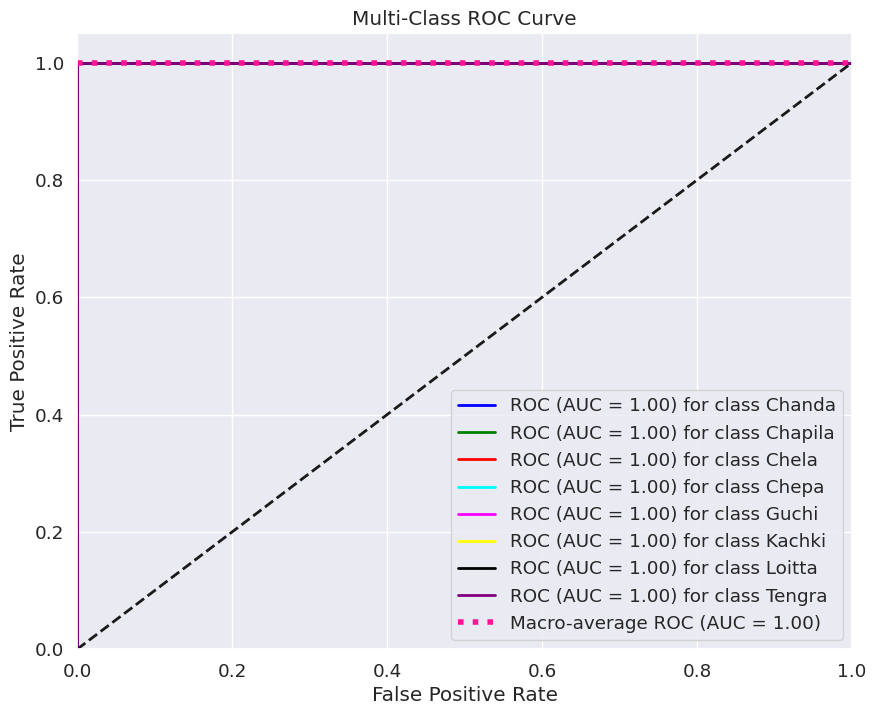

In [ ]:
# =====================================
# ✅ Reproducible ResNet50V2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = ResNet50V2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=5,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=5,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/DF_Head/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


#DF Tail


In [ ]:
# ========================================================
# ✅ Dataset Splitting (Train-Validation-Test set) Script
# ========================================================

import os
import random
import shutil

source_path = "/content/Original Dataset"
destination_path = "/content/train"

source_folder = os.listdir(source_path)

for i in source_folder:
    sub_folder = os.listdir(source_path+'/'+i)
    for j in sub_folder:
        sub_sub_folder_path = source_path + '/' + i + '/' + 'Tail' + '/'

        destination_folder = destination_path + '/' + i + '/'
        selection_ratio = 0.6  # 0.6 -> 60%, 0.5 -> 50%, 1 ->100%

        # Supported image extensions
        image_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.gif', '.tiff')

        def collect_images(folder_path):
            image_paths = []
            for root, _, files in os.walk(folder_path):
                for file in files:
                    if file.lower().endswith(image_extensions):
                        full_path = os.path.join(root, file)
                        image_paths.append(full_path)
            return image_paths

        def copy_selected_images(images, dest_folder, ratio):
            os.makedirs(dest_folder, exist_ok=True)
            num_to_select = int(len(images) * ratio)
            selected_images = random.sample(images, num_to_select)

            for img_path in selected_images:
                filename = os.path.basename(img_path)
                dest_path = os.path.join(dest_folder, filename)
                shutil.move(img_path, dest_path)  # <-- move instead of copy2
                print(f"Moved: {filename}")

        if __name__ == "__main__":
            all_images = collect_images(sub_sub_folder_path)
            print(f"Found {len(all_images)} images.")
            copy_selected_images(all_images, destination_folder, selection_ratio)
        break

Found 21 images.
Moved: Kachki_Tail_86.jpg
Moved: Kachki_Tail_39.jpg
Moved: Kachki_Tail_70.jpg
Moved: Kachki_Tail_34.jpg
Moved: Kachki_Tail_30.jpg
Moved: Kachki_Tail_26.jpg
Moved: Kachki_Tail_16.jpg
Moved: Kachki_Tail_97.jpg
Moved: Kachki_Tail_102.jpg
Moved: Kachki_Tail_94.jpg
Moved: Kachki_Tail_68.jpg
Moved: Kachki_Tail_63.jpg
Moved: Kachki_Tail_65.jpg
Moved: Kachki_Tail_103.jpg
Moved: Kachki_Tail_24.jpg
Moved: Kachki_Tail_7.jpg
Moved: Kachki_Tail_2.jpg
Moved: Kachki_Tail_72.jpg
Moved: Kachki_Tail_91.jpg
Moved: Kachki_Tail_50.jpg
Moved: Kachki_Tail_104.jpg
Found 20 images.
Moved: Chapila_Tail_49.jpg
Moved: Chapila_Tail_25.jpg
Moved: Chapila_Tail_8.jpg
Moved: Chapila_Tail_36.jpg
Moved: Chapila_Tail_28.jpg
Moved: Chapila_Tail_89.jpg
Moved: Chapila_Tail_66.jpg
Moved: Chapila_Tail_2.jpg
Moved: Chapila_Tail_90.jpg
Moved: Chapila_Tail_98.jpg
Moved: Chapila_Tail_78.jpg
Moved: Chapila_Tail_96.jpg
Moved: Chapila_Tail_41.jpg
Moved: Chapila_Tail_94.jpg
Moved: Chapila_Tail_87.jpg
Moved: Chapila_T

In [ ]:
import numpy as np
import pandas as pd
import os
from sklearn.metrics import classification_report
import seaborn as sn
from sklearn.utils import shuffle
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
from tqdm import tqdm

class_names= os.listdir('/content/drive/MyDrive/DF_Tail/train')

class_names_labels={class_name:i for i, class_name in enumerate(class_names)}

print(class_names_labels)

nb_classes=len(class_names)

IMAGE_SIZE=(200,200)

def load_data():
    direct='/content/drive/MyDrive/DF_Tail'
    category=['train','valid','test']

    output=[]

    for cat in category:
      path=os.path.join(direct,cat)
      print(path)

      images=[]
      labels=[]

      for folder in os.listdir(path):
        print("folder:",folder)
        label= class_names_labels[folder]
        i=0
        #Iterating each image
        for fle in os.listdir(os.path.join(path,folder)):

          img_path=os.path.join(os.path.join(path,folder),fle)

          image=cv2.imread(img_path)

          image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
          image=cv2.resize(image,IMAGE_SIZE)

          images.append(image)
          labels.append(label)

      images=np.array(images,dtype='float32')
      labels=np.array(labels,dtype='int32')

      output.append((images,labels))
    #print(type(output[0]))
    return output

(train_images,train_lables), (valid_images,valid_lables), (test_images,test_lables) = load_data()

{'Kachki': 0, 'Chapila': 1, 'Chela': 2, 'Chanda': 3, 'Guchi': 4, 'Tengra': 5, 'Loitta': 6, 'Chepa': 7}
/content/drive/MyDrive/DF_Tail/train
folder: Kachki
folder: Chapila
folder: Chela
folder: Chanda
folder: Guchi
folder: Tengra
folder: Loitta
folder: Chepa
/content/drive/MyDrive/DF_Tail/valid
folder: Kachki
folder: Chapila
folder: Chela
folder: Chanda
folder: Guchi
folder: Tengra
folder: Loitta
folder: Chepa
/content/drive/MyDrive/DF_Tail/test
folder: Kachki
folder: Chapila
folder: Chela
folder: Chanda
folder: Guchi
folder: Tengra
folder: Loitta
folder: Chepa


#### MobileNetV2

✅ Reproducibility enabled with SEED = 42


/tmp/ipython-input-4284054545.py:39: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)


Model: "functional_29"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_29      │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 100, 100,  │        864 │ input_layer_29[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 100, 100,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 100, 100,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 100, 100,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 100, 100,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 100, 100,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 101, 101,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 50, 50,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 50, 50,    │      2,304 │ block_1_depthwis

 Total params: 2,268,232 (8.65 MB)

 Trainable params: 2,234,120 (8.52 MB)

 Non-trainable params: 34,112 (133.25 KB)

Epoch 1/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 47s 135ms/step - accuracy: 0.6174 - loss: 1.1322 - val_accuracy: 0.2317 - val_loss: 4.8936
Epoch 2/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - accuracy: 1.0000 - loss: 0.0379 - val_accuracy: 0.2439 - val_loss: 4.7617
Epoch 3/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - accuracy: 1.0000 - loss: 0.0105 - val_accuracy: 0.2683 - val_loss: 4.5327
Epoch 4/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 89ms/step - accuracy: 1.0000 - loss: 0.0062 - val_accuracy: 0.3110 - val_loss: 4.0433
Epoch 5/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 1.0000 - loss: 0.0044 - val_accuracy: 0.3293 - val_loss: 3.6505
Epoch 6/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - accuracy: 1.0000 - loss: 0.0034 - val_accuracy: 0.3415 - val_loss: 3.2702
Epoch 7/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - accuracy: 1.0000 - loss: 0.0027 - val_accuracy: 0.4024 - val_loss: 2.8811
Epoch 8/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - accuracy: 1.0000 - loss: 0.0022 - val_accuracy: 0.4573

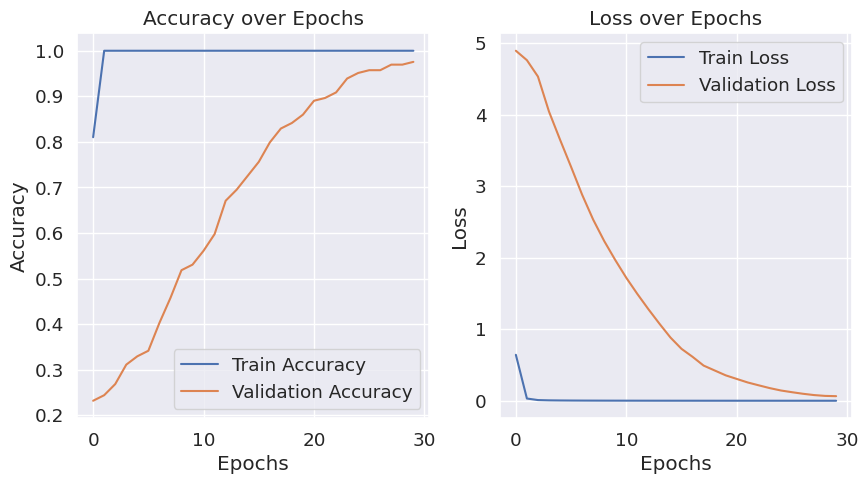

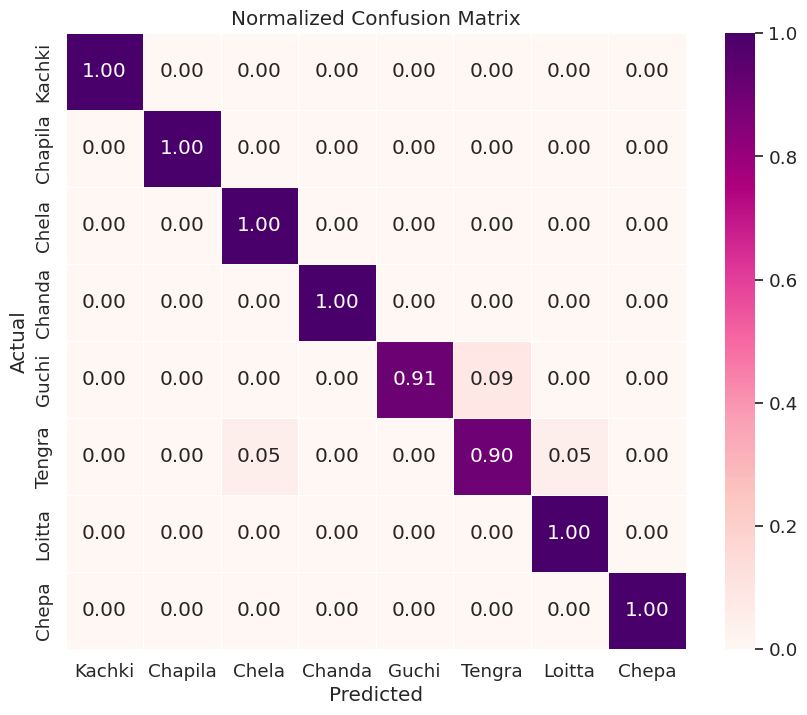

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


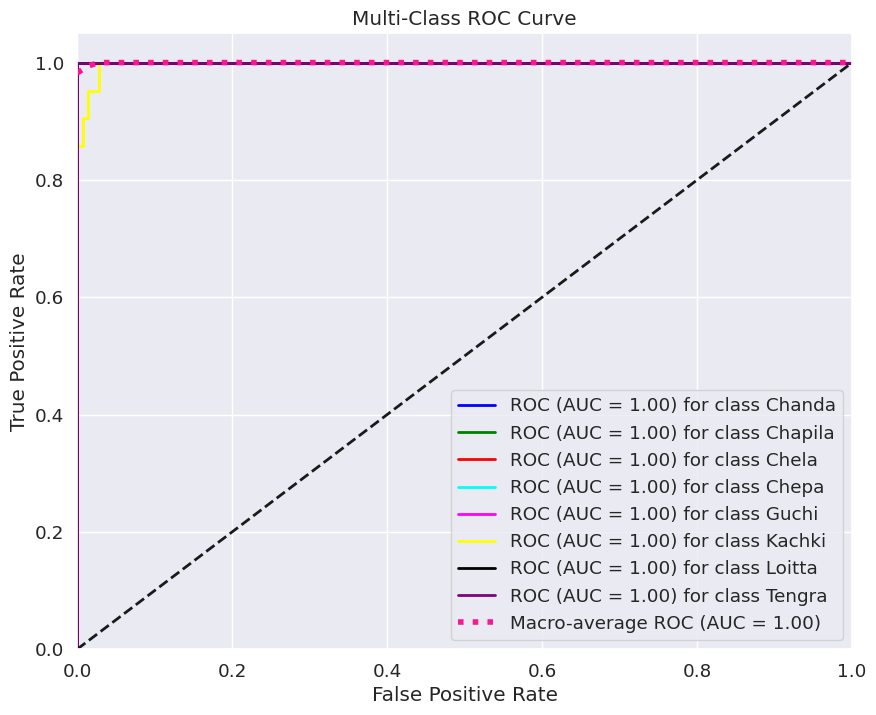

In [ ]:
# =====================================
# ✅ Reproducible MobileNetV2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=30,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=30,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/DF_Tail/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


✅ Reproducibility enabled with SEED = 33


/tmp/ipython-input-1014003714.py:39: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)


Model: "functional_30"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_30      │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 100, 100,  │        864 │ input_layer_30[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 100, 100,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 100, 100,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 100, 100,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 100, 100,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 100, 100,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 101, 101,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 50, 50,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 50, 50,    │      2,304 │ block_1_depthwis

 Total params: 2,268,232 (8.65 MB)

 Trainable params: 2,234,120 (8.52 MB)

 Non-trainable params: 34,112 (133.25 KB)

Epoch 1/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - accuracy: 0.6003 - loss: 1.2142 - val_accuracy: 0.3720 - val_loss: 2.0417
Epoch 2/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 89ms/step - accuracy: 0.9934 - loss: 0.0473 - val_accuracy: 0.3841 - val_loss: 1.8881
Epoch 3/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - accuracy: 0.9999 - loss: 0.0116 - val_accuracy: 0.4451 - val_loss: 1.7644
Epoch 4/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - accuracy: 0.9999 - loss: 0.0085 - val_accuracy: 0.4695 - val_loss: 1.7410
Epoch 5/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - accuracy: 0.9999 - loss: 0.0084 - val_accuracy: 0.5366 - val_loss: 1.6188
Epoch 6/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - accuracy: 1.0000 - loss: 0.0071 - val_accuracy: 0.5305 - val_loss: 1.6527
Epoch 7/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - accuracy: 1.0000 - loss: 0.0044 - val_accuracy: 0.5549 - val_loss: 1.4553
Epoch 8/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - accuracy: 1.0000 - loss: 0.0029 - val_accuracy: 0.5854

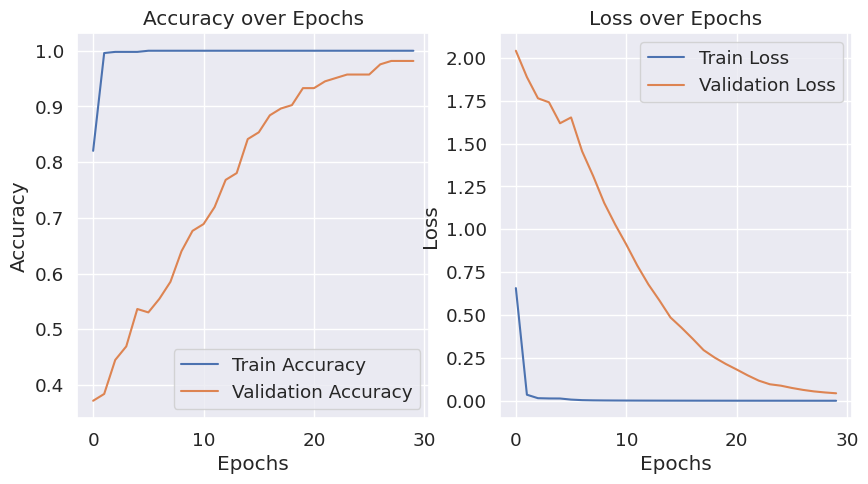

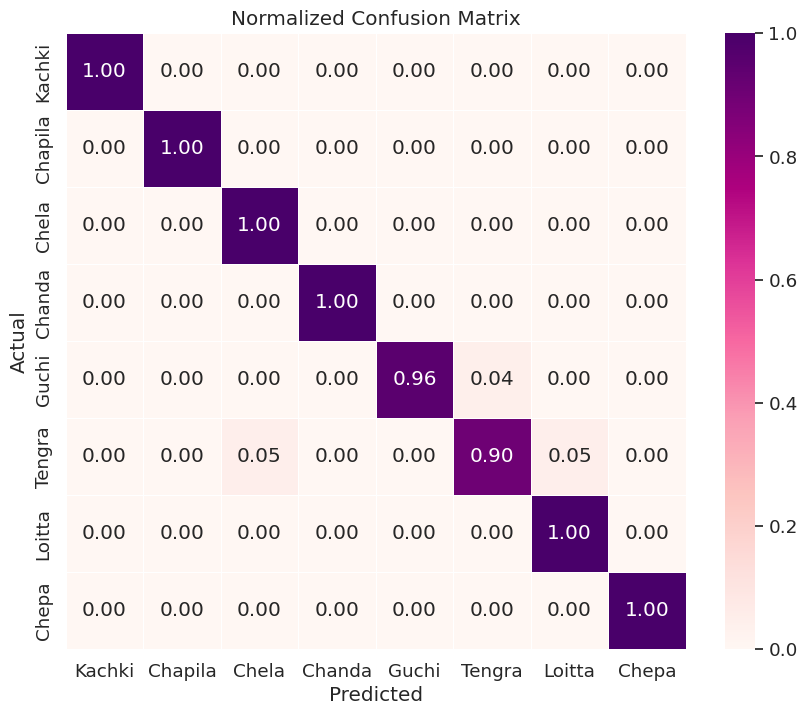

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


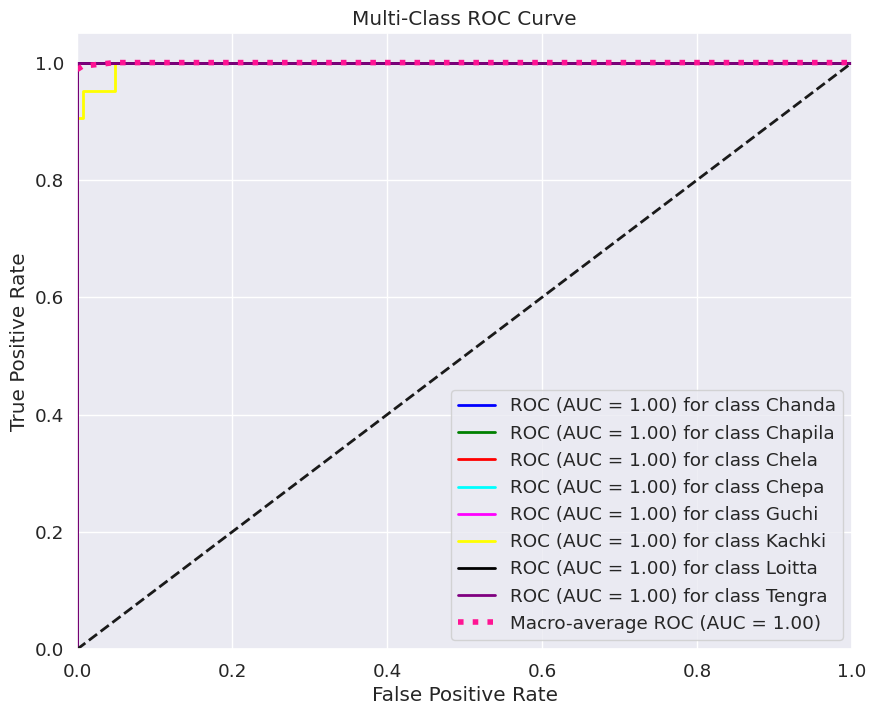

In [ ]:
# =====================================
# ✅ Reproducible MobileNetV2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 33

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=30,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=30,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/DF_Tail/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


✅ Reproducibility enabled with SEED = 25


/tmp/ipython-input-4090600943.py:39: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)


Model: "functional_31"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_31      │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 100, 100,  │        864 │ input_layer_31[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 100, 100,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 100, 100,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 100, 100,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 100, 100,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 100, 100,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 101, 101,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 50, 50,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 50, 50,    │      2,304 │ block_1_depthwis

 Total params: 2,268,232 (8.65 MB)

 Trainable params: 2,234,120 (8.52 MB)

 Non-trainable params: 34,112 (133.25 KB)

Epoch 1/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 43s 136ms/step - accuracy: 0.5941 - loss: 1.2287 - val_accuracy: 0.3902 - val_loss: 2.7357
Epoch 2/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - accuracy: 1.0000 - loss: 0.0482 - val_accuracy: 0.4024 - val_loss: 2.6152
Epoch 3/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - accuracy: 1.0000 - loss: 0.0117 - val_accuracy: 0.4207 - val_loss: 2.4178
Epoch 4/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 89ms/step - accuracy: 1.0000 - loss: 0.0071 - val_accuracy: 0.4268 - val_loss: 2.1585
Epoch 5/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - accuracy: 1.0000 - loss: 0.0051 - val_accuracy: 0.4878 - val_loss: 1.8989
Epoch 6/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - accuracy: 1.0000 - loss: 0.0039 - val_accuracy: 0.5183 - val_loss: 1.6628
Epoch 7/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 89ms/step - accuracy: 1.0000 - loss: 0.0031 - val_accuracy: 0.5610 - val_loss: 1.4709
Epoch 8/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - accuracy: 1.0000 - loss: 0.0025 - val_accuracy: 0.609

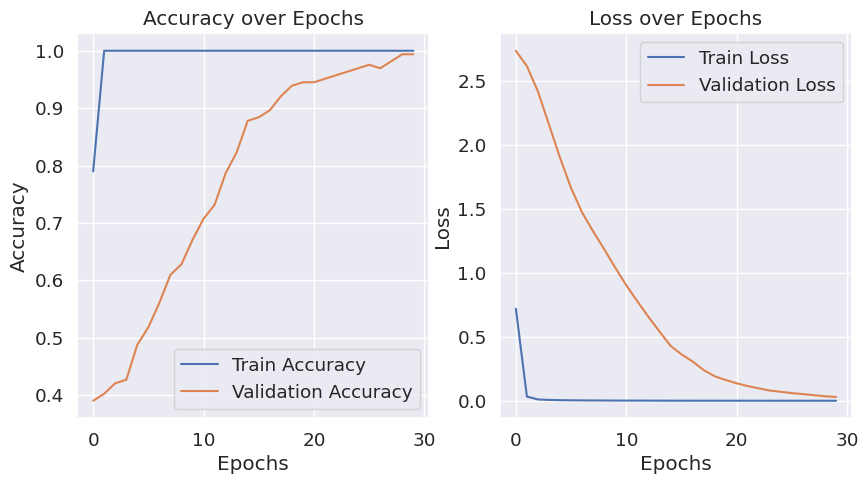

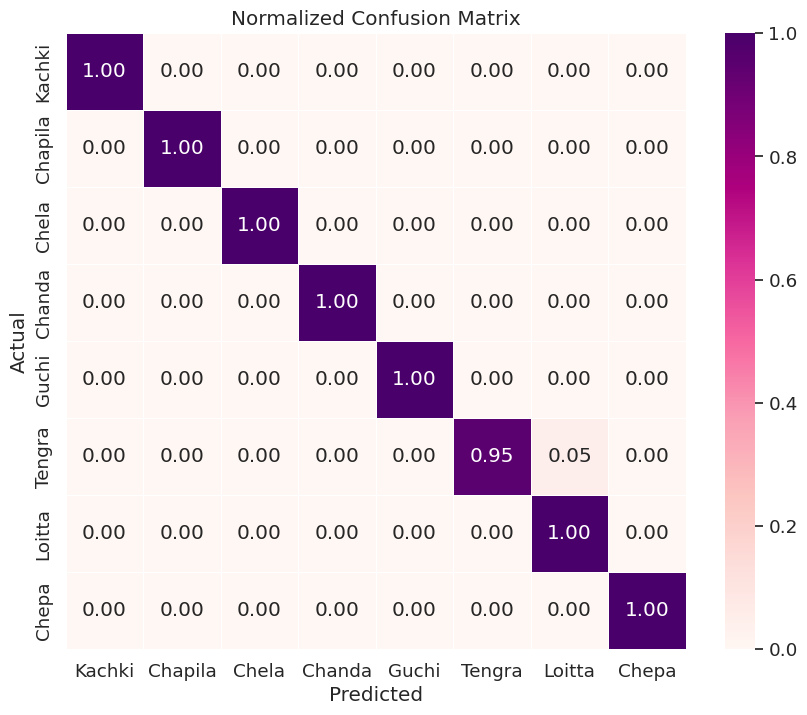

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


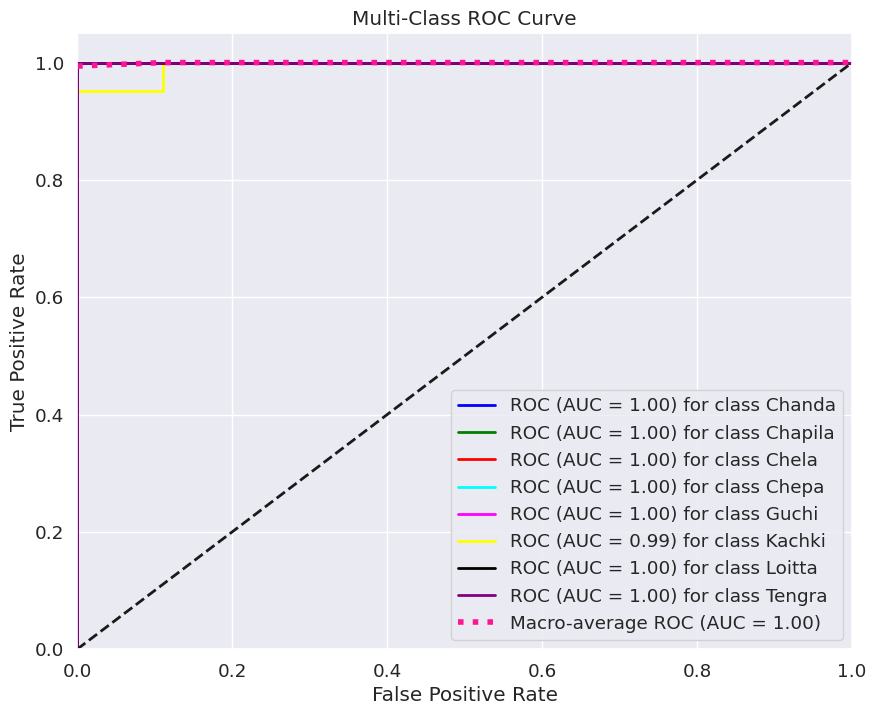

In [ ]:
# =====================================
# ✅ Reproducible MobileNetV2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 25

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=30,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=30,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/DF_Tail/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


#### ResNet50V2

✅ Reproducibility enabled with SEED = 42


Model: "functional_32"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_32      │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 206, 206,  │          0 │ input_layer_32[0… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 100, 100,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 102, 102,  │          0 │ conv1_conv[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 50, 50,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │        256 │ pool1_pool[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │          0 │ conv2_block1_pre… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 50, 50,    │      4,096 │ conv2_block1_pre… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 50, 50,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 50, 50,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_pad  │ (None, 52, 52,    │          0 │ conv2_block1_1_r… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 50, 50,    │     36,864 │ conv2_block1_2_p… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 50, 50,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 50, 50,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_pre… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_out    │ (None, 50, 50,    │          0 │ conv2_block1_0_c

 Total params: 23,581,192 (89.96 MB)

 Trainable params: 23,535,752 (89.78 MB)

 Non-trainable params: 45,440 (177.50 KB)

Epoch 1/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 53s 208ms/step - accuracy: 0.6684 - loss: 1.0866 - val_accuracy: 0.1341 - val_loss: 2.8165
Epoch 2/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - accuracy: 0.9742 - loss: 0.0848 - val_accuracy: 0.5732 - val_loss: 1.3363
Epoch 3/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - accuracy: 0.9749 - loss: 0.0586 - val_accuracy: 0.9512 - val_loss: 0.1839
Epoch 4/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - accuracy: 0.9979 - loss: 0.0182 - val_accuracy: 0.9939 - val_loss: 0.0099
Epoch 5/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - accuracy: 1.0000 - loss: 0.0048 - val_accuracy: 1.0000 - val_loss: 0.0021
Epoch 6/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - accuracy: 1.0000 - loss: 0.0016 - val_accuracy: 1.0000 - val_loss: 0.0020
Epoch 7/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - accuracy: 1.0000 - loss: 9.8258e-04 - val_accuracy: 1.0000 - val_loss: 0.0018
Epoch 8/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - accuracy: 1.0000 - loss: 7.6383e-04 - val

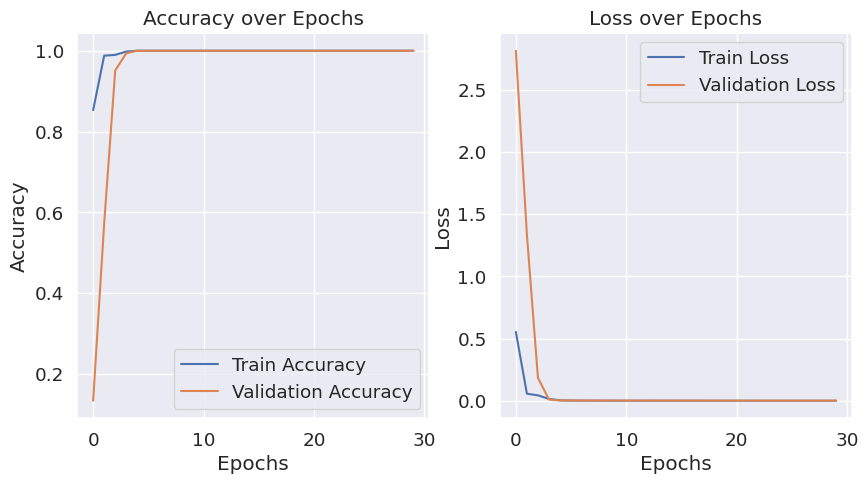

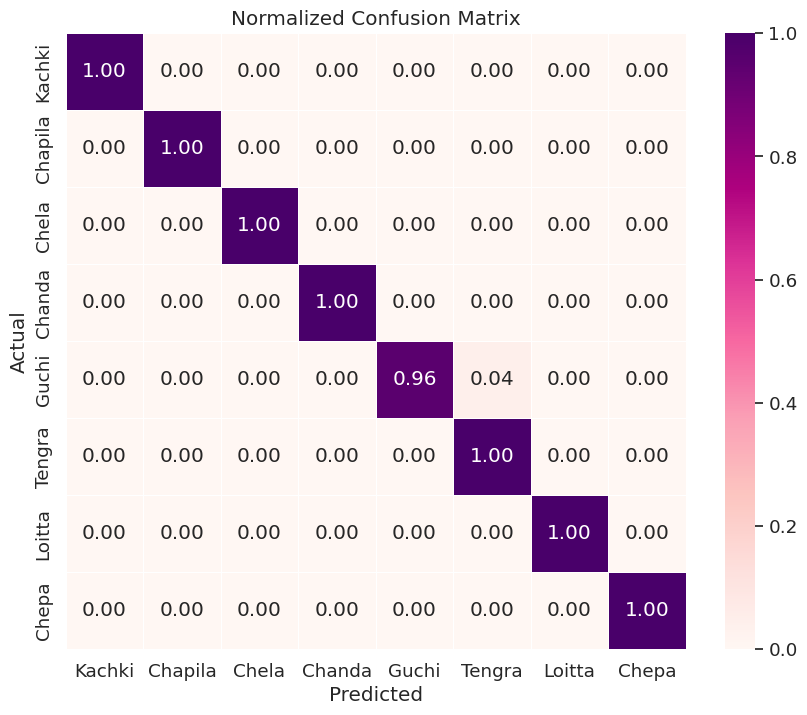

6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step 


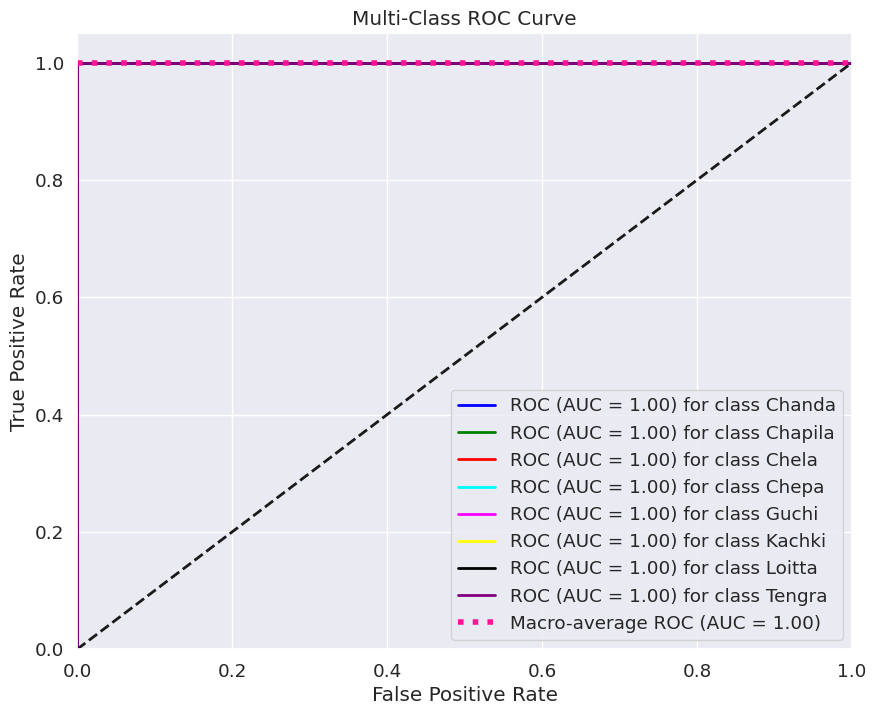

In [ ]:
# =====================================
# ✅ Reproducible ResNet50V2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = ResNet50V2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=30,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=30,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/DF_Tail/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


✅ Reproducibility enabled with SEED = 33


Model: "functional_33"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_33      │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 206, 206,  │          0 │ input_layer_33[0… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 100, 100,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 102, 102,  │          0 │ conv1_conv[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 50, 50,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │        256 │ pool1_pool[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │          0 │ conv2_block1_pre… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 50, 50,    │      4,096 │ conv2_block1_pre… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 50, 50,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 50, 50,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_pad  │ (None, 52, 52,    │          0 │ conv2_block1_1_r… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 50, 50,    │     36,864 │ conv2_block1_2_p… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 50, 50,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 50, 50,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_pre… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_out    │ (None, 50, 50,    │          0 │ conv2_block1_0_c

 Total params: 23,581,192 (89.96 MB)

 Trainable params: 23,535,752 (89.78 MB)

 Non-trainable params: 45,440 (177.50 KB)

Epoch 1/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 62s 197ms/step - accuracy: 0.6503 - loss: 1.0787 - val_accuracy: 0.1402 - val_loss: 3.6900
Epoch 2/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - accuracy: 0.9867 - loss: 0.0639 - val_accuracy: 0.8598 - val_loss: 0.3694
Epoch 3/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - accuracy: 0.9926 - loss: 0.0336 - val_accuracy: 0.9146 - val_loss: 0.2265
Epoch 4/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - accuracy: 1.0000 - loss: 0.0093 - val_accuracy: 0.9695 - val_loss: 0.1000
Epoch 5/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - accuracy: 1.0000 - loss: 0.0042 - val_accuracy: 0.9817 - val_loss: 0.0427
Epoch 6/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - accuracy: 1.0000 - loss: 0.0023 - val_accuracy: 0.9878 - val_loss: 0.0304
Epoch 7/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - accuracy: 1.0000 - loss: 0.0014 - val_accuracy: 0.9939 - val_loss: 0.0266
Epoch 8/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - accuracy: 1.0000 - loss: 9.5240e-04 - val_accura

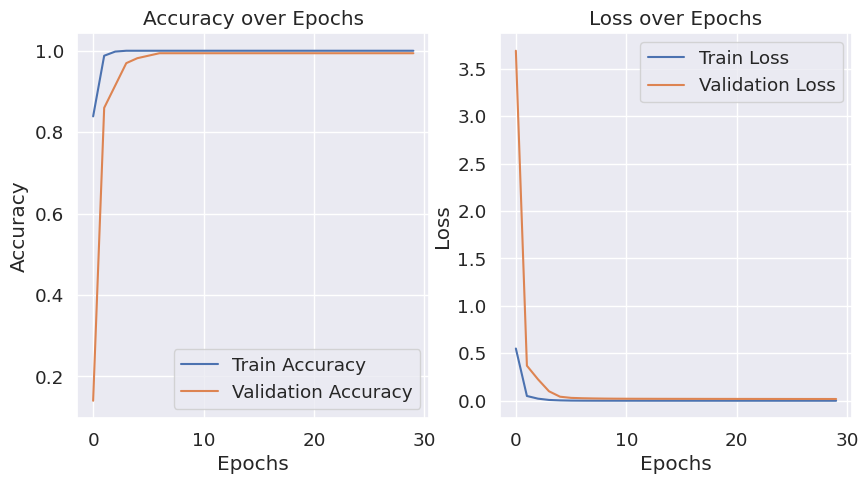

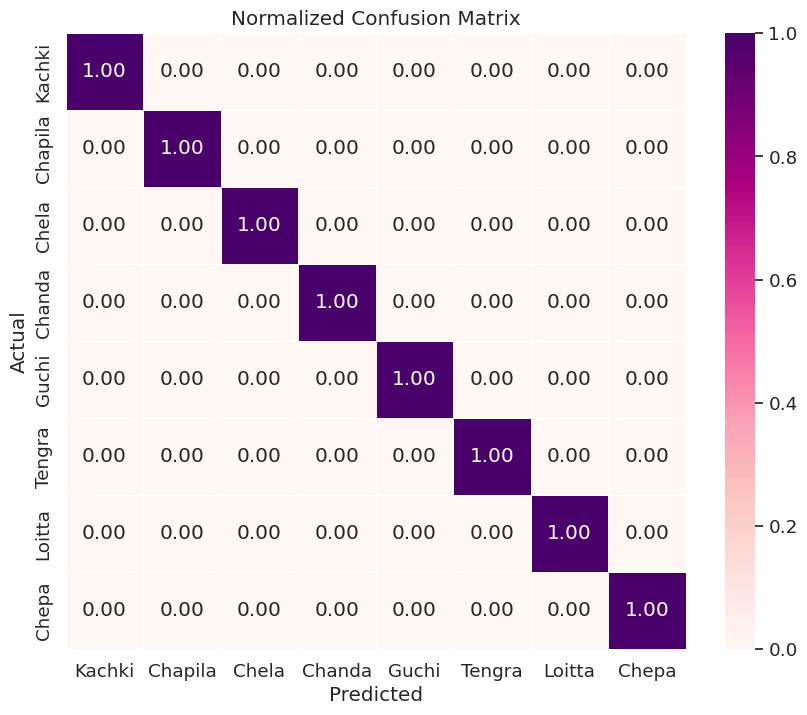

6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step 


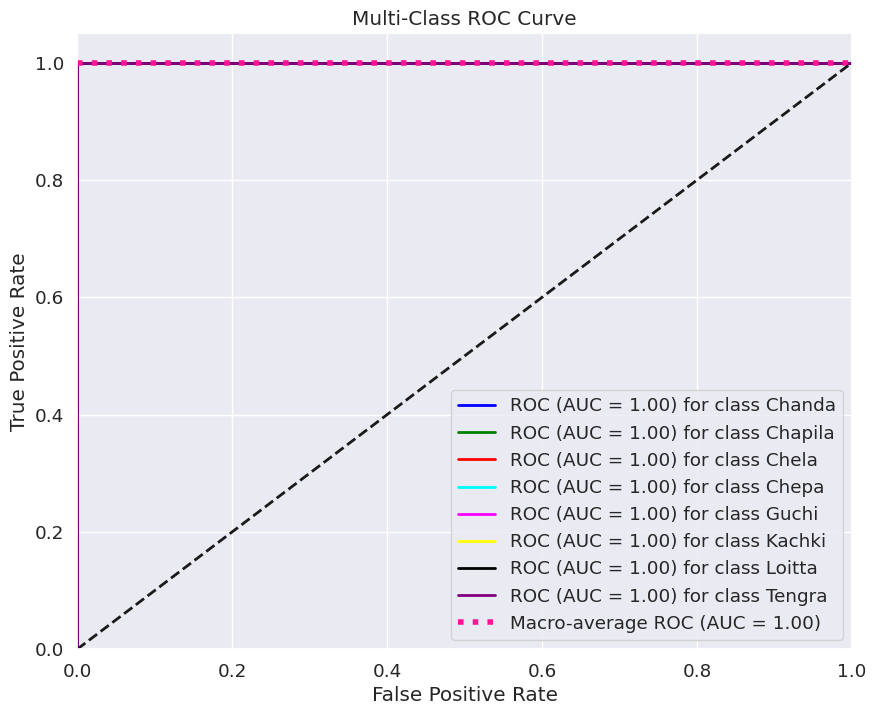

In [ ]:
# =====================================
# ✅ Reproducible ResNet50V2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 33

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = ResNet50V2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=30,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=30,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/DF_Tail/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


✅ Reproducibility enabled with SEED = 25


Model: "functional_34"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_34      │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 206, 206,  │          0 │ input_layer_34[0… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 100, 100,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 102, 102,  │          0 │ conv1_conv[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 50, 50,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │        256 │ pool1_pool[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │          0 │ conv2_block1_pre… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 50, 50,    │      4,096 │ conv2_block1_pre… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 50, 50,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 50, 50,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_pad  │ (None, 52, 52,    │          0 │ conv2_block1_1_r… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 50, 50,    │     36,864 │ conv2_block1_2_p… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 50, 50,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 50, 50,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_pre… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_out    │ (None, 50, 50,    │          0 │ conv2_block1_0_c

 Total params: 23,581,192 (89.96 MB)

 Trainable params: 23,535,752 (89.78 MB)

 Non-trainable params: 45,440 (177.50 KB)

Epoch 1/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 51s 197ms/step - accuracy: 0.6392 - loss: 1.1110 - val_accuracy: 0.1341 - val_loss: 3.4050
Epoch 2/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - accuracy: 0.9788 - loss: 0.0779 - val_accuracy: 0.8537 - val_loss: 0.5462
Epoch 3/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - accuracy: 0.9996 - loss: 0.0231 - val_accuracy: 0.9817 - val_loss: 0.0677
Epoch 4/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - accuracy: 0.9948 - loss: 0.0162 - val_accuracy: 0.9878 - val_loss: 0.0552
Epoch 5/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - accuracy: 1.0000 - loss: 0.0041 - val_accuracy: 1.0000 - val_loss: 0.0032
Epoch 6/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - accuracy: 1.0000 - loss: 0.0016 - val_accuracy: 1.0000 - val_loss: 0.0030
Epoch 7/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 9s 147ms/step - accuracy: 1.0000 - loss: 9.8603e-04 - val_accuracy: 1.0000 - val_loss: 0.0034
Epoch 8/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - accuracy: 1.0000 - loss: 7.6687e-04 - val_

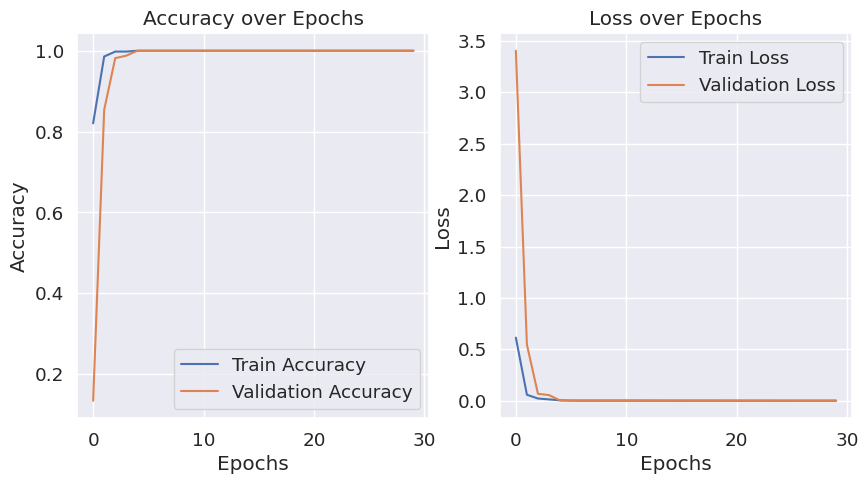

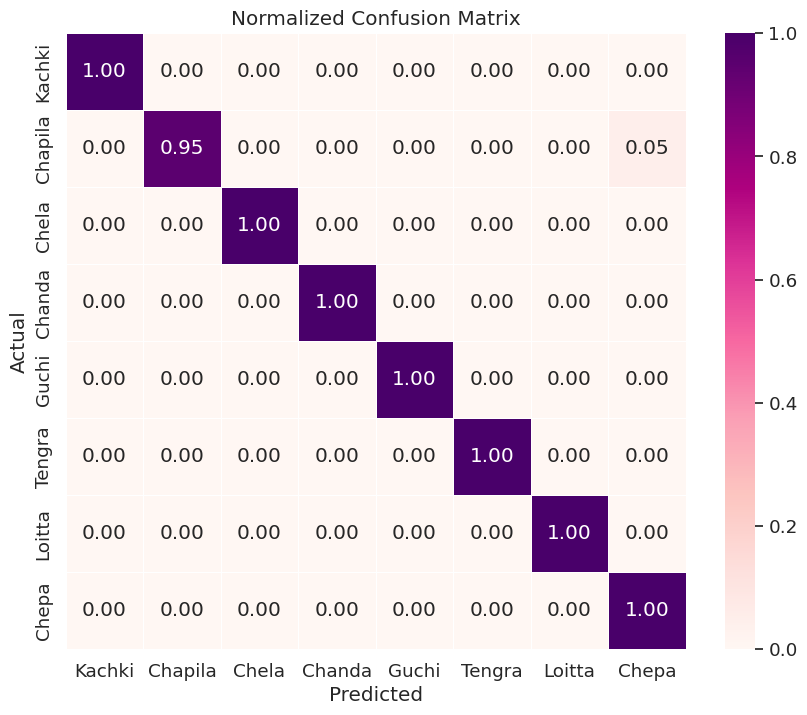

6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step 


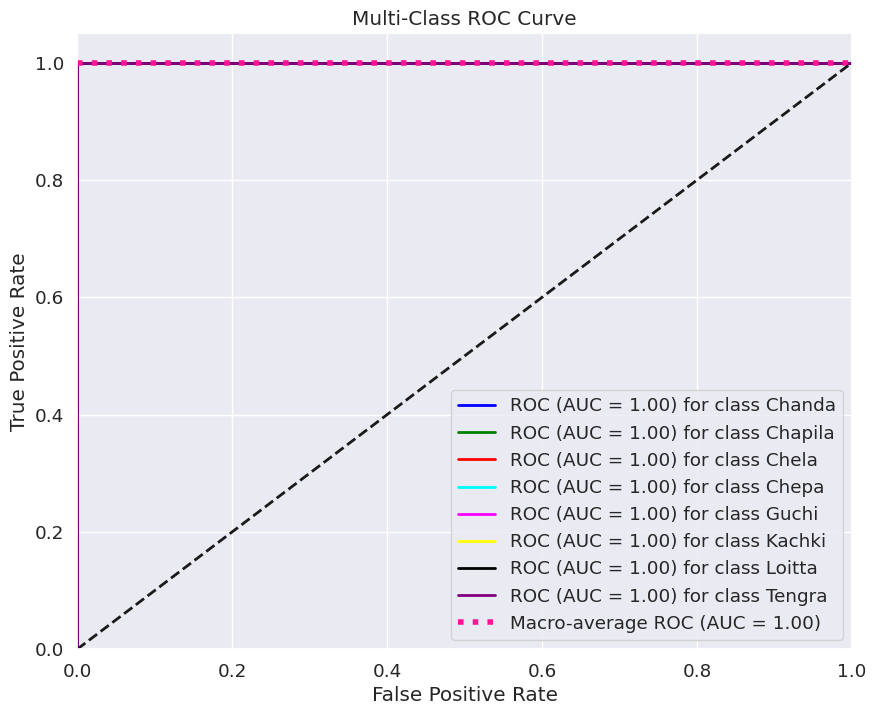

In [ ]:
# =====================================
# ✅ Reproducible ResNet50V2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 25

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = ResNet50V2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=30,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=30,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/DF_Tail/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


#DF Single

In [ ]:

# ========================================================
# ✅ Dataset Splitting (Train-Validation-Test set) Script
# ========================================================

import os
import random
import shutil

source_path = "/content/Original Dataset"
destination_path = "/content/train"

source_folder = os.listdir(source_path)

for i in source_folder:
    sub_folder = os.listdir(source_path+'/'+i)
    for j in sub_folder:
        sub_sub_folder_path = source_path + '/' + i + '/' + 'Single' + '/'

        destination_folder = destination_path + '/' + i + '/'
        selection_ratio = 0.6  # 0.6 -> 60%, 0.5 -> 50%, 1 ->100%

        image_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.gif', '.tiff')

        def collect_images(folder_path):
            image_paths = []
            for root, _, files in os.walk(folder_path):
                for file in files:
                    if file.lower().endswith(image_extensions):
                        full_path = os.path.join(root, file)
                        image_paths.append(full_path)
            return image_paths

        def copy_selected_images(images, dest_folder, ratio):
            os.makedirs(dest_folder, exist_ok=True)
            num_to_select = int(len(images) * ratio)
            selected_images = random.sample(images, num_to_select)

            for img_path in selected_images:
                filename = os.path.basename(img_path)
                dest_path = os.path.join(dest_folder, filename)
                shutil.move(img_path, dest_path)  # <-- move instead of copy2
                print(f"Moved: {filename}")

        if __name__ == "__main__":
            all_images = collect_images(sub_sub_folder_path)
            print(f"Found {len(all_images)} images.")
            copy_selected_images(all_images, destination_folder, selection_ratio)
        break

Found 25 images.
Moved: Kachki_Single_36.jpg
Moved: Kachki_Single_118.jpg
Moved: Kachki_Single_10.jpg
Moved: Kachki_Single_81.jpg
Moved: Kachki_Single_14.jpg
Moved: Kachki_Single_44.jpg
Moved: Kachki_Single_99.jpg
Moved: Kachki_Single_26.jpg
Moved: Kachki_Single_100.jpg
Moved: Kachki_Single_51.jpg
Moved: Kachki_Single_116.jpg
Moved: Kachki_Single_60.jpg
Moved: Kachki_Single_93.jpg
Moved: Kachki_Single_110.jpg
Moved: Kachki_Single_80.jpg
Moved: Kachki_Single_21.jpg
Moved: Kachki_Single_2.jpg
Moved: Kachki_Single_82.jpg
Moved: Kachki_Single_34.jpg
Moved: Kachki_Single_65.jpg
Moved: Kachki_Single_45.jpg
Moved: Kachki_Single_4.jpg
Moved: Kachki_Single_117.jpg
Moved: Kachki_Single_73.jpg
Moved: Kachki_Single_91.jpg
Found 24 images.
Moved: Chapila_Single_33.jpg
Moved: Chapila_Single_25.jpg
Moved: Chapila_Single_53.jpg
Moved: Chapila_Single_46.jpg
Moved: Chapila_Single_96.jpg
Moved: Chapila_Single_2.jpg
Moved: Chapila_Single_103.jpg
Moved: Chapila_Single_39.jpg
Moved: Chapila_Single_5.jpg
Mov

In [3]:
import numpy as np
import pandas as pd
import os
from sklearn.metrics import classification_report
import seaborn as sn
from sklearn.utils import shuffle
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
from tqdm import tqdm

class_names= os.listdir('/content/drive/MyDrive/Single_DF/train')

class_names_labels={class_name:i for i, class_name in enumerate(class_names)}

print(class_names_labels)

nb_classes=len(class_names)

IMAGE_SIZE=(200,200)

def load_data():
    direct='/content/drive/MyDrive/Single_DF'
    category=['train','valid','test']

    output=[]

    for cat in category:
      path=os.path.join(direct,cat)
      print(path)

      images=[]
      labels=[]

      for folder in os.listdir(path):
        print("folder:",folder)
        label= class_names_labels[folder]
        i=0
        #Iterating each image
        for fle in os.listdir(os.path.join(path,folder)):

          img_path=os.path.join(os.path.join(path,folder),fle)

          image=cv2.imread(img_path)

          image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
          image=cv2.resize(image,IMAGE_SIZE)

          images.append(image)
          labels.append(label)

      images=np.array(images,dtype='float32')
      labels=np.array(labels,dtype='int32')

      output.append((images,labels))
    #print(type(output[0]))
    return output

(train_images,train_lables), (valid_images,valid_lables), (test_images,test_lables) = load_data()

{'Chapila': 0, 'Chela': 1, 'Guchi': 2, 'Kachki': 3, 'Chanda': 4, 'Tengra': 5, 'Chepa': 6, 'Loitta': 7}
/content/drive/MyDrive/Single_DF/train
folder: Chapila
folder: Chela
folder: Guchi
folder: Kachki
folder: Chanda
folder: Tengra
folder: Chepa
folder: Loitta
/content/drive/MyDrive/Single_DF/valid
folder: Guchi
folder: Chapila
folder: Chanda
folder: Chela
folder: Chepa
folder: Tengra
folder: Loitta
folder: Kachki
/content/drive/MyDrive/Single_DF/test
folder: Loitta
folder: Tengra
folder: Guchi
folder: Kachki
folder: Chanda
folder: Chela
folder: Chepa
folder: Chapila


#### MobileNetV2

✅ Reproducibility enabled with SEED = 42


/tmp/ipython-input-372805.py:39: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)


Model: "functional_24"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_24      │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 100, 100,  │        864 │ input_layer_24[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 100, 100,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 100, 100,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 100, 100,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 100, 100,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 100, 100,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 101, 101,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 50, 50,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 50, 50,    │      2,304 │ block_1_depthwis

 Total params: 2,268,232 (8.65 MB)

 Trainable params: 2,234,120 (8.52 MB)

 Non-trainable params: 34,112 (133.25 KB)

Epoch 1/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 35s 128ms/step - accuracy: 0.6204 - loss: 1.2347 - val_accuracy: 0.3824 - val_loss: 2.6663
Epoch 2/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - accuracy: 1.0000 - loss: 0.0383 - val_accuracy: 0.3941 - val_loss: 2.8285
Epoch 3/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 1.0000 - loss: 0.0109 - val_accuracy: 0.4235 - val_loss: 2.8471
Epoch 4/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 89ms/step - accuracy: 1.0000 - loss: 0.0067 - val_accuracy: 0.4294 - val_loss: 2.8593
Epoch 5/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - accuracy: 1.0000 - loss: 0.0048 - val_accuracy: 0.4353 - val_loss: 2.8534
Epoch 6/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - accuracy: 1.0000 - loss: 0.0036 - val_accuracy: 0.4353 - val_loss: 2.8631
Epoch 7/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - accuracy: 1.0000 - loss: 0.0029 - val_accuracy: 0.4294 - val_loss: 2.8874
Epoch 8/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - accuracy: 1.0000 - loss: 0.0024 - val_accuracy: 0.4294 

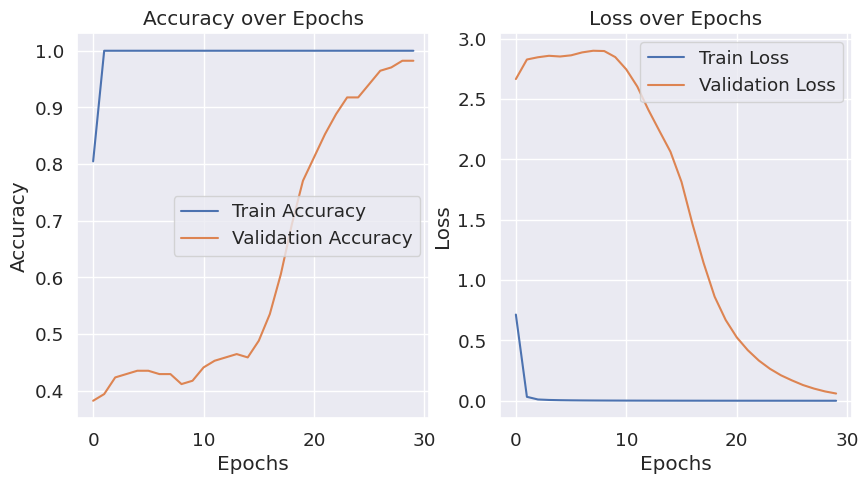

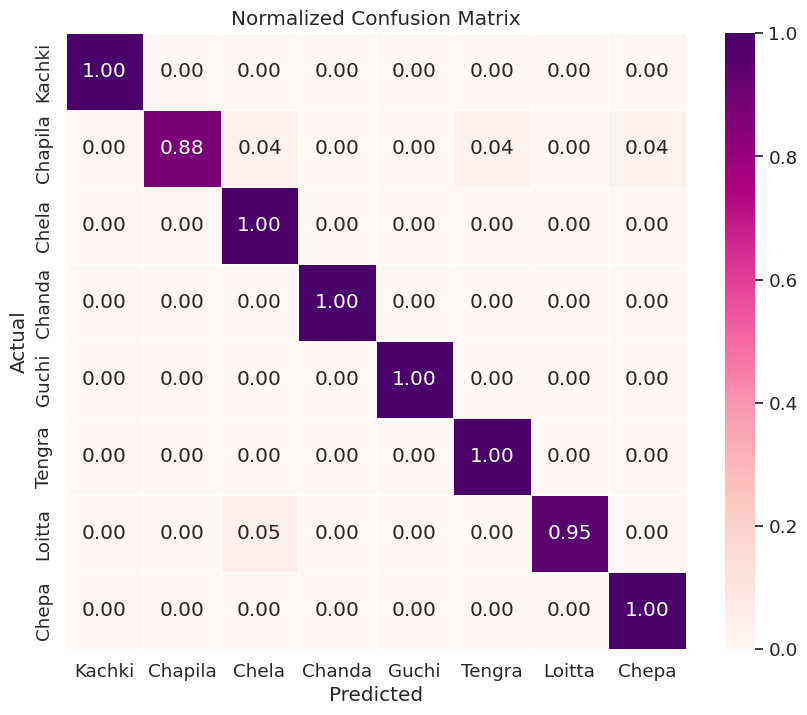

6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step


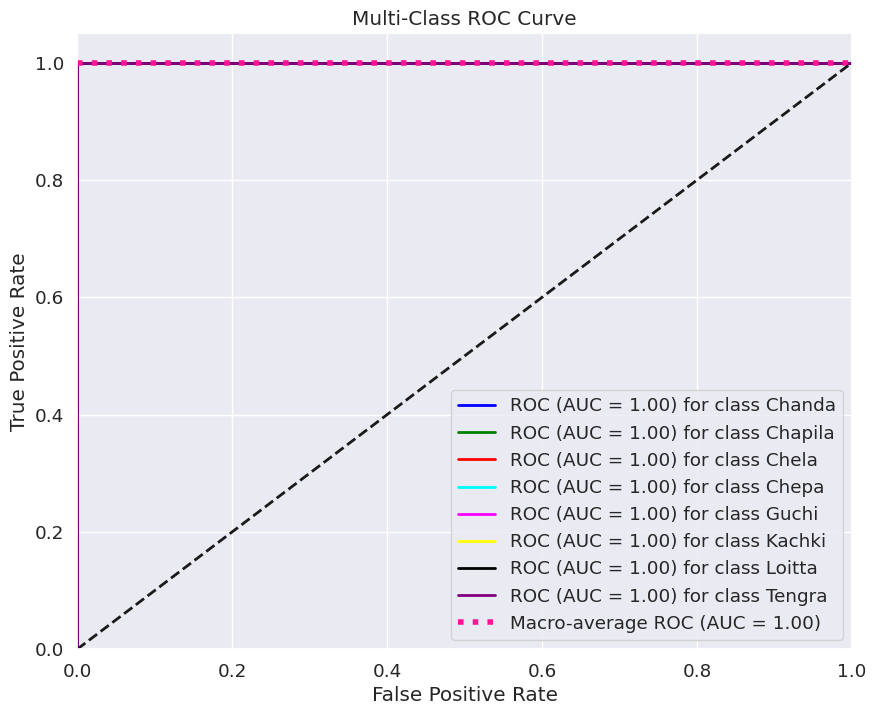

In [ ]:
# =====================================
# ✅ Reproducible MobileNetV2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=30,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=30,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/Single_DF/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


✅ Reproducibility enabled with SEED = 33


/tmp/ipython-input-2488014685.py:39: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)


Model: "functional_26"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_26      │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 100, 100,  │        864 │ input_layer_26[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 100, 100,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 100, 100,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 100, 100,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 100, 100,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 100, 100,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 101, 101,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 50, 50,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 50, 50,    │      2,304 │ block_1_depthwis

 Total params: 2,268,232 (8.65 MB)

 Trainable params: 2,234,120 (8.52 MB)

 Non-trainable params: 34,112 (133.25 KB)

Epoch 1/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 47s 135ms/step - accuracy: 0.5849 - loss: 1.2213 - val_accuracy: 0.4235 - val_loss: 2.6631
Epoch 2/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - accuracy: 1.0000 - loss: 0.0355 - val_accuracy: 0.4176 - val_loss: 2.5144
Epoch 3/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - accuracy: 1.0000 - loss: 0.0113 - val_accuracy: 0.4471 - val_loss: 2.3773
Epoch 4/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 1.0000 - loss: 0.0065 - val_accuracy: 0.4471 - val_loss: 2.4117
Epoch 5/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - accuracy: 1.0000 - loss: 0.0047 - val_accuracy: 0.4294 - val_loss: 2.4346
Epoch 6/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - accuracy: 1.0000 - loss: 0.0035 - val_accuracy: 0.4294 - val_loss: 2.4079
Epoch 7/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - accuracy: 1.0000 - loss: 0.0028 - val_accuracy: 0.4118 - val_loss: 2.3981
Epoch 8/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 7s 109ms/step - accuracy: 1.0000 - loss: 0.0023 - val_accuracy: 0.4294

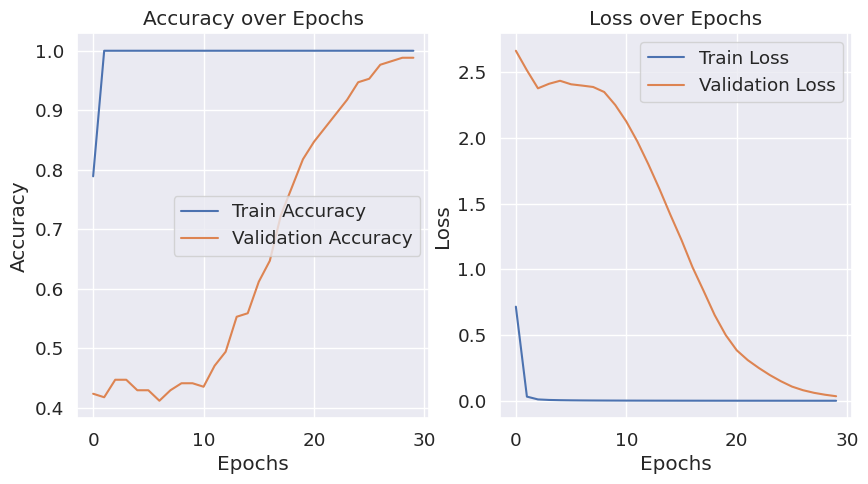

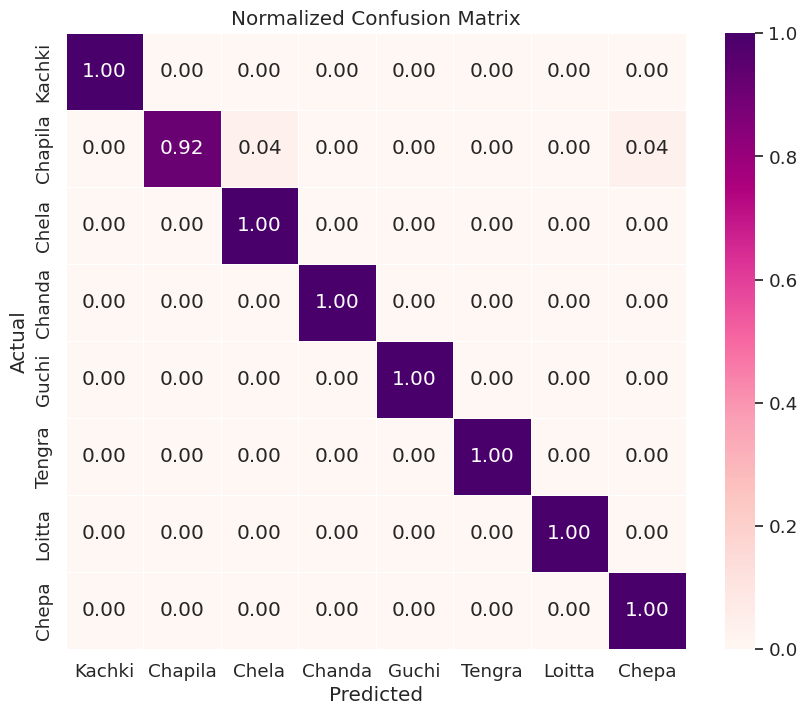

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


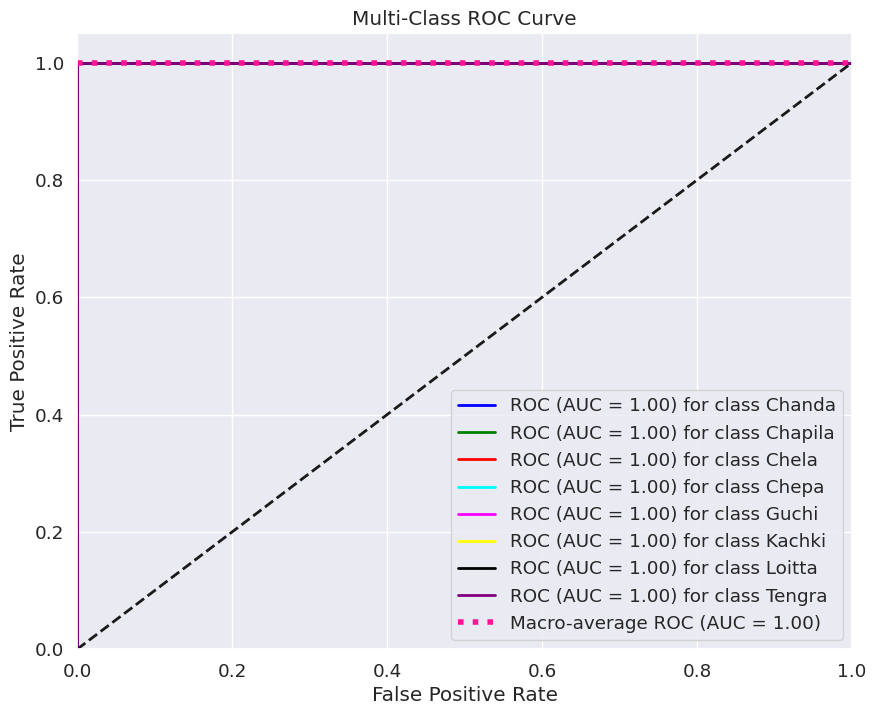

In [ ]:
# =====================================
# ✅ Reproducible MobileNetV2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 33

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=30,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=30,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/Single_DF/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


✅ Reproducibility enabled with SEED = 25


/tmp/ipython-input-2811699018.py:39: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)


Model: "functional_27"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_27      │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 100, 100,  │        864 │ input_layer_27[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 100, 100,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 100, 100,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 100, 100,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 100, 100,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 100, 100,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 101, 101,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 50, 50,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 50, 50,    │      2,304 │ block_1_depthwis

 Total params: 2,268,232 (8.65 MB)

 Trainable params: 2,234,120 (8.52 MB)

 Non-trainable params: 34,112 (133.25 KB)

Epoch 1/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 34s 122ms/step - accuracy: 0.4962 - loss: 1.5197 - val_accuracy: 0.3353 - val_loss: 3.0613
Epoch 2/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - accuracy: 0.9935 - loss: 0.0783 - val_accuracy: 0.4529 - val_loss: 2.7213
Epoch 3/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - accuracy: 1.0000 - loss: 0.0194 - val_accuracy: 0.4765 - val_loss: 2.4169
Epoch 4/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - accuracy: 1.0000 - loss: 0.0107 - val_accuracy: 0.5000 - val_loss: 2.2160
Epoch 5/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - accuracy: 1.0000 - loss: 0.0075 - val_accuracy: 0.5000 - val_loss: 2.0093
Epoch 6/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - accuracy: 1.0000 - loss: 0.0057 - val_accuracy: 0.5176 - val_loss: 1.8950
Epoch 7/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 1.0000 - loss: 0.0045 - val_accuracy: 0.4941 - val_loss: 1.8495
Epoch 8/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - accuracy: 1.0000 - loss: 0.0036 - val_accuracy: 0.5000

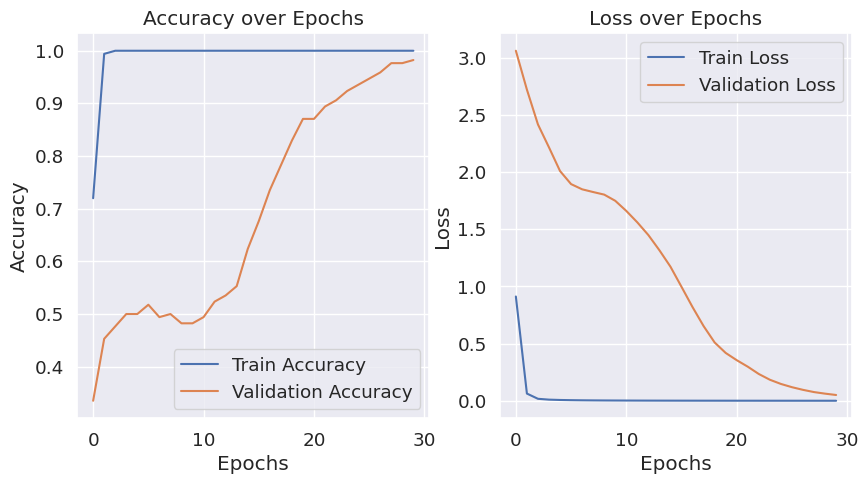

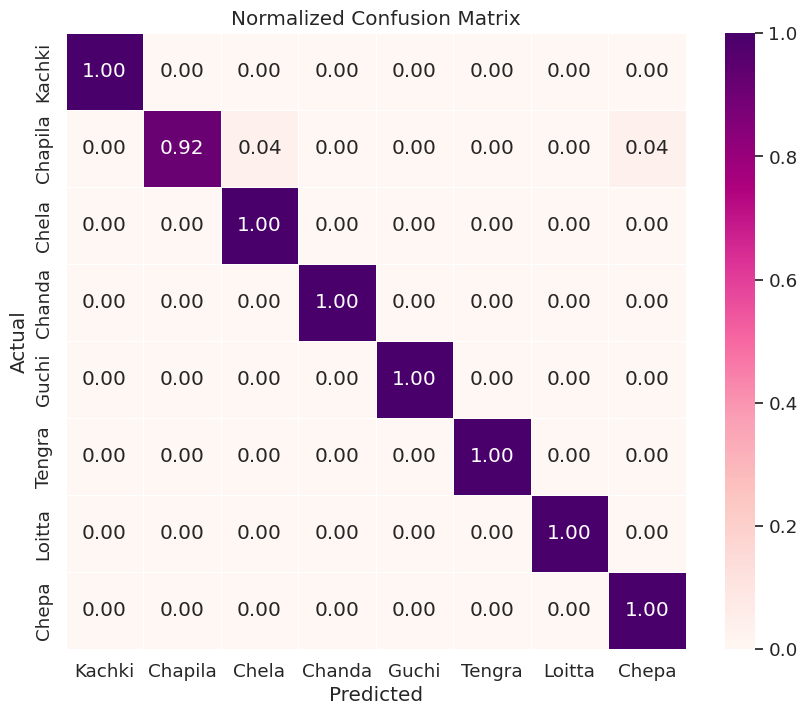

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


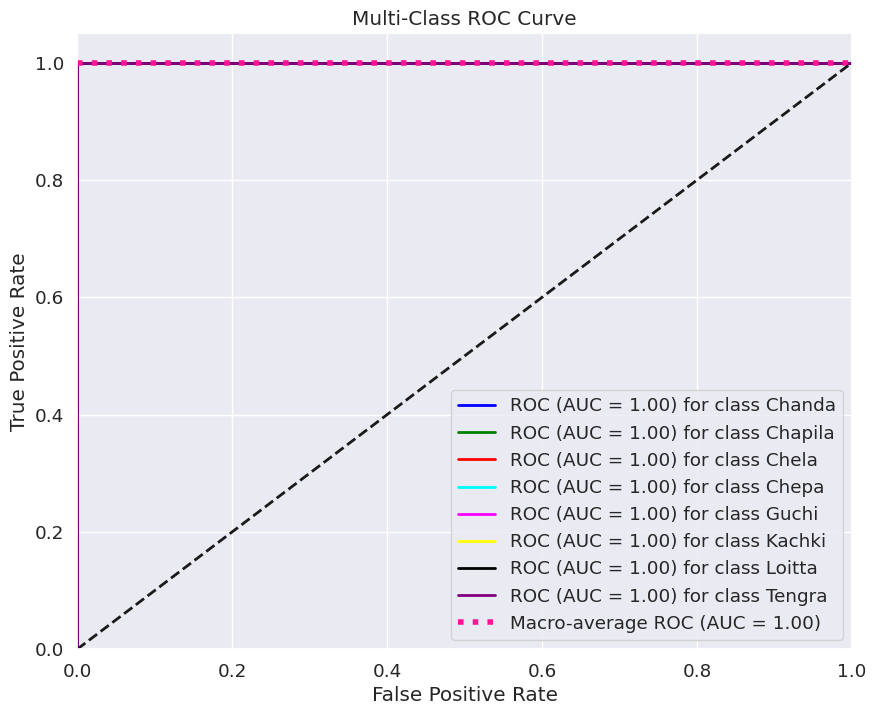

In [ ]:
# =====================================
# ✅ Reproducible MobileNetV2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 25

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=30,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=30,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/Single_DF/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


#### ResNet50V2

✅ Reproducibility enabled with SEED = 42


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 206, 206,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 100, 100,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 102, 102,  │          0 │ conv1_conv[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 50, 50,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │        256 │ pool1_pool[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │          0 │ conv2_block1_pre… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 50, 50,    │      4,096 │ conv2_block1_pre… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 50, 50,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 50, 50,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_pad  │ (None, 52, 52,    │          0 │ conv2_block1_1_r… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 50, 50,    │     36,864 │ conv2_block1_2_p… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 50, 50,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 50, 50,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_pre… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_out    │ (None, 50, 50,    │          0 │ conv2_block1_0_c

 Total params: 23,581,192 (89.96 MB)

 Trainable params: 23,535,752 (89.78 MB)

 Non-trainable params: 45,440 (177.50 KB)

Epoch 1/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 47s 200ms/step - accuracy: 0.6365 - loss: 1.1632 - val_accuracy: 0.1471 - val_loss: 3.1171
Epoch 2/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - accuracy: 0.9873 - loss: 0.0522 - val_accuracy: 0.6941 - val_loss: 1.0557
Epoch 3/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - accuracy: 0.9987 - loss: 0.0131 - val_accuracy: 0.8824 - val_loss: 0.4396
Epoch 4/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - accuracy: 1.0000 - loss: 0.0076 - val_accuracy: 0.9941 - val_loss: 0.0368
Epoch 5/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.9941 - val_loss: 0.0298
Epoch 6/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - accuracy: 1.0000 - loss: 0.0019 - val_accuracy: 0.9941 - val_loss: 0.0172
Epoch 7/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - accuracy: 1.0000 - loss: 9.9534e-04 - val_accuracy: 0.9941 - val_loss: 0.0139
Epoch 8/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - accuracy: 1.0000 - loss: 7.3173e-04 - 

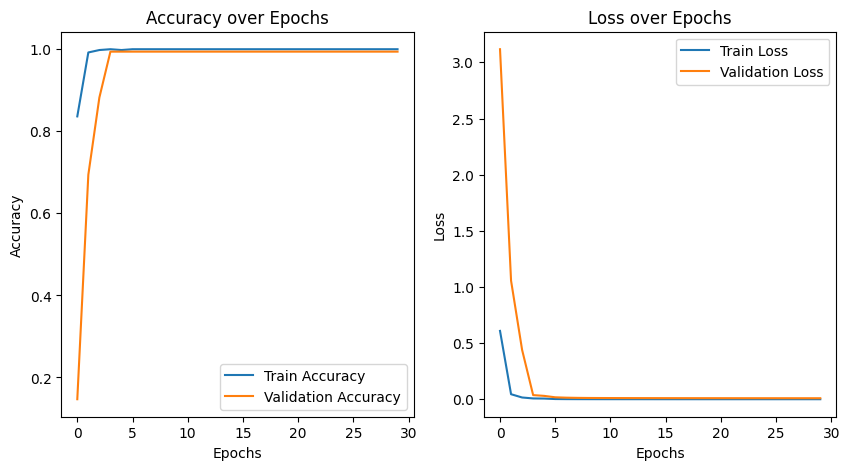

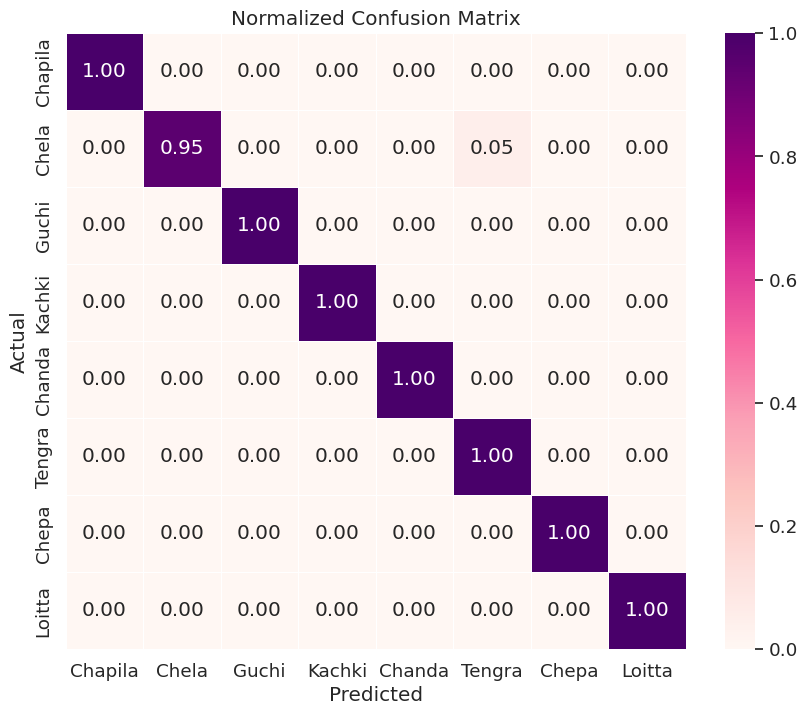

6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step 


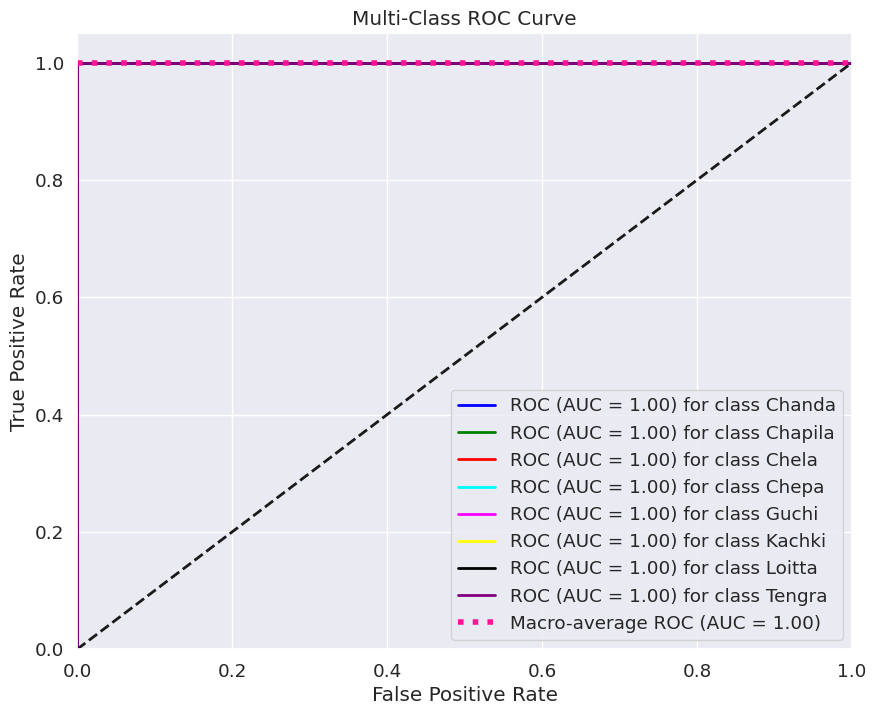

In [4]:
# =====================================
# ✅ Reproducible ResNet50V2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = ResNet50V2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=30,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=30,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/Single_DF/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


✅ Reproducibility enabled with SEED = 33


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 206, 206,  │          0 │ input_layer_2[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 100, 100,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 102, 102,  │          0 │ conv1_conv[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 50, 50,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │        256 │ pool1_pool[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │          0 │ conv2_block1_pre… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 50, 50,    │      4,096 │ conv2_block1_pre… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 50, 50,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 50, 50,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_pad  │ (None, 52, 52,    │          0 │ conv2_block1_1_r… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 50, 50,    │     36,864 │ conv2_block1_2_p… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 50, 50,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 50, 50,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_pre… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_out    │ (None, 50, 50,    │          0 │ conv2_block1_0_c

 Total params: 23,581,192 (89.96 MB)

 Trainable params: 23,535,752 (89.78 MB)

 Non-trainable params: 45,440 (177.50 KB)

Epoch 1/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 42s 203ms/step - accuracy: 0.6072 - loss: 1.1780 - val_accuracy: 0.1176 - val_loss: 3.3014
Epoch 2/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - accuracy: 0.9878 - loss: 0.0673 - val_accuracy: 0.5294 - val_loss: 1.5691
Epoch 3/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - accuracy: 1.0000 - loss: 0.0165 - val_accuracy: 0.7176 - val_loss: 0.7760
Epoch 4/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - accuracy: 1.0000 - loss: 0.0046 - val_accuracy: 0.9706 - val_loss: 0.0710
Epoch 5/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - accuracy: 1.0000 - loss: 0.0018 - val_accuracy: 1.0000 - val_loss: 0.0114
Epoch 6/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - accuracy: 1.0000 - loss: 0.0013 - val_accuracy: 1.0000 - val_loss: 0.0081
Epoch 7/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 9s 148ms/step - accuracy: 1.0000 - loss: 0.0010 - val_accuracy: 1.0000 - val_loss: 0.0068
Epoch 8/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - accuracy: 1.0000 - loss: 8.2772e-04 - val_a

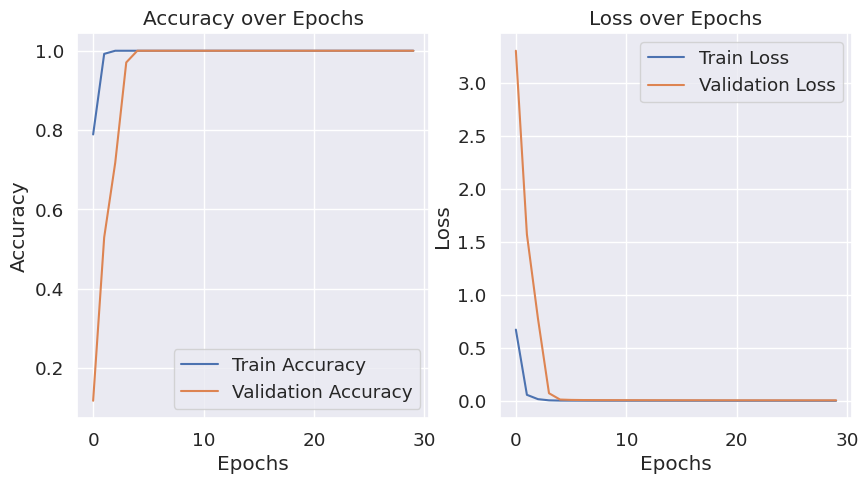

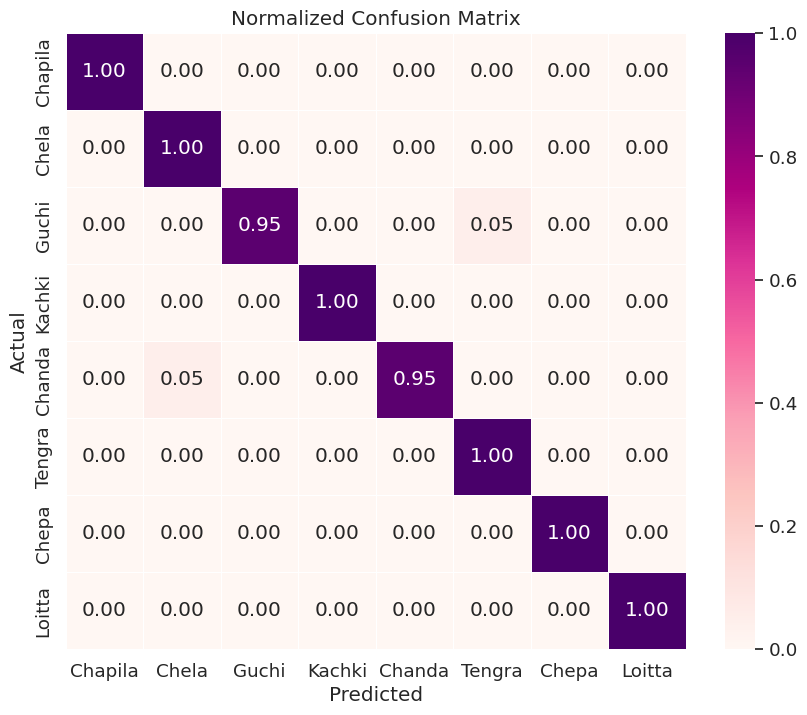

6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step 


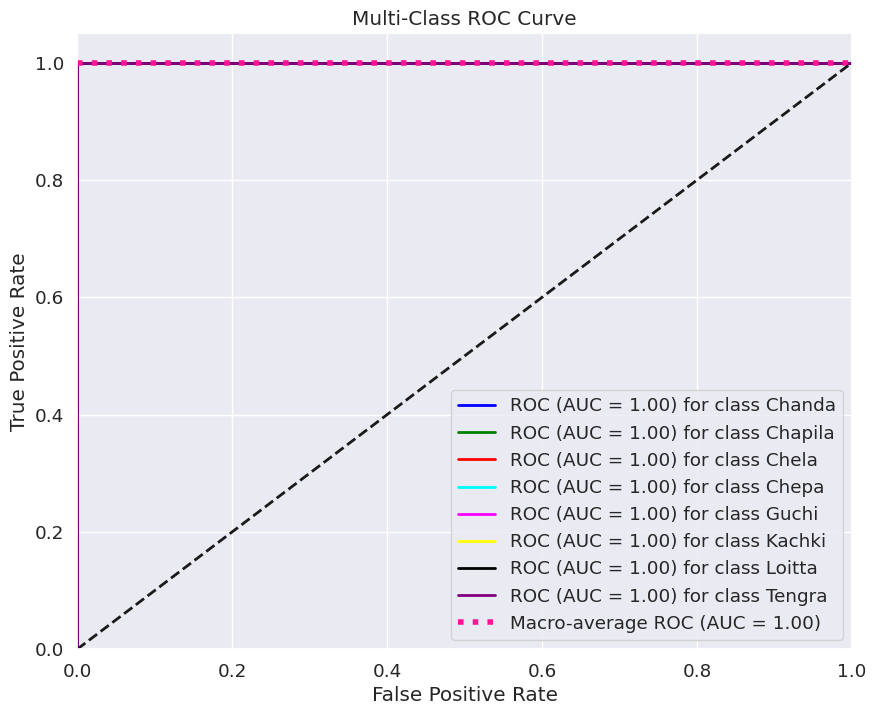

In [5]:
# =====================================
# ✅ Reproducible ResNet50V2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 33

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = ResNet50V2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=30,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=30,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/Single_DF/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


✅ Reproducibility enabled with SEED = 25


Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 206, 206,  │          0 │ input_layer_4[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 100, 100,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 102, 102,  │          0 │ conv1_conv[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 50, 50,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │        256 │ pool1_pool[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │          0 │ conv2_block1_pre… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 50, 50,    │      4,096 │ conv2_block1_pre… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 50, 50,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 50, 50,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_pad  │ (None, 52, 52,    │          0 │ conv2_block1_1_r… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 50, 50,    │     36,864 │ conv2_block1_2_p… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 50, 50,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 50, 50,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_pre… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_out    │ (None, 50, 50,    │          0 │ conv2_block1_0_c

 Total params: 23,581,192 (89.96 MB)

 Trainable params: 23,535,752 (89.78 MB)

 Non-trainable params: 45,440 (177.50 KB)

Epoch 1/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 42s 196ms/step - accuracy: 0.5690 - loss: 1.2966 - val_accuracy: 0.1529 - val_loss: 4.1029
Epoch 2/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - accuracy: 0.9860 - loss: 0.0935 - val_accuracy: 0.5059 - val_loss: 1.4504
Epoch 3/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - accuracy: 0.9902 - loss: 0.0387 - val_accuracy: 0.9471 - val_loss: 0.1842
Epoch 4/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - accuracy: 1.0000 - loss: 0.0121 - val_accuracy: 0.9882 - val_loss: 0.0273
Epoch 5/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - accuracy: 1.0000 - loss: 0.0040 - val_accuracy: 1.0000 - val_loss: 0.0101
Epoch 6/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - accuracy: 1.0000 - loss: 0.0018 - val_accuracy: 1.0000 - val_loss: 0.0069
Epoch 7/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - accuracy: 1.0000 - loss: 0.0013 - val_accuracy: 1.0000 - val_loss: 0.0062
Epoch 8/30
64/64 ━━━━━━━━━━━━━━━━━━━━ 9s 148ms/step - accuracy: 1.0000 - loss: 0.0011 - val_accur

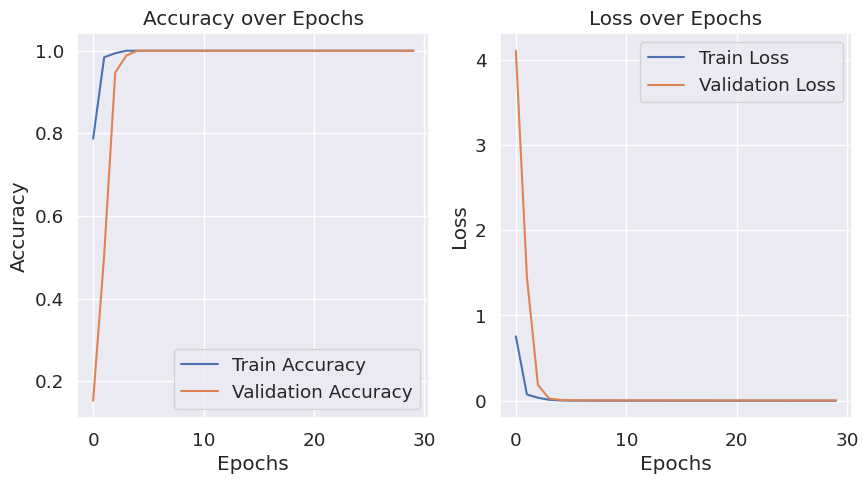

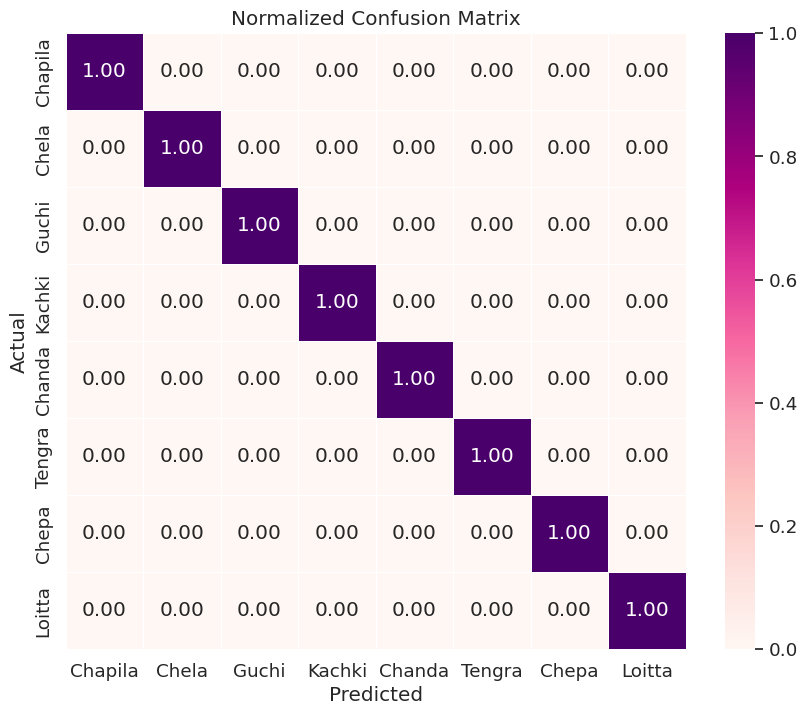

6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 105ms/step


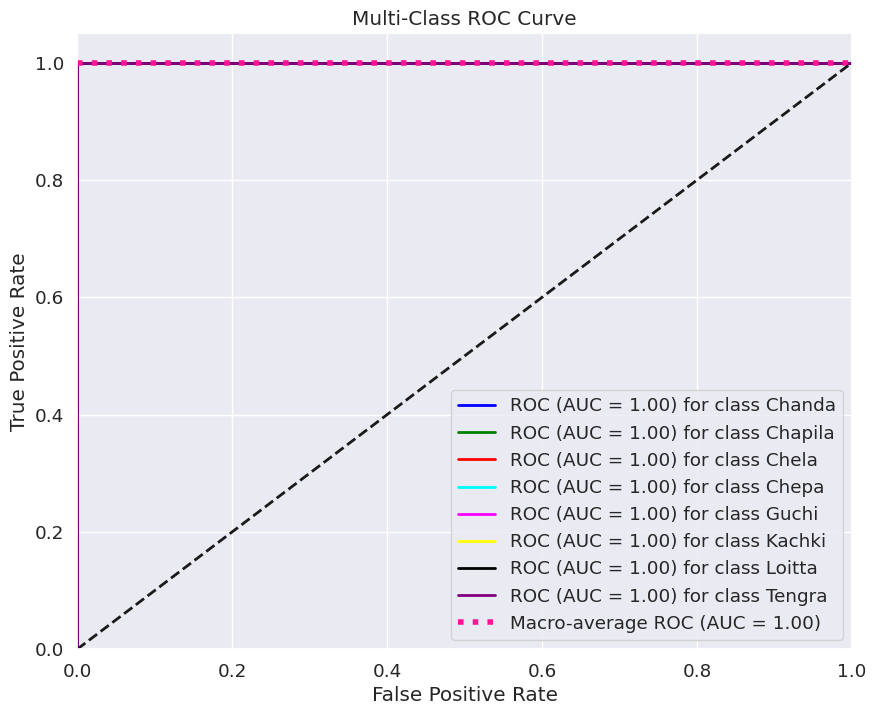

In [7]:
# =====================================
# ✅ Reproducible ResNet50V2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 25

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = ResNet50V2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=30,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=30,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/Single_DF/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


#DF Bulk

In [ ]:
# ========================================================
# ✅ Dataset Splitting (Train-Validation-Test set) Script
# ========================================================

import os
import random
import shutil

source_path = "/content/Original Dataset"
destination_path = "/content/train"

source_folder = os.listdir(source_path)

for i in source_folder:
    sub_folder = os.listdir(source_path+'/'+i)
    for j in sub_folder:
        sub_sub_folder_path = source_path + '/' + i + '/' + 'Bulk' + '/'

        destination_folder = destination_path + '/' + i + '/'
        selection_ratio = 0.6  # 0.6 -> 60%, 0.5 -> 50%, 1 ->100%

        image_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.gif', '.tiff')

        def collect_images(folder_path):
            image_paths = []
            for root, _, files in os.walk(folder_path):
                for file in files:
                    if file.lower().endswith(image_extensions):
                        full_path = os.path.join(root, file)
                        image_paths.append(full_path)
            return image_paths

        def copy_selected_images(images, dest_folder, ratio):
            os.makedirs(dest_folder, exist_ok=True)
            num_to_select = int(len(images) * ratio)
            selected_images = random.sample(images, num_to_select)

            for img_path in selected_images:
                filename = os.path.basename(img_path)
                dest_path = os.path.join(dest_folder, filename)
                shutil.move(img_path, dest_path)  # <-- move instead of copy2
                print(f"Moved: {filename}")

        if __name__ == "__main__":
            all_images = collect_images(sub_sub_folder_path)
            print(f"Found {len(all_images)} images.")
            copy_selected_images(all_images, destination_folder, selection_ratio)
        break

Found 22 images.
Moved: Kachki_Bulk_74.jpg
Moved: Kachki_Bulk_79.jpg
Moved: Kachki_Bulk_33.jpg
Moved: Kachki_Bulk_64.jpg
Moved: Kachki_Bulk_91.jpg
Moved: Kachki_Bulk_107.jpg
Moved: Kachki_Bulk_8.jpg
Moved: Kachki_Bulk_22.jpg
Moved: Kachki_Bulk_81.jpg
Moved: Kachki_Bulk_68.jpg
Moved: Kachki_Bulk_36.jpg
Moved: Kachki_Bulk_13.jpg
Moved: Kachki_Bulk_102.jpg
Moved: Kachki_Bulk_84.jpg
Moved: Kachki_Bulk_90.jpg
Moved: Kachki_Bulk_77.jpg
Moved: Kachki_Bulk_53.jpg
Moved: Kachki_Bulk_86.jpg
Moved: Kachki_Bulk_87.jpg
Moved: Kachki_Bulk_65.jpg
Moved: Kachki_Bulk_18.jpg
Moved: Kachki_Bulk_46.jpg
Found 20 images.
Moved: Chapila_Bulk_14.jpg
Moved: Chapila_Bulk_29.jpg
Moved: Chapila_Bulk_30.jpg
Moved: Chapila_Bulk_2.jpg
Moved: Chapila_Bulk_24.jpg
Moved: Chapila_Bulk_47.jpg
Moved: Chapila_Bulk_86.jpg
Moved: Chapila_Bulk_53.jpg
Moved: Chapila_Bulk_54.jpg
Moved: Chapila_Bulk_82.jpg
Moved: Chapila_Bulk_93.jpg
Moved: Chapila_Bulk_48.jpg
Moved: Chapila_Bulk_11.jpg
Moved: Chapila_Bulk_46.jpg
Moved: Chapila_B

In [ ]:
import numpy as np
import pandas as pd
import os
from sklearn.metrics import classification_report
import seaborn as sn
from sklearn.utils import shuffle
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
from tqdm import tqdm

class_names= os.listdir('/content/DF_Bulk/train')

class_names_labels={class_name:i for i, class_name in enumerate(class_names)}

print(class_names_labels)

nb_classes=len(class_names)

IMAGE_SIZE=(200,200)

def load_data():
    direct='/content/DF_Bulk'
    category=['train','valid','test']

    output=[]

    for cat in category:
      path=os.path.join(direct,cat)
      print(path)

      images=[]
      labels=[]

      for folder in os.listdir(path):
        print("folder:",folder)
        label= class_names_labels[folder]
        i=0
        #Iterating each image
        for fle in os.listdir(os.path.join(path,folder)):

          img_path=os.path.join(os.path.join(path,folder),fle)

          image=cv2.imread(img_path)

          image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
          image=cv2.resize(image,IMAGE_SIZE)

          #if i<5:
              #plt.imshow(image)
              #plt.axis('off')  # Turn off axis labels
              #plt.show()
          # i+=1
          images.append(image)
          labels.append(label)

      images=np.array(images,dtype='float32')
      labels=np.array(labels,dtype='int32')

      output.append((images,labels))
    #print(type(output[0]))
    return output

(train_images,train_lables), (valid_images,valid_lables), (test_images,test_lables) = load_data()

{'Kachki': 0, 'Chapila': 1, 'Chela': 2, 'Chanda': 3, 'Guchi': 4, 'Tengra': 5, 'Loitta': 6, 'Chepa': 7}
/content/Bulk_TVT_All/train
folder: Kachki
folder: Chapila
folder: Chela
folder: Chanda
folder: Guchi
folder: Tengra
folder: Loitta
folder: Chepa
/content/Bulk_TVT_All/valid
folder: Kachki
folder: Chapila
folder: Chela
folder: Chanda
folder: Guchi
folder: Tengra
folder: Loitta
folder: Chepa
/content/Bulk_TVT_All/test
folder: Kachki
folder: Chapila
folder: Chela
folder: Chanda
folder: Guchi
folder: Tengra
folder: Loitta
folder: Chepa


#### MobileNetV2

✅ Reproducibility enabled with SEED = 33


/tmp/ipython-input-867667654.py:39: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)


Model: "functional_18"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_18      │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 100, 100,  │        864 │ input_layer_18[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 100, 100,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 100, 100,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 100, 100,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 100, 100,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 100, 100,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 101, 101,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 50, 50,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 50, 50,    │      2,304 │ block_1_depthwis

 Total params: 2,268,232 (8.65 MB)

 Trainable params: 2,234,120 (8.52 MB)

 Non-trainable params: 34,112 (133.25 KB)

Epoch 1/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - accuracy: 0.5247 - loss: 1.3634 - val_accuracy: 0.1646 - val_loss: 2.9793
Epoch 2/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - accuracy: 0.9868 - loss: 0.0833 - val_accuracy: 0.1768 - val_loss: 2.8343
Epoch 3/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - accuracy: 1.0000 - loss: 0.0235 - val_accuracy: 0.3049 - val_loss: 2.4727
Epoch 4/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 89ms/step - accuracy: 1.0000 - loss: 0.0108 - val_accuracy: 0.4085 - val_loss: 2.0854
Epoch 5/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - accuracy: 1.0000 - loss: 0.0077 - val_accuracy: 0.4573 - val_loss: 1.7984
Epoch 6/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - accuracy: 1.0000 - loss: 0.0054 - val_accuracy: 0.5305 - val_loss: 1.5264
Epoch 7/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - accuracy: 1.0000 - loss: 0.0043 - val_accuracy: 0.5976 - val_loss: 1.2869
Epoch 8/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 85ms/step - accuracy: 1.0000 - loss: 0.0034 - val_accuracy: 0.6951 -

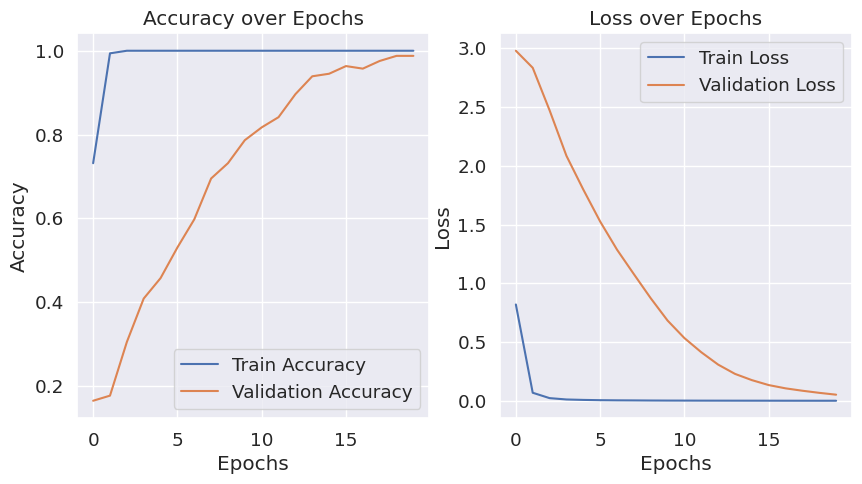

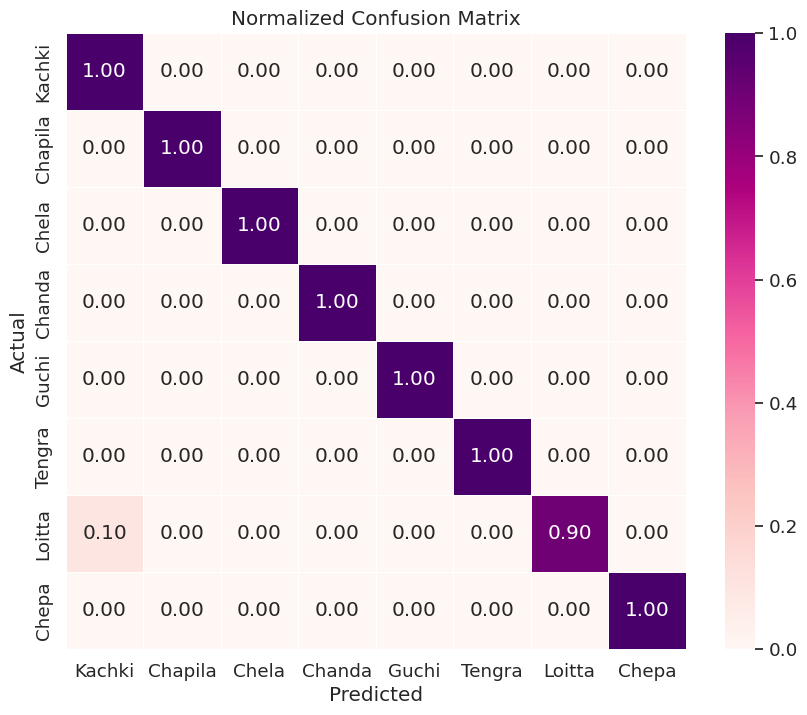

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


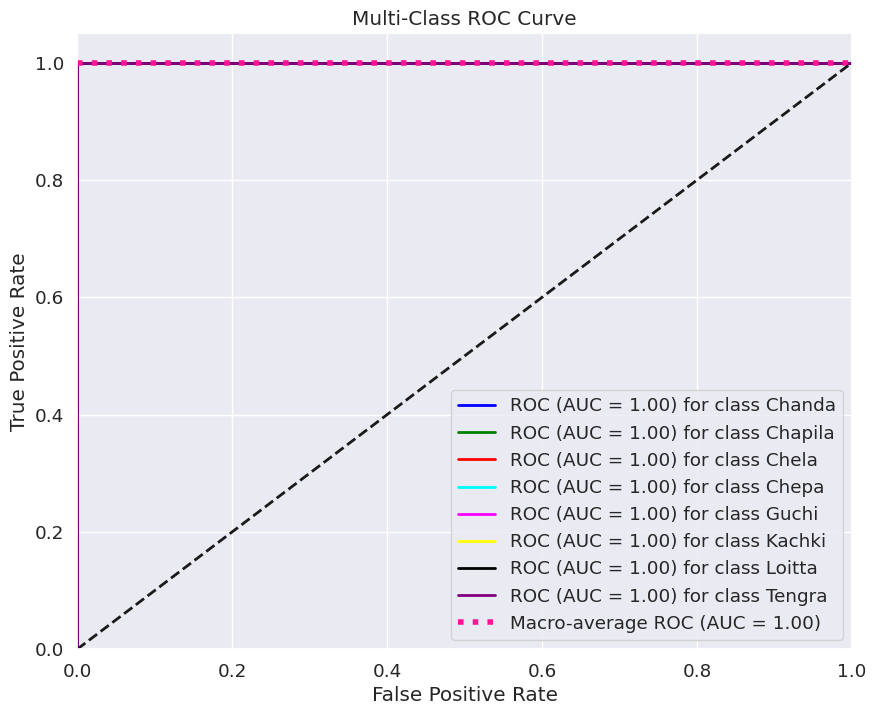

In [ ]:
# =====================================
# ✅ Reproducible MobileNetV2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 33

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x=Dropout(0.25)(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=20,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=20,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/DF_Bulk/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


✅ Reproducibility enabled with SEED = 25


/tmp/ipython-input-471398377.py:39: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)


Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_17      │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 100, 100,  │        864 │ input_layer_17[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 100, 100,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 100, 100,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 100, 100,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 100, 100,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 100, 100,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 101, 101,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 50, 50,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 50, 50,    │      2,304 │ block_1_depthwis

 Total params: 2,268,232 (8.65 MB)

 Trainable params: 2,234,120 (8.52 MB)

 Non-trainable params: 34,112 (133.25 KB)

Epoch 1/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - accuracy: 0.5605 - loss: 1.3104 - val_accuracy: 0.3598 - val_loss: 2.2658
Epoch 2/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - accuracy: 0.9923 - loss: 0.0594 - val_accuracy: 0.4329 - val_loss: 2.1716
Epoch 3/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - accuracy: 1.0000 - loss: 0.0207 - val_accuracy: 0.5305 - val_loss: 2.0060
Epoch 4/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - accuracy: 1.0000 - loss: 0.0110 - val_accuracy: 0.5854 - val_loss: 1.7741
Epoch 5/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - accuracy: 1.0000 - loss: 0.0068 - val_accuracy: 0.6463 - val_loss: 1.5768
Epoch 6/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - accuracy: 1.0000 - loss: 0.0046 - val_accuracy: 0.6646 - val_loss: 1.3757
Epoch 7/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - accuracy: 1.0000 - loss: 0.0035 - val_accuracy: 0.6951 - val_loss: 1.1854
Epoch 8/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - accuracy: 1.0000 - loss: 0.0027 - val_accuracy: 0.7378 

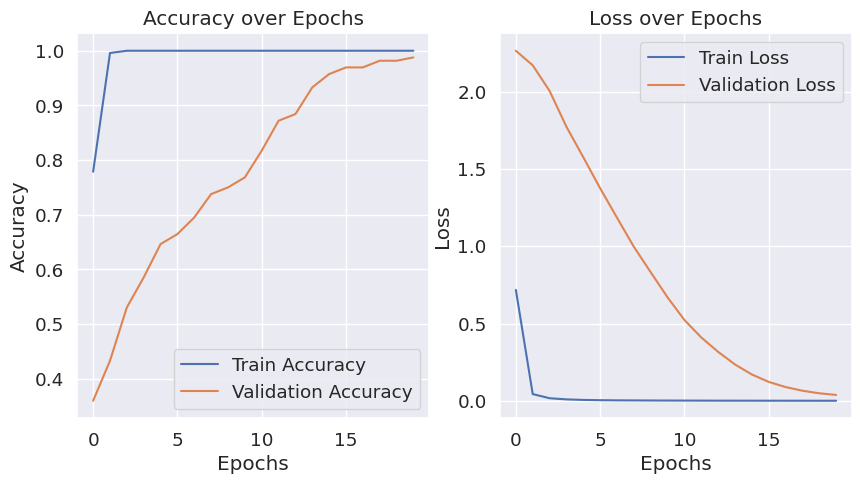

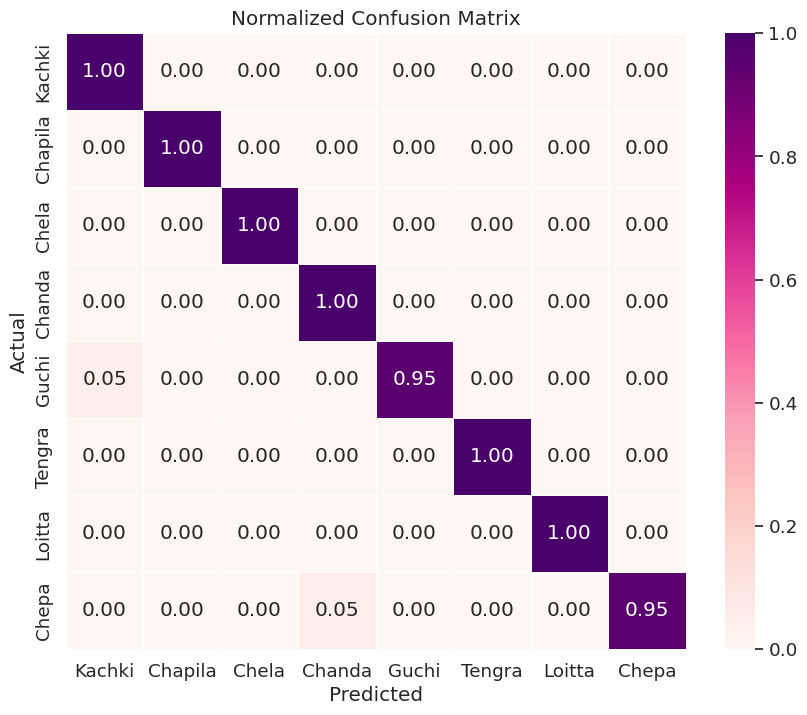

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


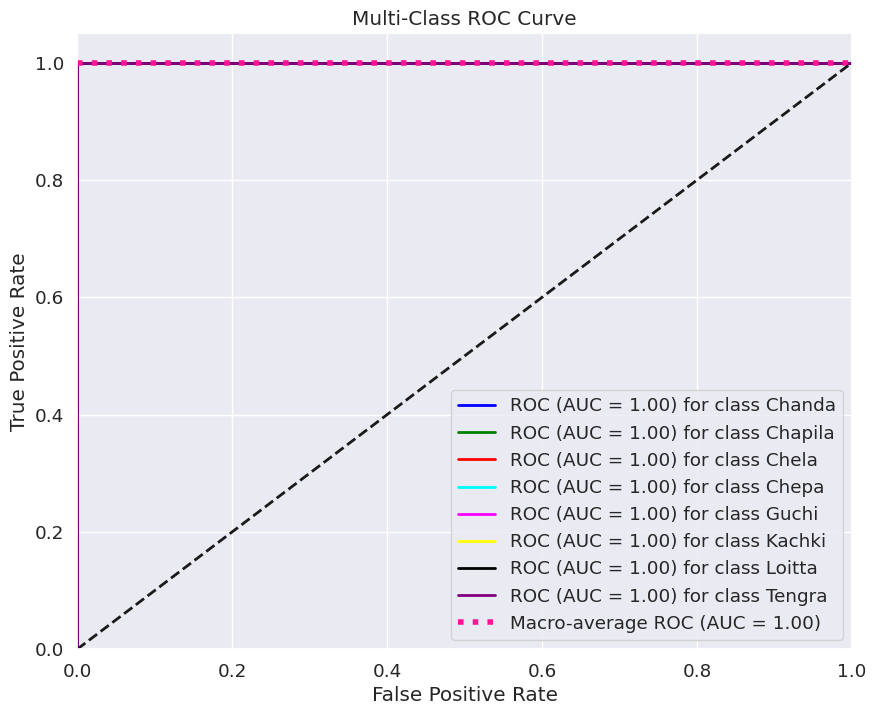

In [ ]:
# =====================================
# ✅ Reproducible MobileNetV2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 25

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x=Dropout(0.25)(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=20,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=20,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/DF_Bulk/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


✅ Reproducibility enabled with SEED = 42


/tmp/ipython-input-3204706246.py:39: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)


Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_14      │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 100, 100,  │        864 │ input_layer_14[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 100, 100,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 100, 100,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 100, 100,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 100, 100,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 100, 100,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 101, 101,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 50, 50,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 50, 50,    │      2,304 │ block_1_depthwis

 Total params: 2,268,232 (8.65 MB)

 Trainable params: 2,234,120 (8.52 MB)

 Non-trainable params: 34,112 (133.25 KB)

Epoch 1/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - accuracy: 0.6305 - loss: 1.1449 - val_accuracy: 0.2744 - val_loss: 2.3491
Epoch 2/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - accuracy: 1.0000 - loss: 0.0389 - val_accuracy: 0.2866 - val_loss: 2.5267
Epoch 3/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - accuracy: 1.0000 - loss: 0.0147 - val_accuracy: 0.3110 - val_loss: 2.3116
Epoch 4/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - accuracy: 1.0000 - loss: 0.0082 - val_accuracy: 0.3780 - val_loss: 1.9903
Epoch 5/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - accuracy: 1.0000 - loss: 0.0051 - val_accuracy: 0.4756 - val_loss: 1.6736
Epoch 6/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - accuracy: 1.0000 - loss: 0.0045 - val_accuracy: 0.6220 - val_loss: 1.3993
Epoch 7/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - accuracy: 1.0000 - loss: 0.0033 - val_accuracy: 0.7012 - val_loss: 1.1874
Epoch 8/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - accuracy: 1.0000 - loss: 0.0022 - val_accuracy: 0.7378 -

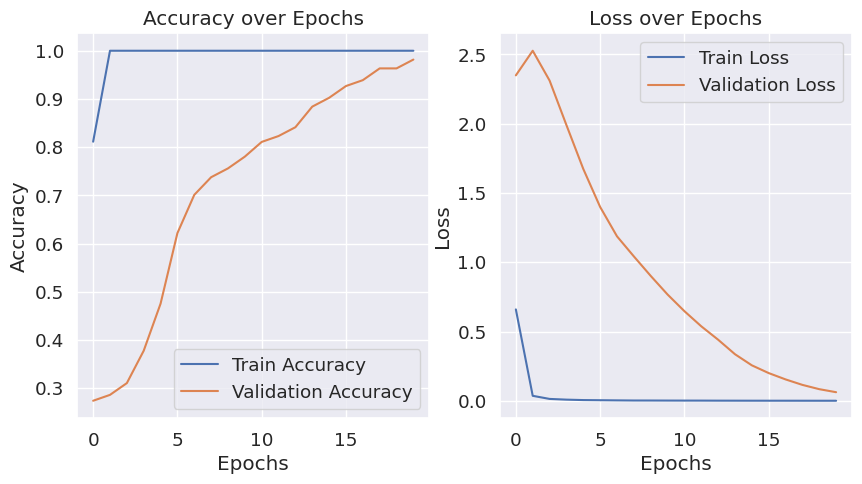

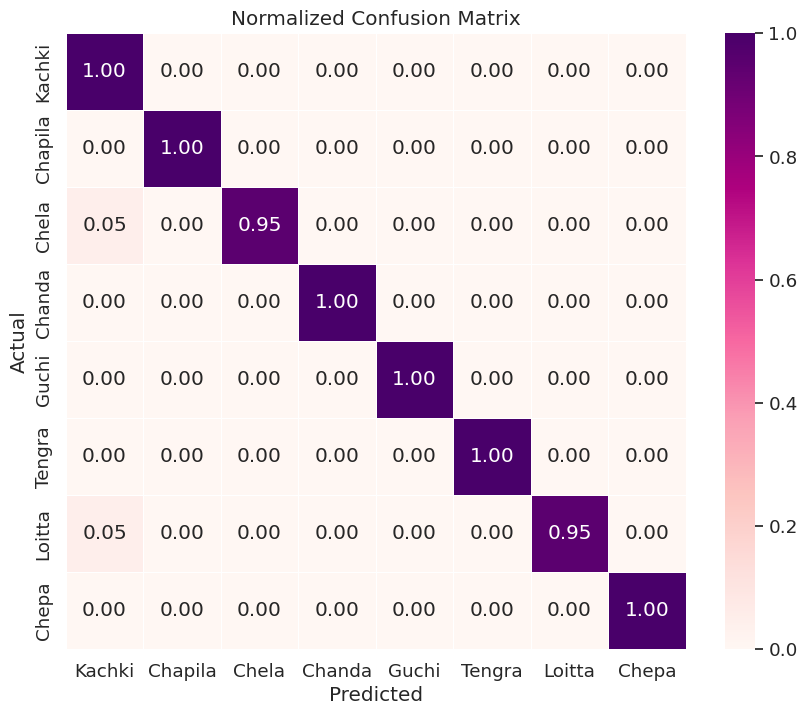

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


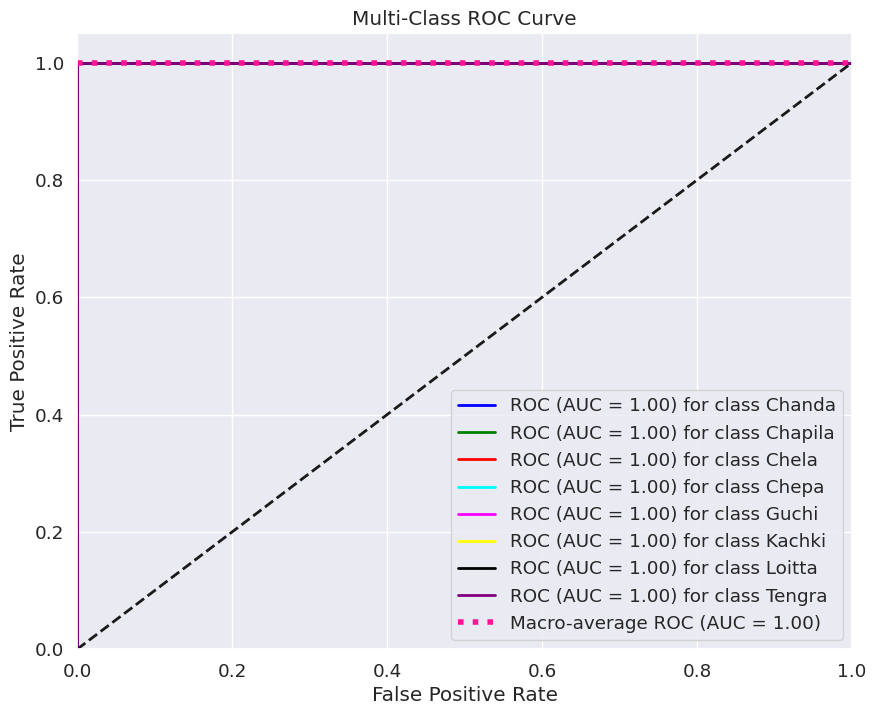

In [ ]:
# =====================================
# ✅ Reproducible MobileNetV2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x=Dropout(0.25)(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=20,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=20,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/DF_Bulk/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


#### ResNet50V2

✅ Reproducibility enabled with SEED = 42
94668760/94668760 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_16      │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 206, 206,  │          0 │ input_layer_16[0… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 100, 100,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 102, 102,  │          0 │ conv1_conv[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 50, 50,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │        256 │ pool1_pool[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │          0 │ conv2_block1_pre… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 50, 50,    │      4,096 │ conv2_block1_pre… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 50, 50,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 50, 50,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_pad  │ (None, 52, 52,    │          0 │ conv2_block1_1_r… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 50, 50,    │     36,864 │ conv2_block1_2_p… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 50, 50,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 50, 50,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_pre… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_out    │ (None, 50, 50,    │          0 │ conv2_block1_0_c

 Total params: 23,581,192 (89.96 MB)

 Trainable params: 23,535,752 (89.78 MB)

 Non-trainable params: 45,440 (177.50 KB)

Epoch 1/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 45s 199ms/step - accuracy: 0.6062 - loss: 1.2117 - val_accuracy: 0.3293 - val_loss: 2.1070
Epoch 2/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - accuracy: 0.9741 - loss: 0.0821 - val_accuracy: 0.9268 - val_loss: 0.3133
Epoch 3/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - accuracy: 1.0000 - loss: 0.0281 - val_accuracy: 0.9817 - val_loss: 0.0598
Epoch 4/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - accuracy: 1.0000 - loss: 0.0095 - val_accuracy: 0.9878 - val_loss: 0.0200
Epoch 5/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 144ms/step - accuracy: 1.0000 - loss: 0.0034 - val_accuracy: 0.9939 - val_loss: 0.0103
Epoch 6/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - accuracy: 1.0000 - loss: 0.0019 - val_accuracy: 0.9939 - val_loss: 0.0092
Epoch 7/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - accuracy: 1.0000 - loss: 0.0014 - val_accuracy: 0.9939 - val_loss: 0.0086
Epoch 8/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 141ms/step - accuracy: 1.0000 - loss: 0.0012 - val_accuracy: 0

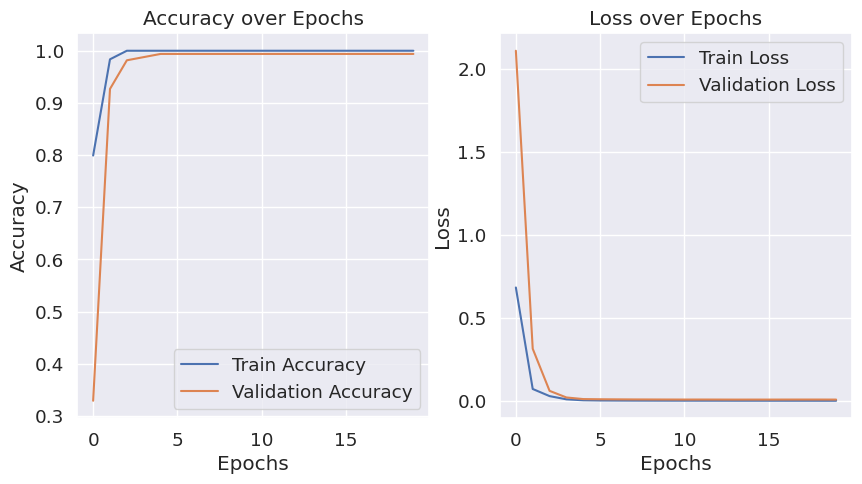

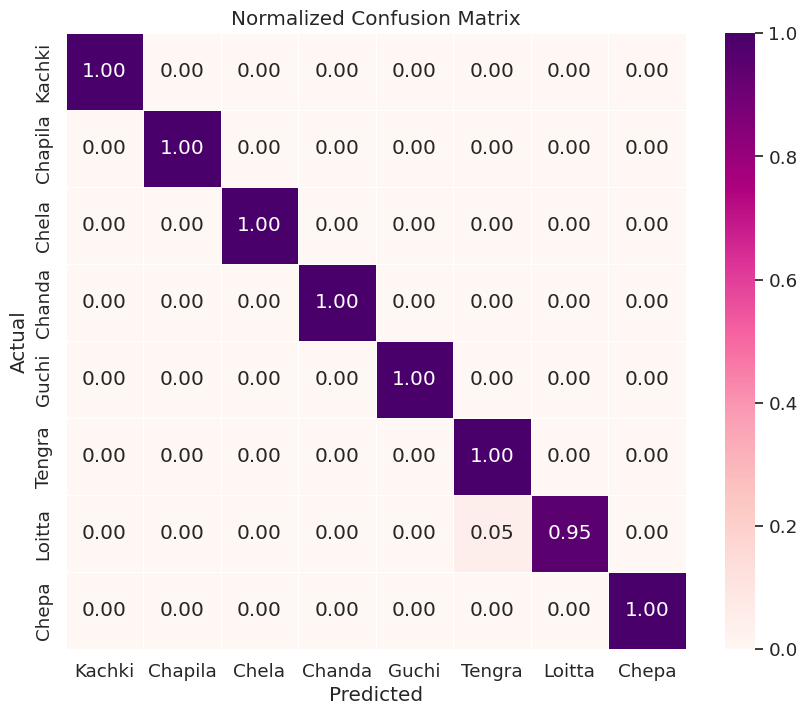

6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step 


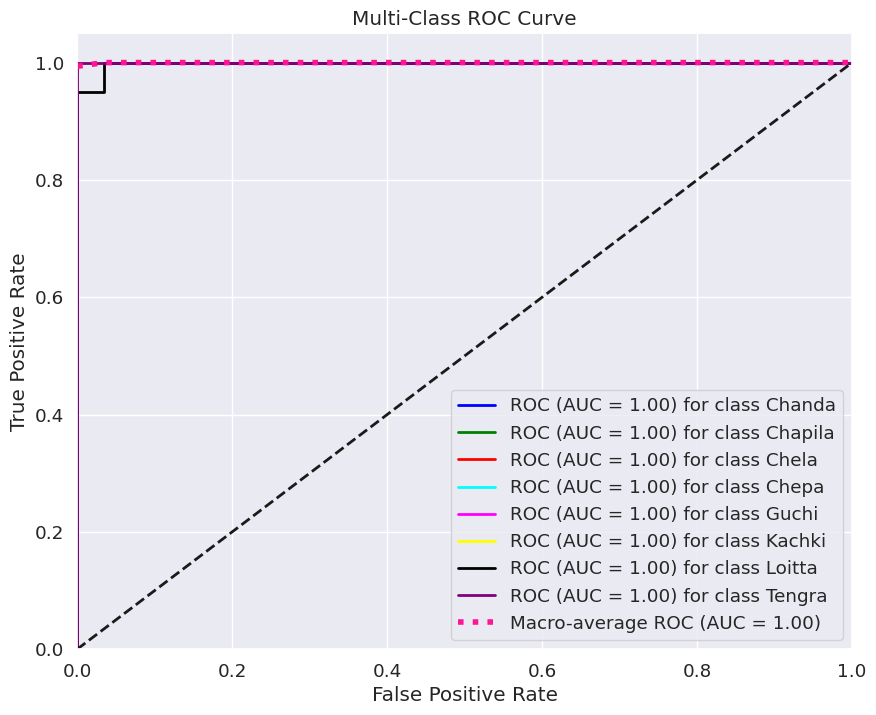

In [ ]:
# =====================================
# ✅ Reproducible ResNet50V2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = ResNet50V2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x=Dropout(0.25)(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=20,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=20,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/DF_Bulk/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


✅ Reproducibility enabled with SEED = 25


Model: "functional_19"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_19      │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 206, 206,  │          0 │ input_layer_19[0… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 100, 100,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 102, 102,  │          0 │ conv1_conv[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 50, 50,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │        256 │ pool1_pool[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │          0 │ conv2_block1_pre… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 50, 50,    │      4,096 │ conv2_block1_pre… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 50, 50,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 50, 50,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_pad  │ (None, 52, 52,    │          0 │ conv2_block1_1_r… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 50, 50,    │     36,864 │ conv2_block1_2_p… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 50, 50,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 50, 50,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_pre… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_out    │ (None, 50, 50,    │          0 │ conv2_block1_0_c

 Total params: 23,581,192 (89.96 MB)

 Trainable params: 23,535,752 (89.78 MB)

 Non-trainable params: 45,440 (177.50 KB)

Epoch 1/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 39s 192ms/step - accuracy: 0.5880 - loss: 1.2603 - val_accuracy: 0.1402 - val_loss: 2.4590
Epoch 2/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 148ms/step - accuracy: 0.9894 - loss: 0.0920 - val_accuracy: 0.8354 - val_loss: 0.5927
Epoch 3/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 148ms/step - accuracy: 0.9935 - loss: 0.0344 - val_accuracy: 0.9634 - val_loss: 0.1317
Epoch 4/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 148ms/step - accuracy: 1.0000 - loss: 0.0131 - val_accuracy: 0.9817 - val_loss: 0.0435
Epoch 5/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 147ms/step - accuracy: 1.0000 - loss: 0.0040 - val_accuracy: 0.9878 - val_loss: 0.0216
Epoch 6/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - accuracy: 1.0000 - loss: 0.0019 - val_accuracy: 0.9939 - val_loss: 0.0161
Epoch 7/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 147ms/step - accuracy: 1.0000 - loss: 0.0015 - val_accuracy: 0.9939 - val_loss: 0.0132
Epoch 8/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - accuracy: 1.0000 - loss: 0.0012 - val_accuracy: 0

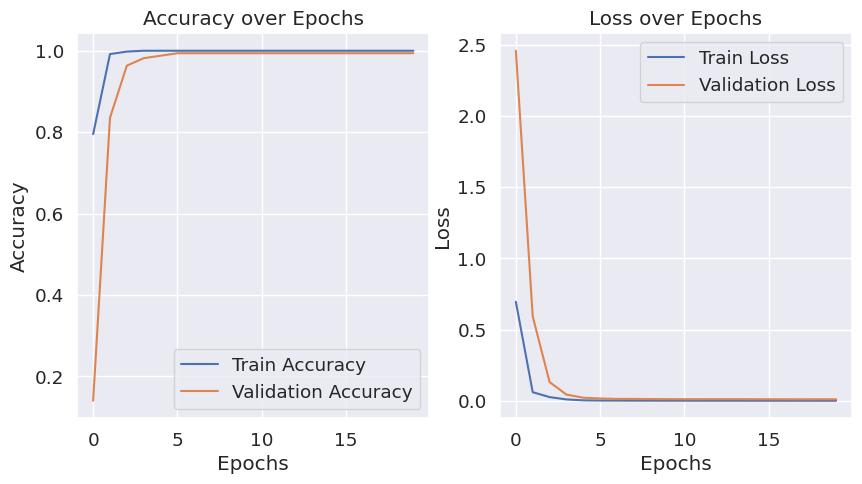

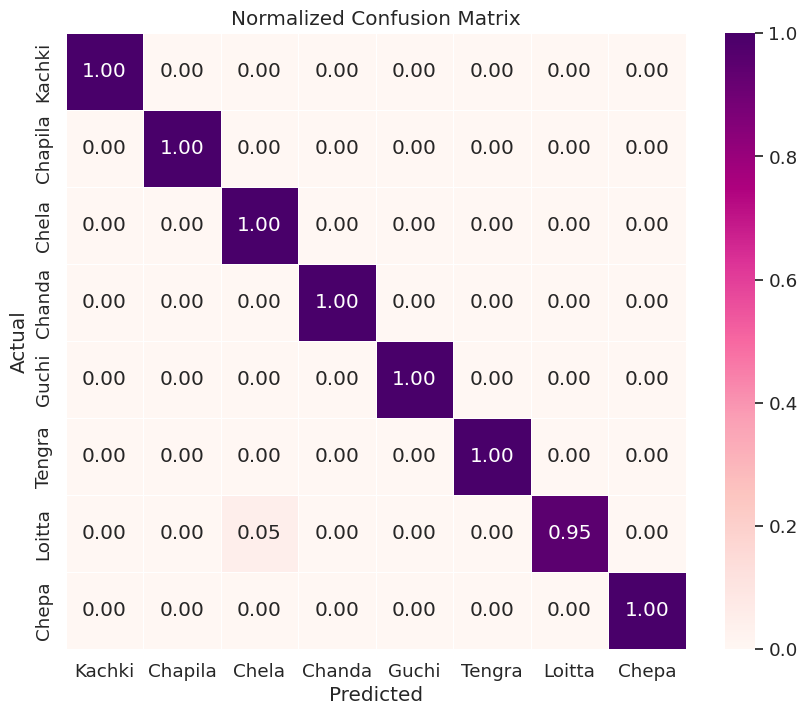

6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step 


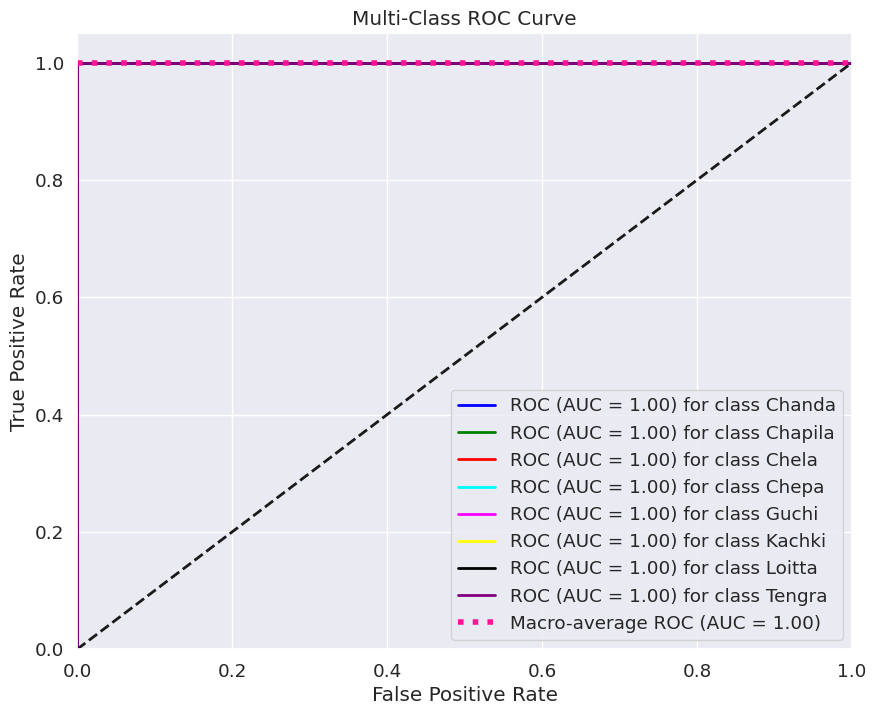

In [ ]:
# =====================================
# ✅ Reproducible ResNet50V2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 25

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = ResNet50V2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x=Dropout(0.25)(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=20,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=20,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/DF_Bulk/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


✅ Reproducibility enabled with SEED = 33


Model: "functional_20"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_20      │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 206, 206,  │          0 │ input_layer_20[0… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 100, 100,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 102, 102,  │          0 │ conv1_conv[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 50, 50,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │        256 │ pool1_pool[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │          0 │ conv2_block1_pre… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 50, 50,    │      4,096 │ conv2_block1_pre… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 50, 50,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 50, 50,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_pad  │ (None, 52, 52,    │          0 │ conv2_block1_1_r… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 50, 50,    │     36,864 │ conv2_block1_2_p… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 50, 50,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 50, 50,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_pre… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_out    │ (None, 50, 50,    │          0 │ conv2_block1_0_c

 Total params: 23,581,192 (89.96 MB)

 Trainable params: 23,535,752 (89.78 MB)

 Non-trainable params: 45,440 (177.50 KB)

Epoch 1/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 52s 190ms/step - accuracy: 0.6209 - loss: 1.1791 - val_accuracy: 0.1585 - val_loss: 4.0993
Epoch 2/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - accuracy: 0.9894 - loss: 0.0900 - val_accuracy: 0.7622 - val_loss: 0.7333
Epoch 3/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 147ms/step - accuracy: 0.9921 - loss: 0.0467 - val_accuracy: 0.9451 - val_loss: 0.1151
Epoch 4/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - accuracy: 0.9964 - loss: 0.0188 - val_accuracy: 0.9939 - val_loss: 0.0197
Epoch 5/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 147ms/step - accuracy: 1.0000 - loss: 0.0079 - val_accuracy: 0.9939 - val_loss: 0.0129
Epoch 6/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 141ms/step - accuracy: 1.0000 - loss: 0.0031 - val_accuracy: 0.9939 - val_loss: 0.0115
Epoch 7/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - accuracy: 1.0000 - loss: 0.0019 - val_accuracy: 0.9939 - val_loss: 0.0110
Epoch 8/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - accuracy: 1.0000 - loss: 0.0013 - val_accuracy: 

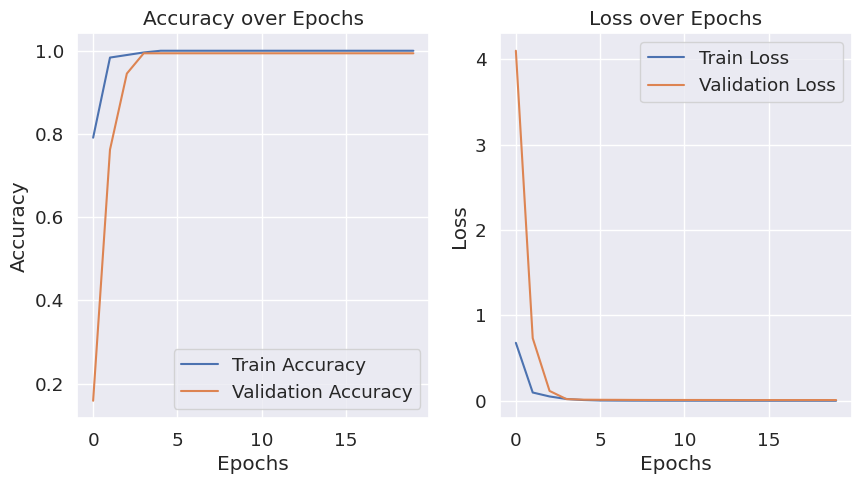

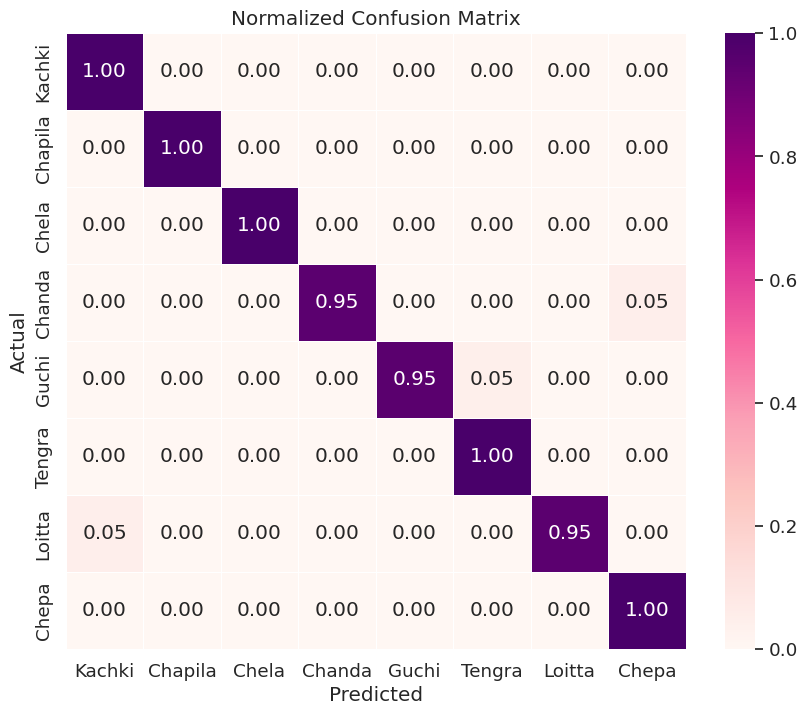

6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step 


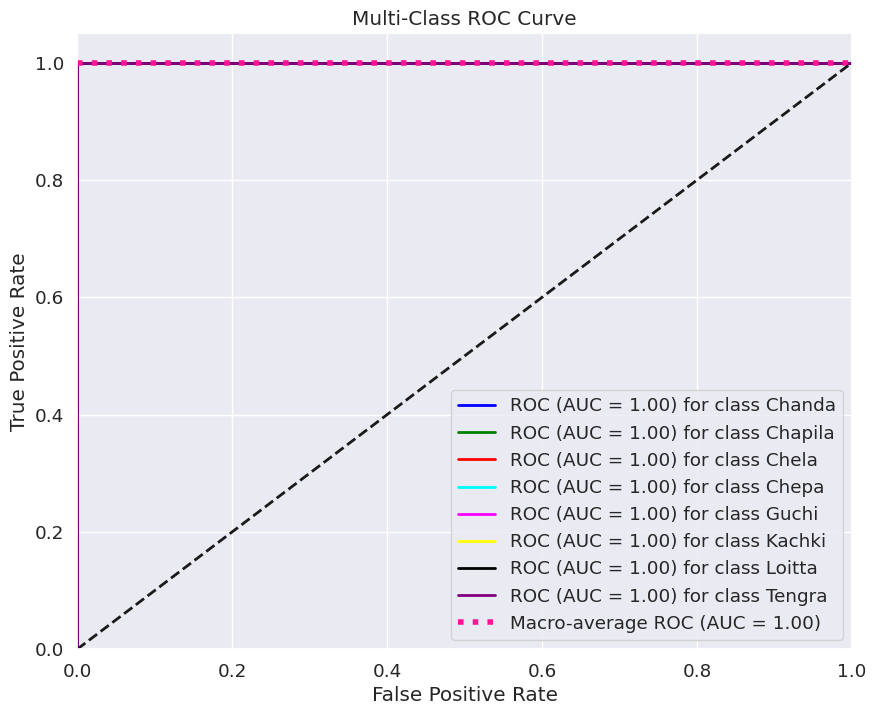

In [ ]:
# =====================================
# ✅ Reproducible ResNet50v2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 33

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = ResNet50V2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x=Dropout(0.25)(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=20,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=20,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/DF_Bulk/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


#DF ALL


In [ ]:
# ========================================================
# ✅ Dataset Splitting (Train-Validation-Test set) Script
# ========================================================

import os
import random
import shutil

source_path = "/content/Original Dataset"
destination_path = "/content/valid"

source_folder = os.listdir(source_path)

for i in source_folder:
    sub_folder = os.listdir(source_path+'/'+i)
    for j in sub_folder:
        sub_sub_folder_path = source_path + '/' + i + '/' + '/' + '/'

        destination_folder = destination_path + '/' + i + '/'
        selection_ratio = 1  # 70%

        # Supported image extensions
        image_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.gif', '.tiff')

        def collect_images(folder_path):
            image_paths = []
            for root, _, files in os.walk(folder_path):
                for file in files:
                    if file.lower().endswith(image_extensions):
                        full_path = os.path.join(root, file)
                        image_paths.append(full_path)
            return image_paths

        def copy_selected_images(images, dest_folder, ratio):
            os.makedirs(dest_folder, exist_ok=True)
            num_to_select = int(len(images) * ratio)
            selected_images = random.sample(images, num_to_select)

            for img_path in selected_images:
                filename = os.path.basename(img_path)
                dest_path = os.path.join(dest_folder, filename)
                shutil.move(img_path, dest_path)  # <-- move instead of copy2
                print(f"Moved: {filename}")

        if __name__ == "__main__":
            all_images = collect_images(sub_sub_folder_path)
            print(f"Found {len(all_images)} images.")
            copy_selected_images(all_images, destination_folder, selection_ratio)
        break

Found 80 images.
Moved: Chepa_Single_68.jpg
Moved: Chepa_Bulk_61.jpg
Moved: Chepa_Bulk_87.jpg
Moved: Chepa_Bulk_39.jpg
Moved: Chepa_Tail_86.jpg
Moved: Chepa_Head_95.jpg
Moved: Chepa_Single_65.jpg
Moved: Chepa_Head_10.jpg
Moved: Chepa_Single_54.jpg
Moved: Chepa_Tail_60.jpg
Moved: Chepa_Head_37.jpg
Moved: Chepa_Bulk_88.jpg
Moved: Chepa_Tail_57.jpg
Moved: Chepa_Bulk_11.jpg
Moved: Chepa_Bulk_3.jpg
Moved: Chepa_Tail_74.jpg
Moved: Chepa_Head_63.jpg
Moved: Chepa_Tail_66.jpg
Moved: Chepa_Tail_98.jpg
Moved: Chepa_Tail_27.jpg
Moved: Chepa_Head_86.jpg
Moved: Chepa_Head_67.jpg
Moved: Chepa_Single_38.jpg
Moved: Chepa_Single_69.jpg
Moved: Chepa_Single_46.jpg
Moved: Chepa_Tail_51.jpg
Moved: Chepa_Single_89.jpg
Moved: Chepa_Tail_80.jpg
Moved: Chepa_Head_30.jpg
Moved: Chepa_Bulk_93.jpg
Moved: Chepa_Bulk_5.jpg
Moved: Chepa_Single_67.jpg
Moved: Chepa_Bulk_27.jpg
Moved: Chepa_Single_37.jpg
Moved: Chepa_Bulk_52.jpg
Moved: Chepa_Single_27.jpg
Moved: Chepa_Tail_83.jpg
Moved: Chepa_Tail_89.jpg
Moved: Chepa_Ta

In [ ]:
import numpy as np
import pandas as pd
import os
from sklearn.metrics import classification_report
import seaborn as sn
from sklearn.utils import shuffle
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
from tqdm import tqdm

class_names= os.listdir('/content/drive/MyDrive/DF_ALL/train')

class_names_labels={class_name:i for i, class_name in enumerate(class_names)}

print(class_names_labels)

nb_classes=len(class_names)

IMAGE_SIZE=(200,200)

def load_data():
    direct='/content/drive/MyDrive/DF_ALL'
    category=['train','valid','test']

    output=[]

    for cat in category:
      path=os.path.join(direct,cat)
      print(path)

      images=[]
      labels=[]

      for folder in os.listdir(path):
        print("folder:",folder)
        label= class_names_labels[folder]
        i=0
        #Iterating each image
        for fle in os.listdir(os.path.join(path,folder)):

          img_path=os.path.join(os.path.join(path,folder),fle)

          image=cv2.imread(img_path)

          image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
          image=cv2.resize(image,IMAGE_SIZE)

          #if i<5:
              #plt.imshow(image)
              #plt.axis('off')  # Turn off axis labels
              #plt.show()
          # i+=1
          images.append(image)
          labels.append(label)

      images=np.array(images,dtype='float32')
      labels=np.array(labels,dtype='int32')

      output.append((images,labels))
    #print(type(output[0]))
    return output

(train_images,train_lables), (valid_images,valid_lables), (test_images,test_lables) = load_data()

{'Tengra': 0, 'Loitta': 1, 'Guchi': 2, 'Chela': 3, 'Chapila': 4, 'Kachki': 5, 'Chepa': 6, 'Chanda': 7}
/content/drive/MyDrive/DF_ALL/train
folder: Tengra
folder: Loitta
folder: Guchi
folder: Chela
folder: Chapila
folder: Kachki
folder: Chepa
folder: Chanda
/content/drive/MyDrive/DF_ALL/valid
folder: Chepa
folder: Loitta
folder: Chela
folder: Kachki
folder: Chanda
folder: Guchi
folder: Chapila
folder: Tengra
/content/drive/MyDrive/DF_ALL/test
folder: Loitta
folder: Chela
folder: Chanda
folder: Chapila
folder: Guchi
folder: Tengra
folder: Kachki
folder: Chepa


#### MobileNetv2

✅ Reproducibility enabled with SEED = 42


/tmp/ipython-input-1587314331.py:39: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)


Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_12      │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 100, 100,  │        864 │ input_layer_12[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 100, 100,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 100, 100,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 100, 100,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 100, 100,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 100, 100,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 101, 101,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 50, 50,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 50, 50,    │      2,304 │ block_1_depthwis

 Total params: 2,268,232 (8.65 MB)

 Trainable params: 2,234,120 (8.52 MB)

 Non-trainable params: 34,112 (133.25 KB)

Epoch 1/10
247/247 ━━━━━━━━━━━━━━━━━━━━ 80s 121ms/step - accuracy: 0.7475 - loss: 0.8683 - val_accuracy: 0.4446 - val_loss: 2.5551
Epoch 2/10
247/247 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - accuracy: 0.9969 - loss: 0.0382 - val_accuracy: 0.5023 - val_loss: 2.1111
Epoch 3/10
247/247 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - accuracy: 1.0000 - loss: 0.0072 - val_accuracy: 0.6449 - val_loss: 1.3419
Epoch 4/10
247/247 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - accuracy: 1.0000 - loss: 0.0027 - val_accuracy: 0.7936 - val_loss: 0.7081
Epoch 5/10
247/247 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - accuracy: 1.0000 - loss: 0.0017 - val_accuracy: 0.9196 - val_loss: 0.2553
Epoch 6/10
247/247 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - accuracy: 1.0000 - loss: 0.0012 - val_accuracy: 0.9757 - val_loss: 0.0825
Epoch 7/10
247/247 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - accuracy: 1.0000 - loss: 8.9897e-04 - val_accuracy: 0.9894 - val_loss: 0.0241
Epoch 8/10
247/247 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - accuracy: 1.0000 - loss: 6.99

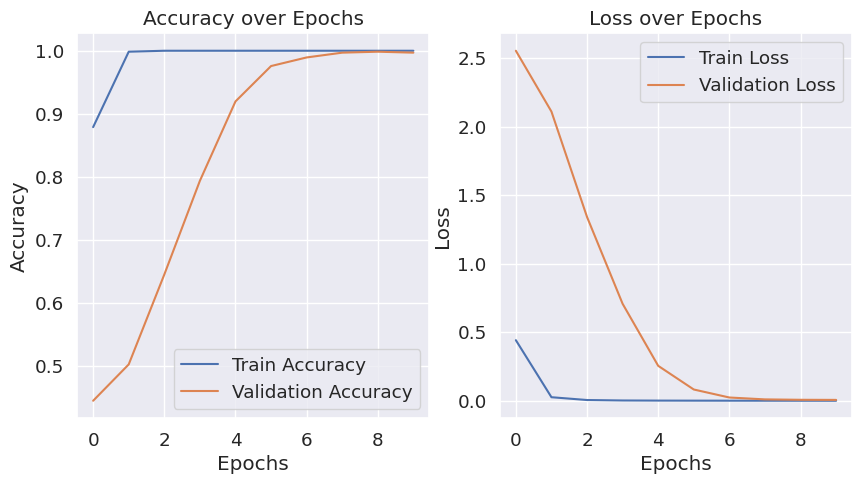

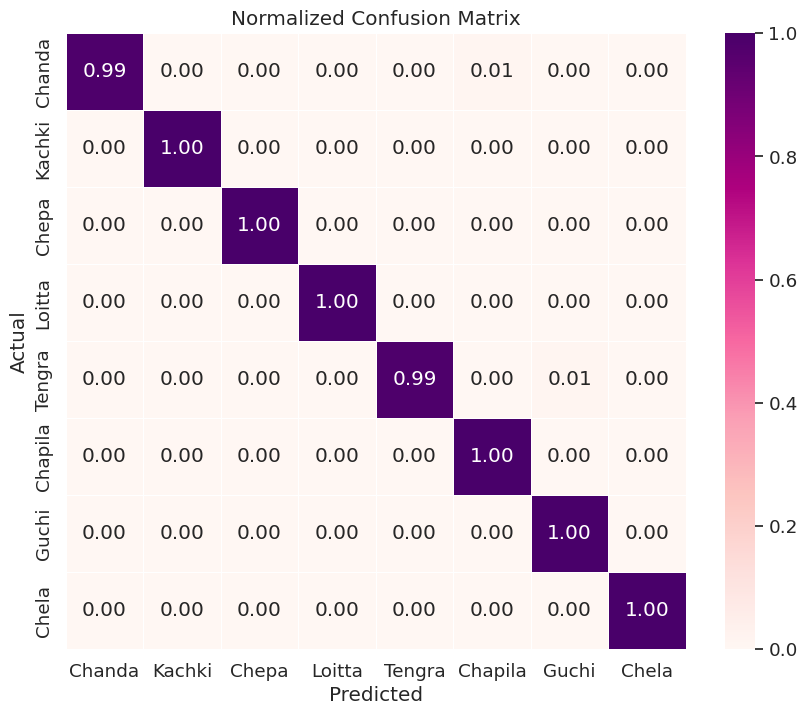

21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step


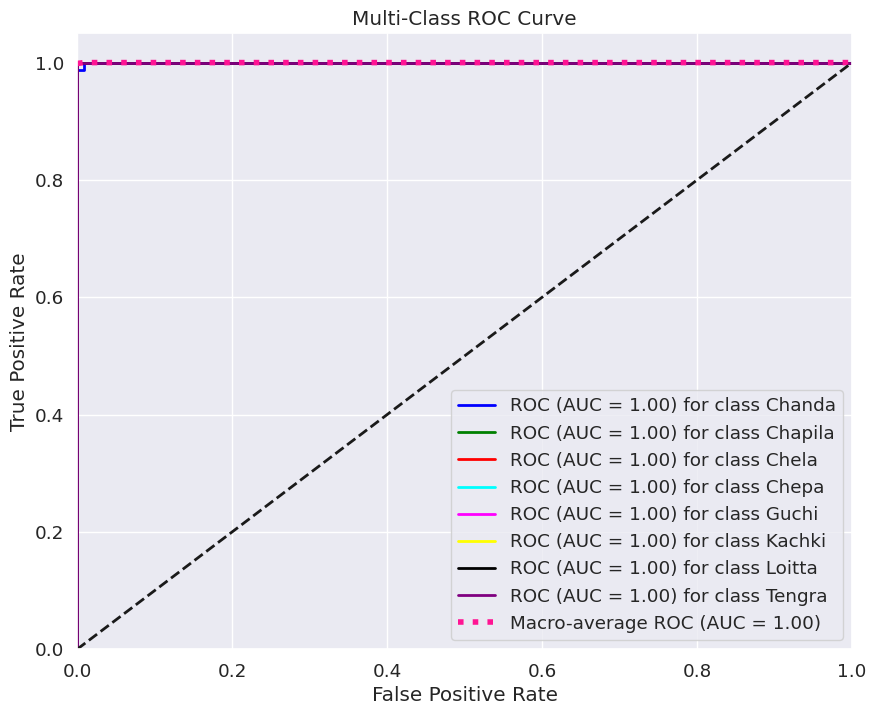

In [ ]:
# =====================================
# ✅ Reproducible MobileNetV2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=10,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=10,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/DF_Tail/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


✅ Reproducibility enabled with SEED = 33


/tmp/ipython-input-1095581344.py:39: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)


Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_13      │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 100, 100,  │        864 │ input_layer_13[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 100, 100,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 100, 100,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 100, 100,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 100, 100,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 100, 100,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 101, 101,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 50, 50,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 50, 50,    │      2,304 │ block_1_depthwis

 Total params: 2,268,232 (8.65 MB)

 Trainable params: 2,234,120 (8.52 MB)

 Non-trainable params: 34,112 (133.25 KB)

Epoch 1/10
247/247 ━━━━━━━━━━━━━━━━━━━━ 53s 106ms/step - accuracy: 0.7136 - loss: 0.8474 - val_accuracy: 0.3308 - val_loss: 4.2451
Epoch 2/10
247/247 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - accuracy: 0.9914 - loss: 0.0346 - val_accuracy: 0.4249 - val_loss: 3.2998
Epoch 3/10
247/247 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step - accuracy: 1.0000 - loss: 0.0075 - val_accuracy: 0.5493 - val_loss: 1.9243
Epoch 4/10
247/247 ━━━━━━━━━━━━━━━━━━━━ 23s 94ms/step - accuracy: 1.0000 - loss: 0.0027 - val_accuracy: 0.7420 - val_loss: 0.8384
Epoch 5/10
247/247 ━━━━━━━━━━━━━━━━━━━━ 41s 93ms/step - accuracy: 1.0000 - loss: 0.0015 - val_accuracy: 0.9029 - val_loss: 0.2619
Epoch 6/10
247/247 ━━━━━━━━━━━━━━━━━━━━ 23s 94ms/step - accuracy: 1.0000 - loss: 0.0011 - val_accuracy: 0.9727 - val_loss: 0.0746
Epoch 7/10
247/247 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - accuracy: 1.0000 - loss: 8.2557e-04 - val_accuracy: 0.9924 - val_loss: 0.0254
Epoch 8/10
247/247 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - accuracy: 1.0000 - loss: 6.43

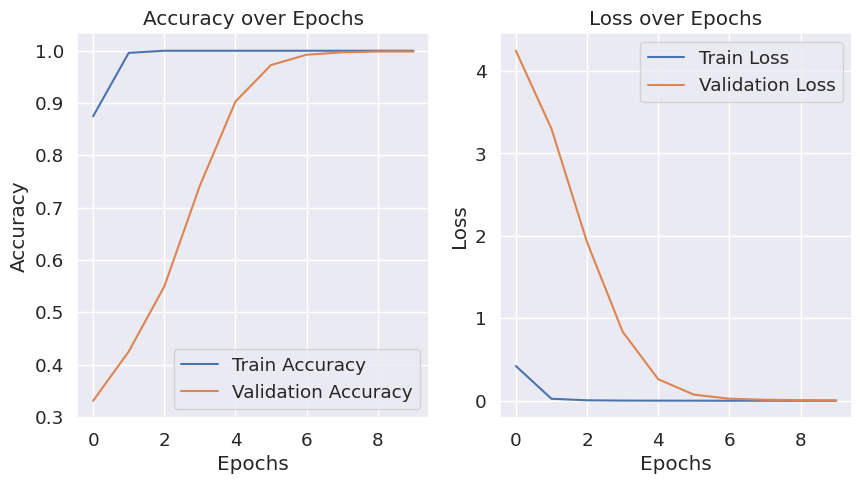

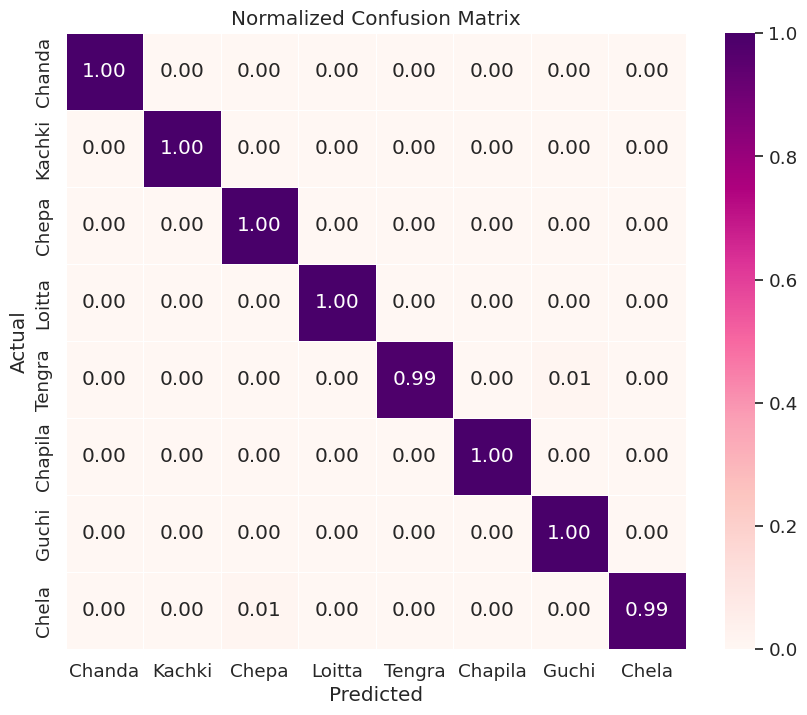

21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step


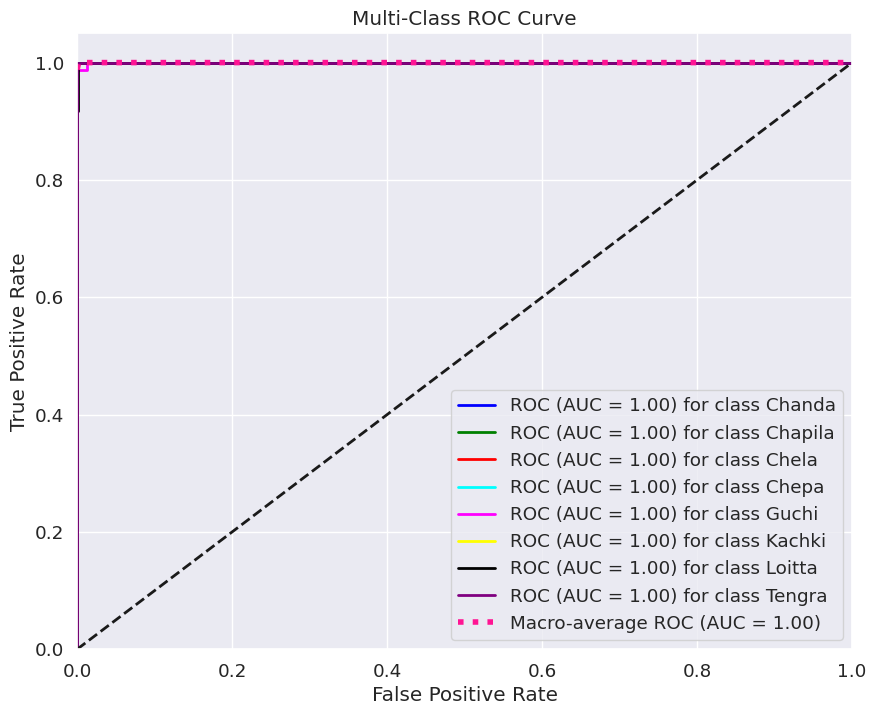

In [ ]:
# =====================================
# ✅ Reproducible MobileNetV2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 33

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=10,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=10,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/DF_Tail/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


✅ Reproducibility enabled with SEED = 25


/tmp/ipython-input-1136867931.py:39: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)


Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_14      │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 100, 100,  │        864 │ input_layer_14[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 100, 100,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 100, 100,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 100, 100,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 100, 100,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 100, 100,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 101, 101,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 50, 50,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 50, 50,    │      2,304 │ block_1_depthwis

 Total params: 2,268,232 (8.65 MB)

 Trainable params: 2,234,120 (8.52 MB)

 Non-trainable params: 34,112 (133.25 KB)

Epoch 1/10
247/247 ━━━━━━━━━━━━━━━━━━━━ 72s 112ms/step - accuracy: 0.7058 - loss: 0.9214 - val_accuracy: 0.4158 - val_loss: 2.2883
Epoch 2/10
247/247 ━━━━━━━━━━━━━━━━━━━━ 23s 94ms/step - accuracy: 0.9917 - loss: 0.0451 - val_accuracy: 0.5569 - val_loss: 1.6690
Epoch 3/10
247/247 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - accuracy: 1.0000 - loss: 0.0063 - val_accuracy: 0.6586 - val_loss: 1.0804
Epoch 4/10
247/247 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - accuracy: 1.0000 - loss: 0.0022 - val_accuracy: 0.8134 - val_loss: 0.5186
Epoch 5/10
247/247 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step - accuracy: 1.0000 - loss: 0.0014 - val_accuracy: 0.9332 - val_loss: 0.2022
Epoch 6/10
247/247 ━━━━━━━━━━━━━━━━━━━━ 23s 94ms/step - accuracy: 1.0000 - loss: 0.0010 - val_accuracy: 0.9757 - val_loss: 0.0752
Epoch 7/10
247/247 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - accuracy: 1.0000 - loss: 7.7614e-04 - val_accuracy: 0.9879 - val_loss: 0.0335
Epoch 8/10
247/247 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - accuracy: 1.0000 - loss: 6.05

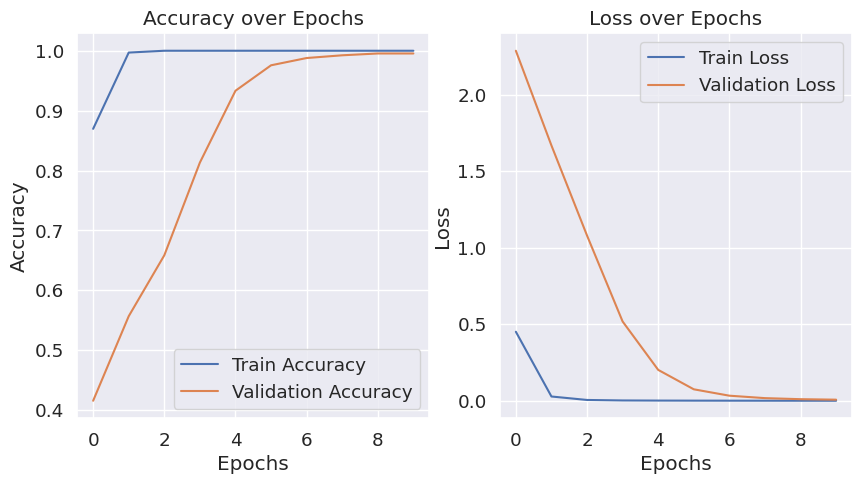

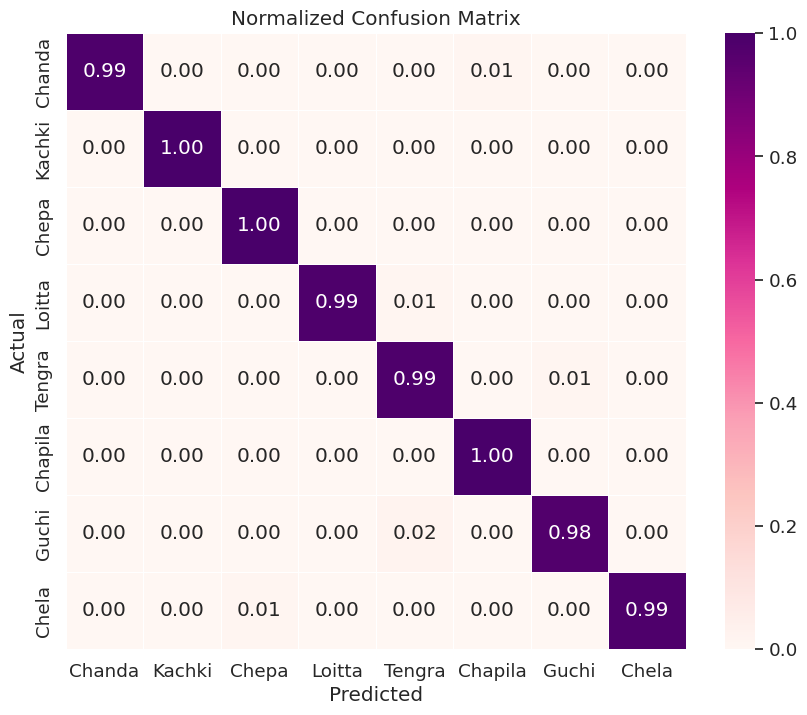

21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step


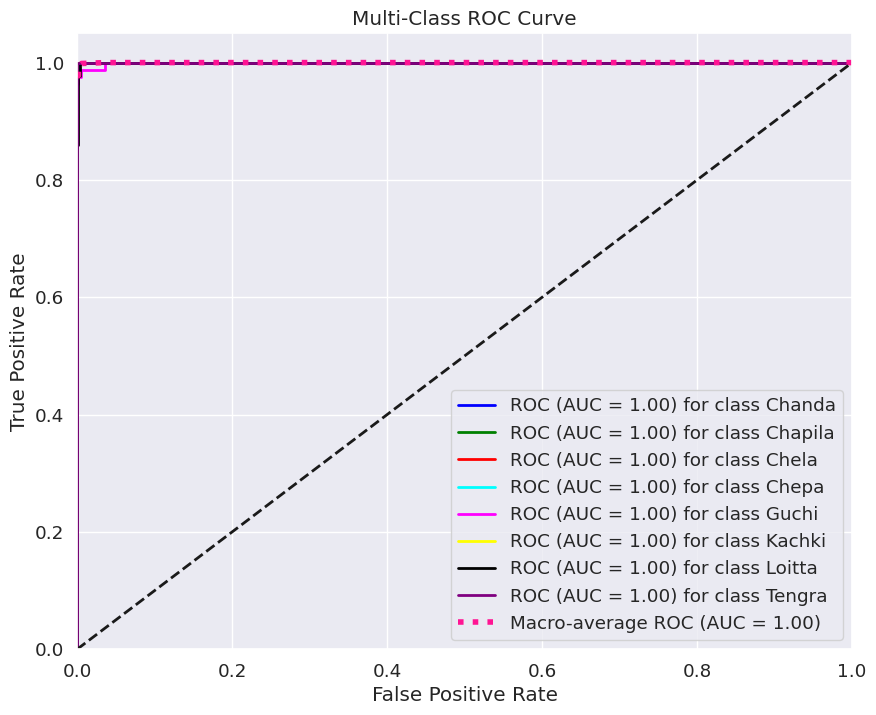

In [ ]:
# =====================================
# ✅ Reproducible MobileNetV2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 25

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=10,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=10,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/DF_Tail/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


#### ResNet50v2

✅ Reproducibility enabled with SEED = 42


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 206, 206,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 100, 100,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 102, 102,  │          0 │ conv1_conv[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 50, 50,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │        256 │ pool1_pool[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │          0 │ conv2_block1_pre… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 50, 50,    │      4,096 │ conv2_block1_pre… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 50, 50,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 50, 50,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_pad  │ (None, 52, 52,    │          0 │ conv2_block1_1_r… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 50, 50,    │     36,864 │ conv2_block1_2_p… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 50, 50,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 50, 50,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_pre… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_out    │ (None, 50, 50,    │          0 │ conv2_block1_0_c

 Total params: 23,581,192 (89.96 MB)

 Trainable params: 23,535,752 (89.78 MB)

 Non-trainable params: 45,440 (177.50 KB)

Epoch 1/5
247/247 ━━━━━━━━━━━━━━━━━━━━ 72s 163ms/step - accuracy: 0.7597 - loss: 0.7634 - val_accuracy: 0.8953 - val_loss: 0.2892
Epoch 2/5
247/247 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - accuracy: 0.9747 - loss: 0.0916 - val_accuracy: 0.9636 - val_loss: 0.1201
Epoch 3/5
247/247 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - accuracy: 0.9969 - loss: 0.0299 - val_accuracy: 0.9560 - val_loss: 0.1335
Epoch 4/5
247/247 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - accuracy: 0.9952 - loss: 0.0195 - val_accuracy: 0.9848 - val_loss: 0.0497
Epoch 5/5
247/247 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - accuracy: 0.9982 - loss: 0.0139 - val_accuracy: 0.9757 - val_loss: 0.0879
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - accuracy: 0.9662 - loss: 0.1199
Test Accuracy: 0.9756 | Test Loss: 0.0895
21/21 ━━━━━━━━━━━━━━━━━━━━ 5s 170ms/step

Classification Report:
              precision    recall  f1-score   support

           0       0.91      1.00      0.95        81
           1       1.00      0.93      0.96        80
     

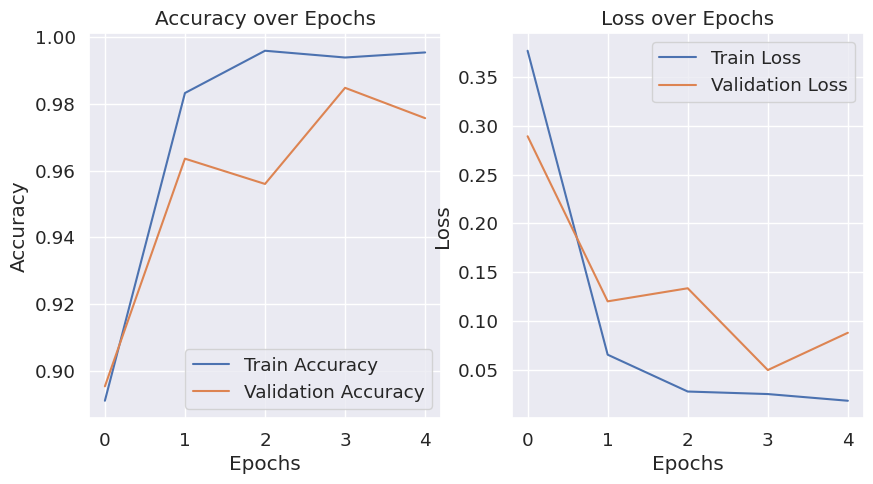

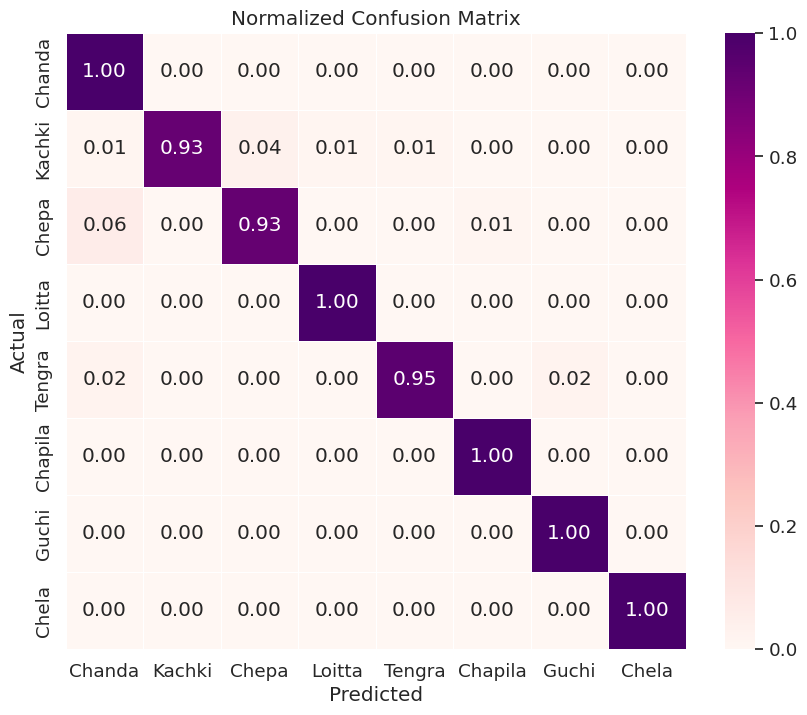

21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step


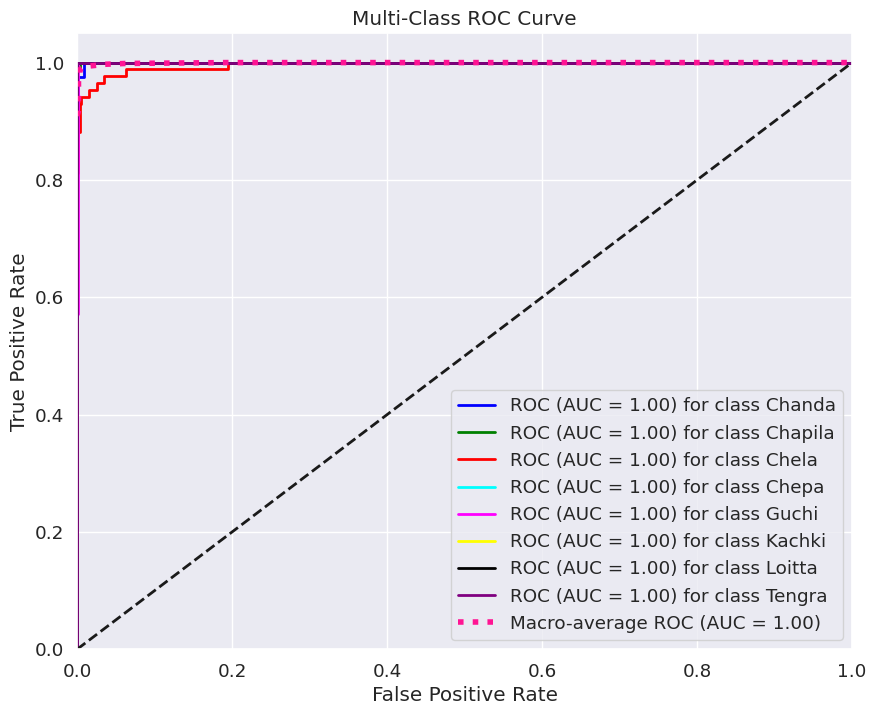

In [ ]:
# =====================================
# ✅ Reproducible MobileNetV2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = ResNet50V2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=5,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=5,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/DF_Tail/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


✅ Reproducibility enabled with SEED = 33


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 206, 206,  │          0 │ input_layer_2[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 100, 100,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 102, 102,  │          0 │ conv1_conv[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 50, 50,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │        256 │ pool1_pool[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │          0 │ conv2_block1_pre… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 50, 50,    │      4,096 │ conv2_block1_pre… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 50, 50,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 50, 50,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_pad  │ (None, 52, 52,    │          0 │ conv2_block1_1_r… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 50, 50,    │     36,864 │ conv2_block1_2_p… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 50, 50,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 50, 50,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_pre… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_out    │ (None, 50, 50,    │          0 │ conv2_block1_0_c

 Total params: 23,581,192 (89.96 MB)

 Trainable params: 23,535,752 (89.78 MB)

 Non-trainable params: 45,440 (177.50 KB)

Epoch 1/5
247/247 ━━━━━━━━━━━━━━━━━━━━ 85s 164ms/step - accuracy: 0.7440 - loss: 0.7937 - val_accuracy: 0.9302 - val_loss: 0.2232
Epoch 2/5
247/247 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - accuracy: 0.9823 - loss: 0.0644 - val_accuracy: 0.9272 - val_loss: 0.2336
Epoch 3/5
247/247 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - accuracy: 0.9873 - loss: 0.0431 - val_accuracy: 0.9879 - val_loss: 0.0480
Epoch 4/5
247/247 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - accuracy: 0.9949 - loss: 0.0176 - val_accuracy: 0.9712 - val_loss: 0.0910
Epoch 5/5
247/247 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - accuracy: 0.9964 - loss: 0.0123 - val_accuracy: 0.9772 - val_loss: 0.0693
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step - accuracy: 0.9869 - loss: 0.0478
Test Accuracy: 0.9863 | Test Loss: 0.0462
21/21 ━━━━━━━━━━━━━━━━━━━━ 6s 169ms/step

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.98      0.97        81
           1       1.00      0.99      0.99        80
     

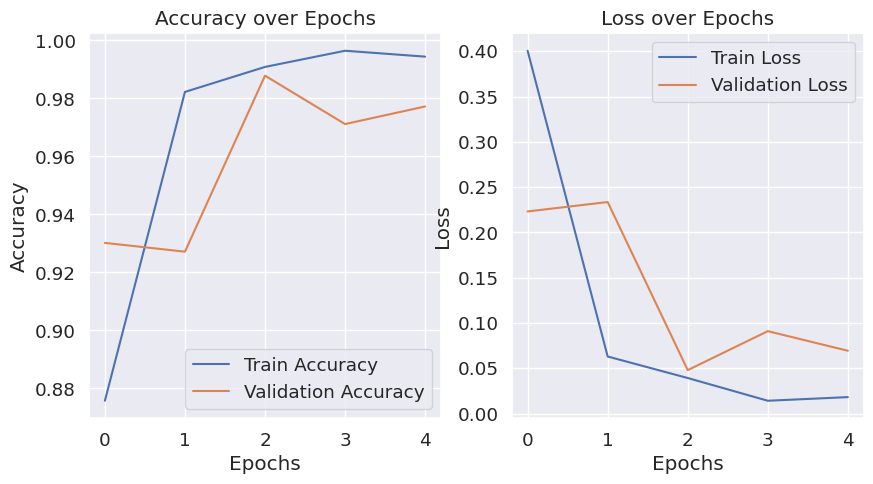

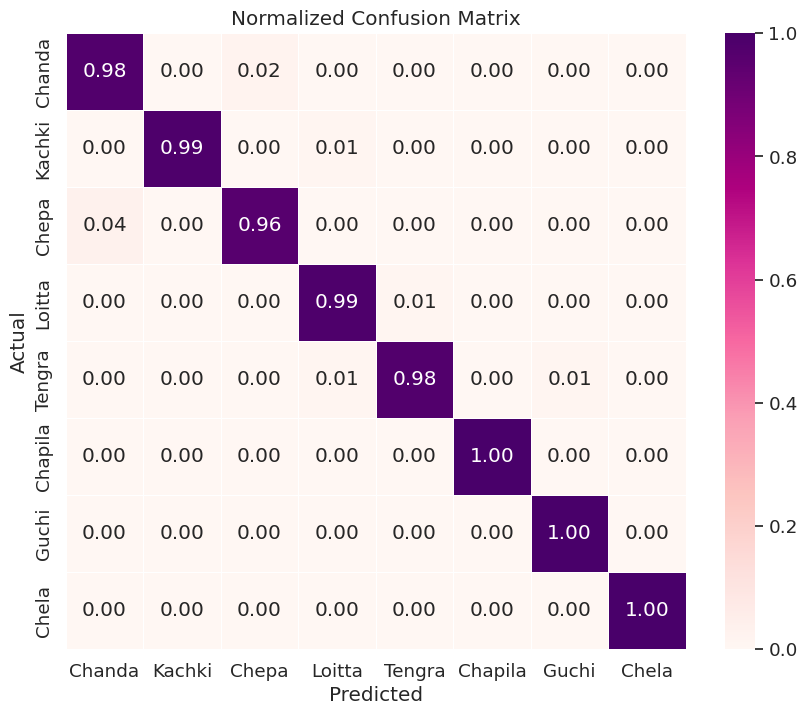

21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step


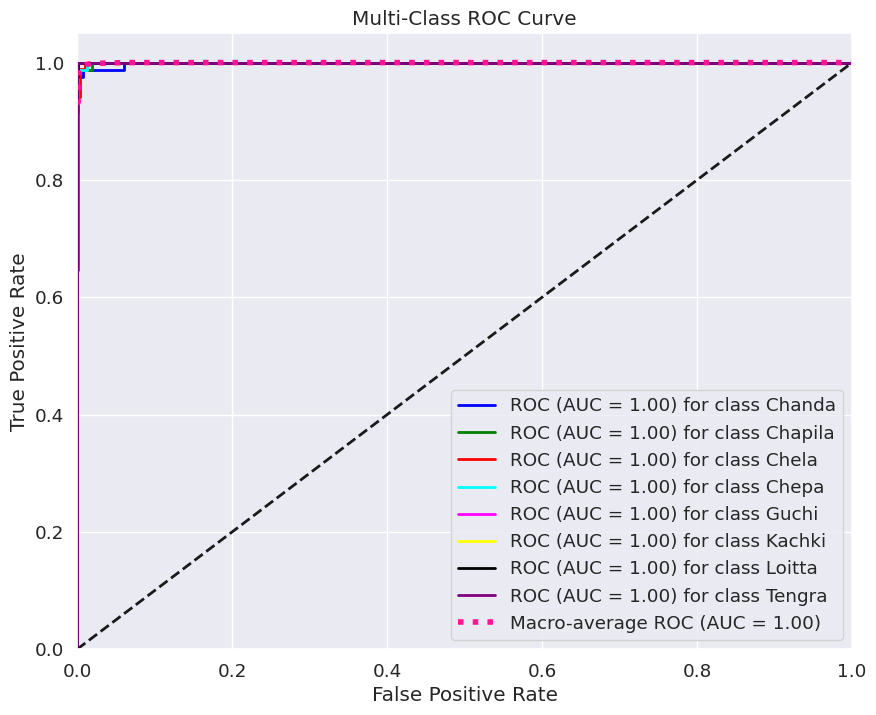

In [ ]:
# =====================================
# ✅ Reproducible MobileNetV2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 33

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = ResNet50V2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=5,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=5,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/DF_Tail/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


✅ Reproducibility enabled with SEED = 25


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 206, 206,  │          0 │ input_layer_3[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 100, 100,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 102, 102,  │          0 │ conv1_conv[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 50, 50,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │        256 │ pool1_pool[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │          0 │ conv2_block1_pre… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 50, 50,    │      4,096 │ conv2_block1_pre… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 50, 50,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 50, 50,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_pad  │ (None, 52, 52,    │          0 │ conv2_block1_1_r… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 50, 50,    │     36,864 │ conv2_block1_2_p… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 50, 50,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 50, 50,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_pre… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_out    │ (None, 50, 50,    │          0 │ conv2_block1_0_c

 Total params: 23,581,192 (89.96 MB)

 Trainable params: 23,535,752 (89.78 MB)

 Non-trainable params: 45,440 (177.50 KB)

Epoch 1/5
247/247 ━━━━━━━━━━━━━━━━━━━━ 83s 164ms/step - accuracy: 0.7350 - loss: 0.7733 - val_accuracy: 0.9165 - val_loss: 0.2289
Epoch 2/5
247/247 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - accuracy: 0.9795 - loss: 0.0685 - val_accuracy: 0.9879 - val_loss: 0.0251
Epoch 3/5
247/247 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - accuracy: 0.9928 - loss: 0.0321 - val_accuracy: 0.9954 - val_loss: 0.0245
Epoch 4/5
247/247 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - accuracy: 0.9934 - loss: 0.0242 - val_accuracy: 0.9439 - val_loss: 0.1670
Epoch 5/5
247/247 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - accuracy: 0.9937 - loss: 0.0205 - val_accuracy: 0.9924 - val_loss: 0.0150
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 104ms/step - accuracy: 0.9928 - loss: 0.0294
Test Accuracy: 0.9924 | Test Loss: 0.0436
21/21 ━━━━━━━━━━━━━━━━━━━━ 5s 169ms/step

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.96      0.98        81
           1       1.00      0.99      0.99        80
     

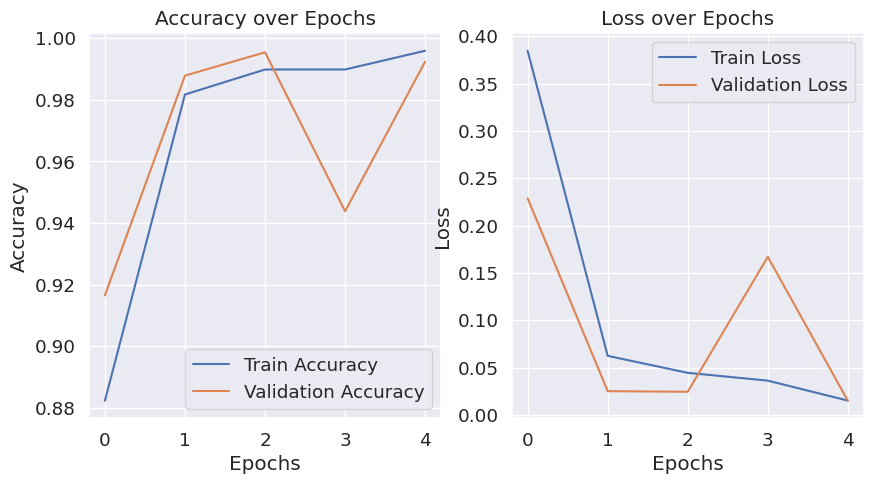

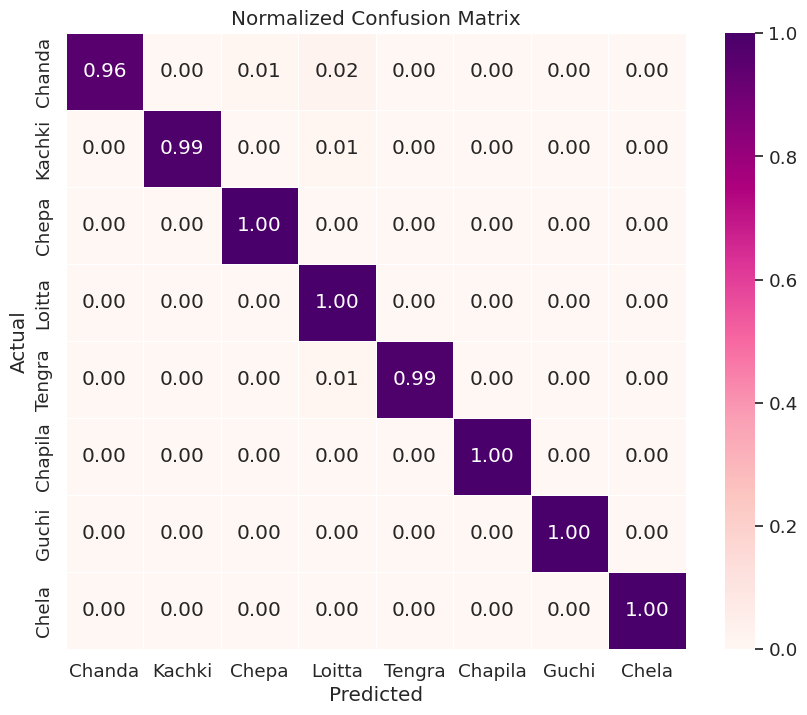

21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step


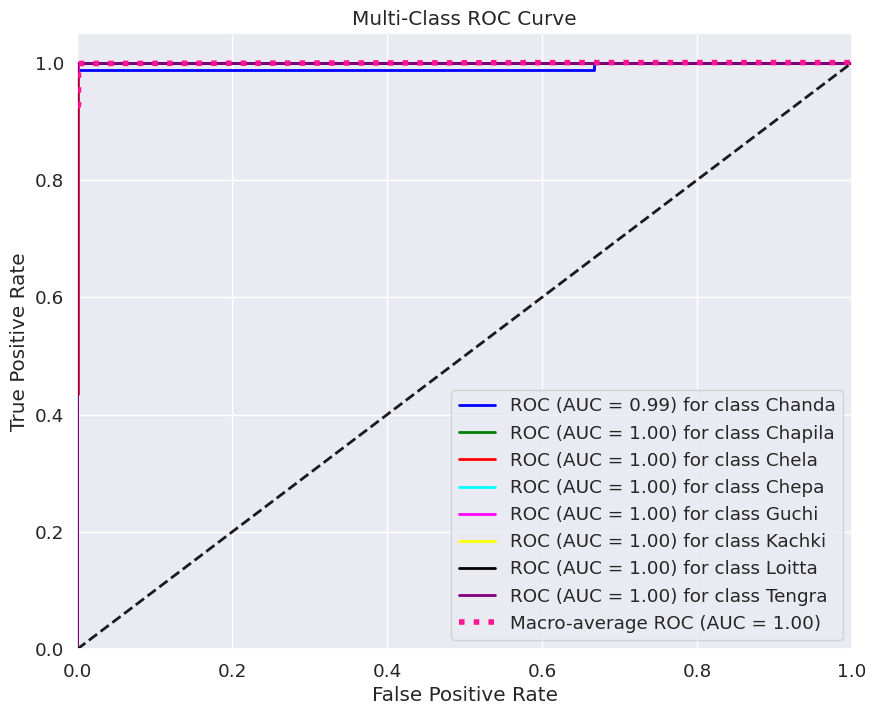

In [ ]:
# =====================================
# ✅ Reproducible MobileNetV2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 25

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = ResNet50V2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=5,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=5,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/DF_Tail/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


#DF_ALL_Augmented

In [ ]:

# ============================================================
# ✅ Copying validation and test set of DF_ALL dataset
# ============================================================

import shutil
import os

def copy_folder(source_folder, destination_folder):
    """
    Copy an entire folder and its contents to a new location.

    If the destination folder exists, it will be overwritten.
    """
    try:
        if os.path.exists(destination_folder):
            print(f"Destination folder '{destination_folder}' already exists. Overwriting...")
            shutil.rmtree(destination_folder)

        shutil.copytree(source_folder, destination_folder)
        print(f"Folder copied from '{source_folder}' to '{destination_folder}' successfully.")

    except Exception as e:
        print(f"Error copying folder: {e}")

# Example usage
source = "/content/drive/MyDrive/DF_ALL/test" # <- /validation, /test
destination = "/content/drive/MyDrive/DF_ALL_Augmented/test"  # <- /validation, /test
copy_folder(source, destination)


Folder copied from '/content/drive/MyDrive/DF_ALL/test' to '/content/drive/MyDrive/DF_ALL_Augmented/test' successfully.


In [ ]:

# ====================================
# ✅ Training Set Augmentation Script
# ====================================

import os
import random
import numpy as np
from PIL import Image, ImageEnhance, ImageFilter
import random


fl=os.listdir("/content/drive/MyDrive/DF_ALL/train")

for i in fl:

      input_folder= "/content/drive/MyDrive/DF_ALL/train/"+str(i)


      output_folder = "/content/drive/MyDrive/DF_ALL_Augmented/train/"+str(i)+"/"

      # Create output folder if it doesn't exist
      if not os.path.exists(output_folder):
          os.makedirs(output_folder)

      # Augmentation methods
      def flip_horizontal(image):
          return image.transpose(Image.FLIP_LEFT_RIGHT)

      def flip_vertical(image):
          return image.transpose(Image.FLIP_TOP_BOTTOM)

      def rotate_90_clockwise(image):
          return image.rotate(-90, expand=False)

      def rotate_90_counterclockwise(image):
          return image.rotate(90, expand=False)

      def rotate_180(image):
          return image.rotate(180, expand=False)

      def rotate(image, angle):
          return image.rotate(angle, expand=False)

      def adjust_brightness(image, factor):
          enhancer = ImageEnhance.Brightness(image)
          return enhancer.enhance(factor)

      def apply_blur(image, radius):
          return image.filter(ImageFilter.GaussianBlur(radius))

      def add_noise(image, noise_factor):
          # Convert image to numpy array
          np_image = np.array(image)
          # Calculate number of pixels to modify
          noise_pixels = int(noise_factor * np_image.size)
          # Randomly choose pixel indices to alter
          for _ in range(noise_pixels):
              x = random.randint(0, np_image.shape[0] - 1)
              y = random.randint(0, np_image.shape[1] - 1)
              np_image[x, y] = random.randint(0, 255)  # Random grayscale noise
          return Image.fromarray(np_image)

      # List of all augmentations
      augmentations = [
          flip_horizontal,
          rotate_90_clockwise,
          lambda img: rotate(img, 25),
          lambda img: adjust_brightness(img, 1.3),
          lambda img: apply_blur(img, 2.5),
          rotate_180,
          flip_vertical,
          rotate_90_counterclockwise,
          lambda img: rotate(img, -25),
          lambda img: adjust_brightness(img, 0.7),
          lambda img: add_noise(img, 0.02)
      ]

      for filename in os.listdir(input_folder):

          if filename.endswith(('.png', '.jpg', '.jpeg')):

              image_path = os.path.join(input_folder, filename)

              image = Image.open(image_path)

              image.save(os.path.join(output_folder, filename))

              random_augmentations = random.sample(augmentations, 2)

              ag=[random_augmentations]
              print(ag[0])
              selected_augmentations = ag[0]
              x=0

              for aug in selected_augmentations:
                  aug_pic = aug(image)
                  aug_pic.save(os.path.join(output_folder, f"{os.path.splitext(filename)[0]}_{x}.JPG"))
                  x+=1

              #print(f"Augmentating {i}!")


In [2]:
import numpy as np
import pandas as pd
import os
from sklearn.metrics import classification_report
import seaborn as sn
from sklearn.utils import shuffle
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
from tqdm import tqdm

class_names= os.listdir("/content/drive/MyDrive/DF_ALL_Augmented/train")

class_names_labels={class_name:i for i, class_name in enumerate(class_names)}

print(class_names_labels)

nb_classes=len(class_names)

IMAGE_SIZE=(200,200)

def load_data():
    direct='/content/drive/MyDrive/DF_ALL_Augmented/'
    category=['train','valid','test']

    output=[]

    for cat in category:
      path=os.path.join(direct,cat)
      print(path)

      images=[]
      labels=[]

      for folder in os.listdir(path):
        print("folder:",folder)
        label= class_names_labels[folder]
        i=0
        #Iterating each image
        for fle in os.listdir(os.path.join(path,folder)):

          img_path=os.path.join(os.path.join(path,folder),fle)

          image=cv2.imread(img_path)

          image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
          image=cv2.resize(image,IMAGE_SIZE)

          images.append(image)
          labels.append(label)

      images=np.array(images,dtype='float32')
      labels=np.array(labels,dtype='int32')

      output.append((images,labels))
    #print(type(output[0]))
    return output

(train_images,train_lables), (valid_images,valid_lables), (test_images,test_lables) = load_data()

{'Tengra': 0, 'Loitta': 1, 'Guchi': 2, 'Chela': 3, 'Chapila': 4, 'Kachki': 5, 'Chepa': 6, 'Chanda': 7}
/content/drive/MyDrive/DF_ALL_Augmented/train
folder: Tengra
folder: Loitta
folder: Guchi
folder: Chela
folder: Chapila
folder: Kachki
folder: Chepa
folder: Chanda
/content/drive/MyDrive/DF_ALL_Augmented/valid
folder: Chela
folder: Tengra
folder: Chapila
folder: Chepa
folder: Kachki
folder: Guchi
folder: Loitta
folder: Chanda
/content/drive/MyDrive/DF_ALL_Augmented/test
folder: Chapila
folder: Kachki
folder: Chela
folder: Guchi
folder: Chanda
folder: Loitta
folder: Chepa
folder: Tengra


#### MobileNetV2

✅ Reproducibility enabled with SEED = 42


/tmp/ipython-input-908608321.py:39: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 100, 100,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 100, 100,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 100, 100,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 100, 100,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 100, 100,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 100, 100,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 101, 101,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 50, 50,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 50, 50,    │      2,304 │ block_1_depthwis

 Total params: 2,268,232 (8.65 MB)

 Trainable params: 2,234,120 (8.52 MB)

 Non-trainable params: 34,112 (133.25 KB)

Epoch 1/10
740/740 ━━━━━━━━━━━━━━━━━━━━ 107s 97ms/step - accuracy: 0.8054 - loss: 0.6023 - val_accuracy: 0.6525 - val_loss: 1.3241
Epoch 2/10
740/740 ━━━━━━━━━━━━━━━━━━━━ 73s 92ms/step - accuracy: 0.9933 - loss: 0.0361 - val_accuracy: 0.9605 - val_loss: 0.1135
Epoch 3/10
740/740 ━━━━━━━━━━━━━━━━━━━━ 69s 93ms/step - accuracy: 0.9969 - loss: 0.0126 - val_accuracy: 1.0000 - val_loss: 0.0026
Epoch 4/10
740/740 ━━━━━━━━━━━━━━━━━━━━ 69s 93ms/step - accuracy: 0.9985 - loss: 0.0086 - val_accuracy: 0.9120 - val_loss: 0.2600
Epoch 5/10
740/740 ━━━━━━━━━━━━━━━━━━━━ 68s 92ms/step - accuracy: 0.9771 - loss: 0.0685 - val_accuracy: 0.9924 - val_loss: 0.0219
Epoch 6/10
740/740 ━━━━━━━━━━━━━━━━━━━━ 68s 92ms/step - accuracy: 0.9933 - loss: 0.0242 - val_accuracy: 0.9970 - val_loss: 0.0084
Epoch 7/10
740/740 ━━━━━━━━━━━━━━━━━━━━ 67s 91ms/step - accuracy: 0.9939 - loss: 0.0189 - val_accuracy: 1.0000 - val_loss: 0.0011
Epoch 8/10
740/740 ━━━━━━━━━━━━━━━━━━━━ 67s 91ms/step - accuracy: 0.9988 - loss: 0.0057 -

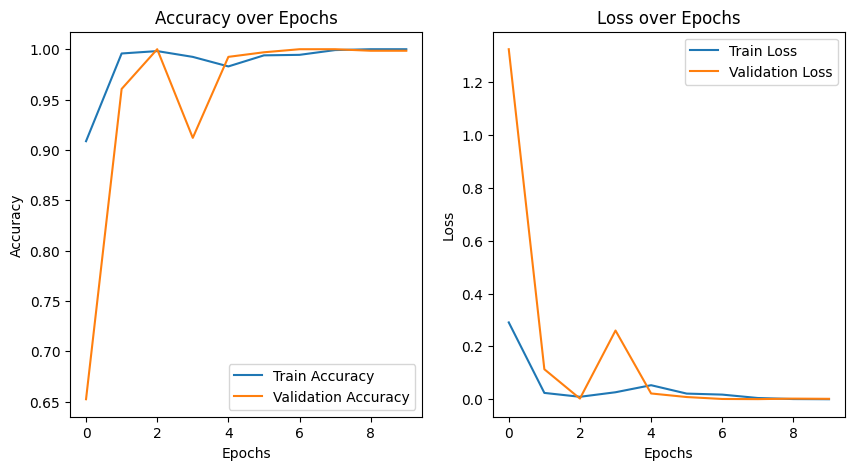

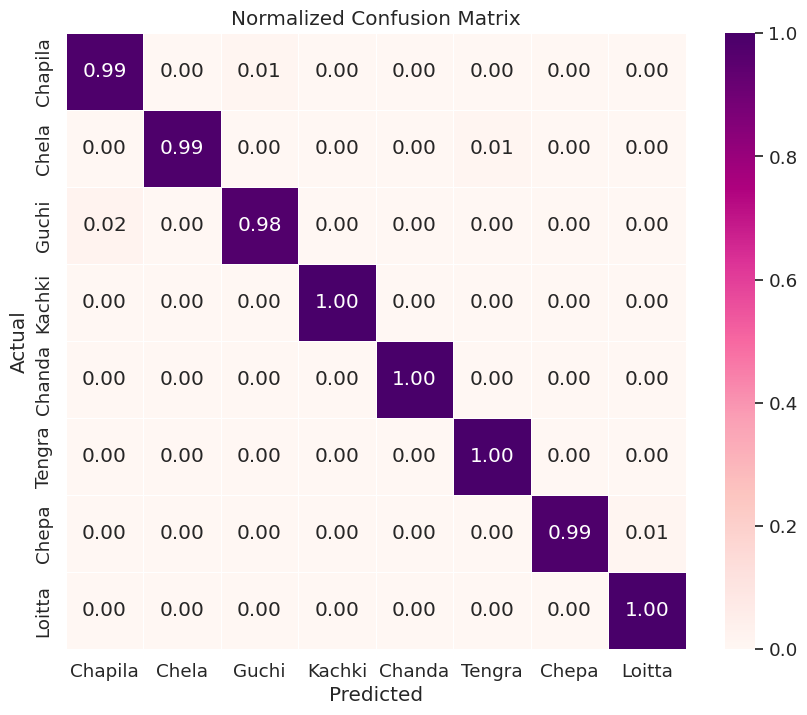

21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step


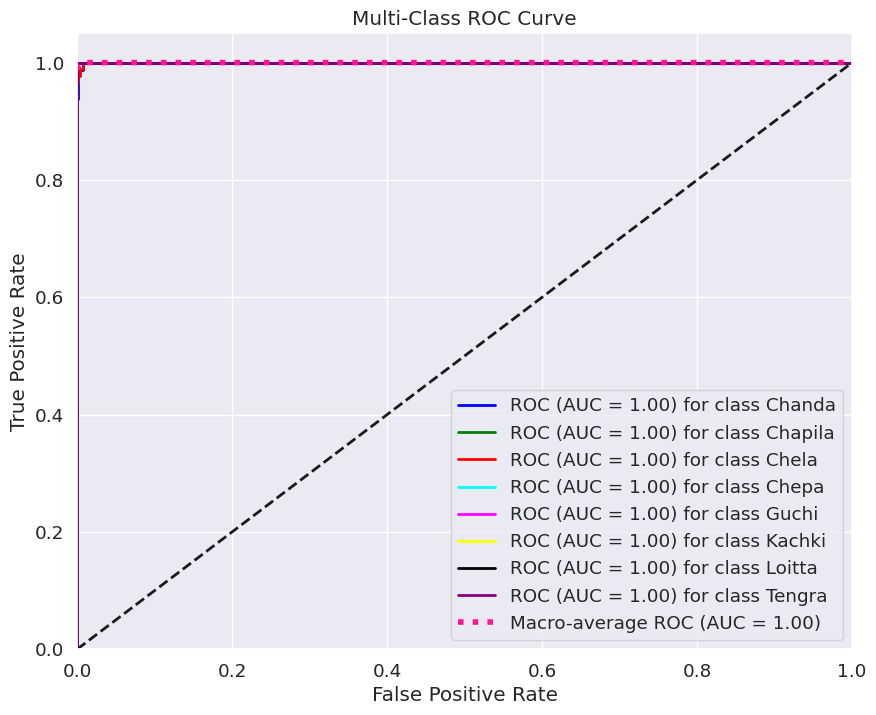

In [ ]:
# =====================================
# ✅ Reproducible MobileNetV2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=10,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=10,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/DF_ALL_Augmented/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


✅ Reproducibility enabled with SEED = 33


/tmp/ipython-input-1095581344.py:39: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 100, 100,  │        864 │ input_layer_2[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 100, 100,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 100, 100,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 100, 100,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 100, 100,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 100, 100,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 101, 101,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 50, 50,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 50, 50,    │      2,304 │ block_1_depthwis

 Total params: 2,268,232 (8.65 MB)

 Trainable params: 2,234,120 (8.52 MB)

 Non-trainable params: 34,112 (133.25 KB)

Epoch 1/10
740/740 ━━━━━━━━━━━━━━━━━━━━ 112s 95ms/step - accuracy: 0.7926 - loss: 0.6401 - val_accuracy: 0.6798 - val_loss: 1.5421
Epoch 2/10
740/740 ━━━━━━━━━━━━━━━━━━━━ 68s 92ms/step - accuracy: 0.9870 - loss: 0.0431 - val_accuracy: 0.9150 - val_loss: 0.2287
Epoch 3/10
740/740 ━━━━━━━━━━━━━━━━━━━━ 68s 92ms/step - accuracy: 0.9981 - loss: 0.0129 - val_accuracy: 0.9894 - val_loss: 0.0242
Epoch 4/10
740/740 ━━━━━━━━━━━━━━━━━━━━ 68s 92ms/step - accuracy: 0.9924 - loss: 0.0257 - val_accuracy: 0.9287 - val_loss: 0.2859
Epoch 5/10
740/740 ━━━━━━━━━━━━━━━━━━━━ 68s 92ms/step - accuracy: 0.9845 - loss: 0.0464 - val_accuracy: 0.9970 - val_loss: 0.0132
Epoch 6/10
740/740 ━━━━━━━━━━━━━━━━━━━━ 81s 90ms/step - accuracy: 0.9982 - loss: 0.0102 - val_accuracy: 0.9939 - val_loss: 0.0150
Epoch 7/10
740/740 ━━━━━━━━━━━━━━━━━━━━ 67s 90ms/step - accuracy: 0.9976 - loss: 0.0143 - val_accuracy: 1.0000 - val_loss: 9.6621e-04
Epoch 8/10
740/740 ━━━━━━━━━━━━━━━━━━━━ 67s 90ms/step - accuracy: 0.9986 - loss: 0.00

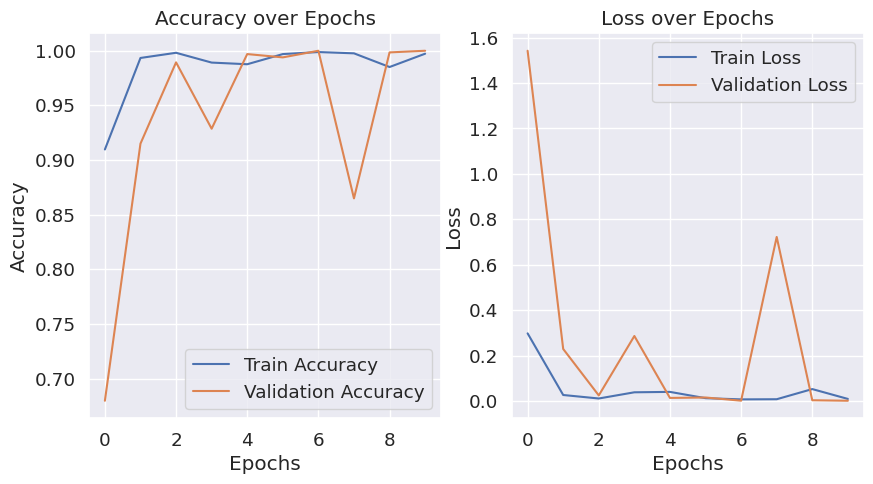

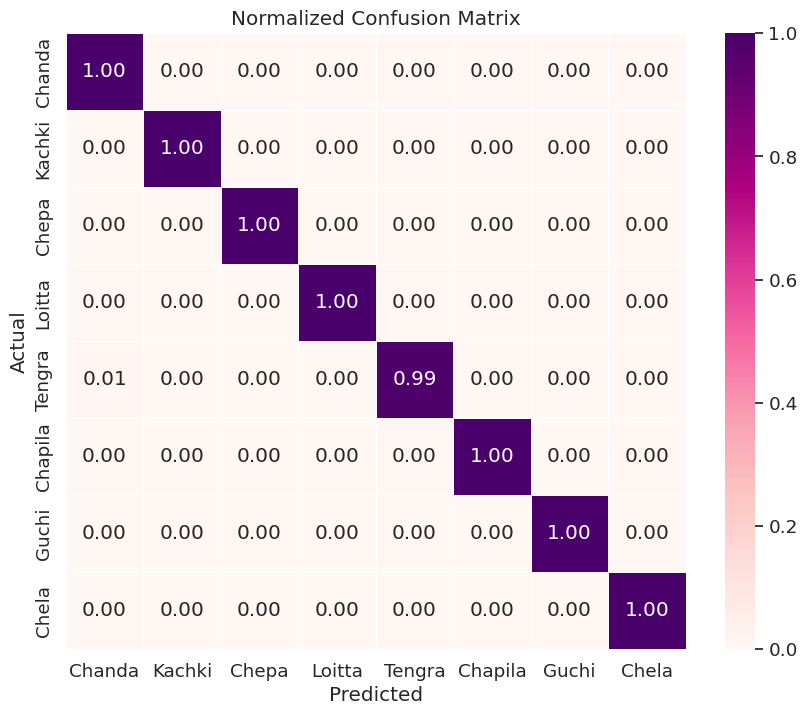

21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step


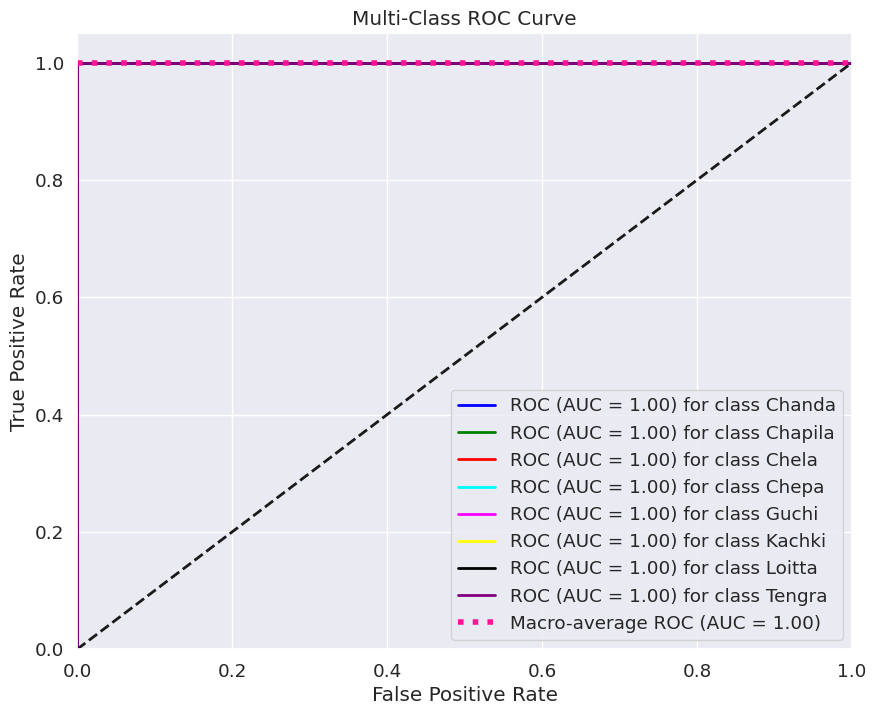

In [ ]:
# =====================================
# ✅ Reproducible MobileNetV2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 33

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=10,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=10,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/DF_ALL_Augmented/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


✅ Reproducibility enabled with SEED = 25


/tmp/ipython-input-1136867931.py:39: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 100, 100,  │        864 │ input_layer_3[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 100, 100,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 100, 100,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 100, 100,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 100, 100,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 100, 100,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 100, 100,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 100, 100,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 101, 101,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 50, 50,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 50, 50,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 50, 50,    │      2,304 │ block_1_depthwis

 Total params: 2,268,232 (8.65 MB)

 Trainable params: 2,234,120 (8.52 MB)

 Non-trainable params: 34,112 (133.25 KB)

Epoch 1/10
740/740 ━━━━━━━━━━━━━━━━━━━━ 100s 95ms/step - accuracy: 0.7790 - loss: 0.6400 - val_accuracy: 0.7238 - val_loss: 1.0068
Epoch 2/10
740/740 ━━━━━━━━━━━━━━━━━━━━ 69s 93ms/step - accuracy: 0.9853 - loss: 0.0483 - val_accuracy: 0.9439 - val_loss: 0.1703
Epoch 3/10
740/740 ━━━━━━━━━━━━━━━━━━━━ 68s 92ms/step - accuracy: 0.9948 - loss: 0.0194 - val_accuracy: 0.9954 - val_loss: 0.0160
Epoch 4/10
740/740 ━━━━━━━━━━━━━━━━━━━━ 68s 91ms/step - accuracy: 0.9987 - loss: 0.0092 - val_accuracy: 0.8832 - val_loss: 0.4934
Epoch 5/10
740/740 ━━━━━━━━━━━━━━━━━━━━ 67s 91ms/step - accuracy: 0.9710 - loss: 0.0867 - val_accuracy: 0.9954 - val_loss: 0.0106
Epoch 6/10
740/740 ━━━━━━━━━━━━━━━━━━━━ 68s 91ms/step - accuracy: 0.9926 - loss: 0.0258 - val_accuracy: 1.0000 - val_loss: 5.5438e-04
Epoch 7/10
740/740 ━━━━━━━━━━━━━━━━━━━━ 67s 91ms/step - accuracy: 0.9997 - loss: 0.0024 - val_accuracy: 0.9833 - val_loss: 0.0404
Epoch 8/10
740/740 ━━━━━━━━━━━━━━━━━━━━ 67s 90ms/step - accuracy: 0.9905 - loss: 0.03

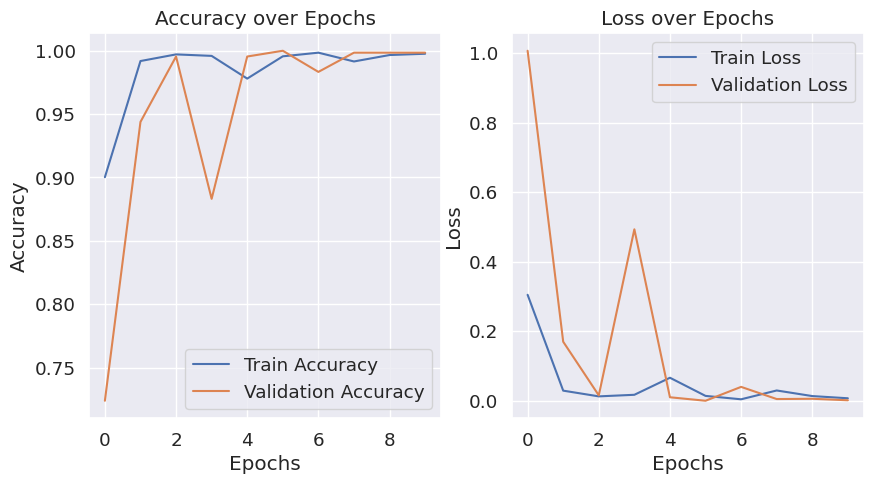

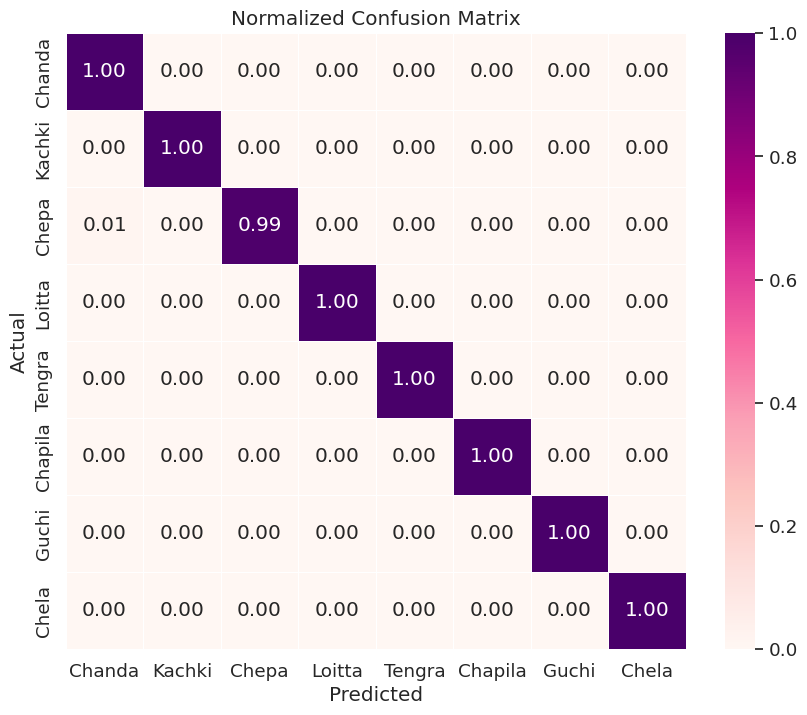

21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step


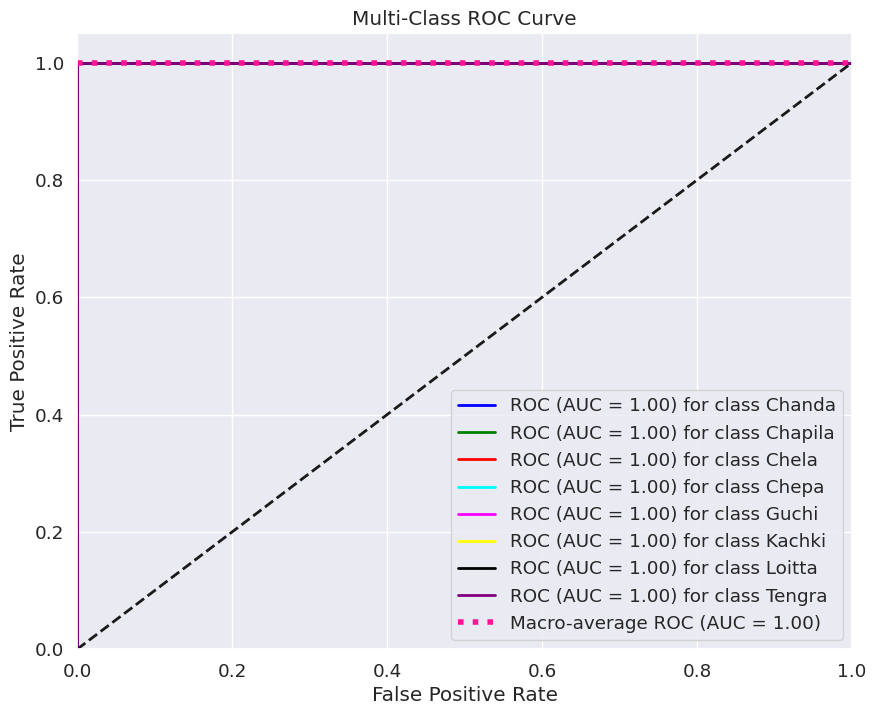

In [ ]:
# =====================================
# ✅ Reproducible MobileNetV2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 25

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = MobileNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=10,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=10,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/DF_ALL_Augmented/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


#### ResNet50v2

✅ Reproducibility enabled with SEED = 42


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 206, 206,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 100, 100,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 102, 102,  │          0 │ conv1_conv[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 50, 50,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │        256 │ pool1_pool[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │          0 │ conv2_block1_pre… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 50, 50,    │      4,096 │ conv2_block1_pre… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 50, 50,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 50, 50,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_pad  │ (None, 52, 52,    │          0 │ conv2_block1_1_r… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 50, 50,    │     36,864 │ conv2_block1_2_p… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 50, 50,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 50, 50,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_pre… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_out    │ (None, 50, 50,    │          0 │ conv2_block1_0_c

 Total params: 23,581,192 (89.96 MB)

 Trainable params: 23,535,752 (89.78 MB)

 Non-trainable params: 45,440 (177.50 KB)

Epoch 1/5
740/740 ━━━━━━━━━━━━━━━━━━━━ 145s 150ms/step - accuracy: 0.8145 - loss: 0.5635 - val_accuracy: 0.9454 - val_loss: 0.1647
Epoch 2/5
740/740 ━━━━━━━━━━━━━━━━━━━━ 108s 146ms/step - accuracy: 0.9793 - loss: 0.0667 - val_accuracy: 0.9879 - val_loss: 0.0341
Epoch 3/5
740/740 ━━━━━━━━━━━━━━━━━━━━ 108s 146ms/step - accuracy: 0.9829 - loss: 0.0479 - val_accuracy: 0.7208 - val_loss: 0.8783
Epoch 4/5
740/740 ━━━━━━━━━━━━━━━━━━━━ 108s 146ms/step - accuracy: 0.9796 - loss: 0.0615 - val_accuracy: 0.9954 - val_loss: 0.0127
Epoch 5/5
740/740 ━━━━━━━━━━━━━━━━━━━━ 111s 150ms/step - accuracy: 0.9944 - loss: 0.0207 - val_accuracy: 1.0000 - val_loss: 0.0036
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 104ms/step - accuracy: 0.9984 - loss: 0.0105
Test Accuracy: 0.9954 | Test Loss: 0.0114
21/21 ━━━━━━━━━━━━━━━━━━━━ 5s 178ms/step

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.98      0.98        81
           1       1.00      1.00      1.00        80


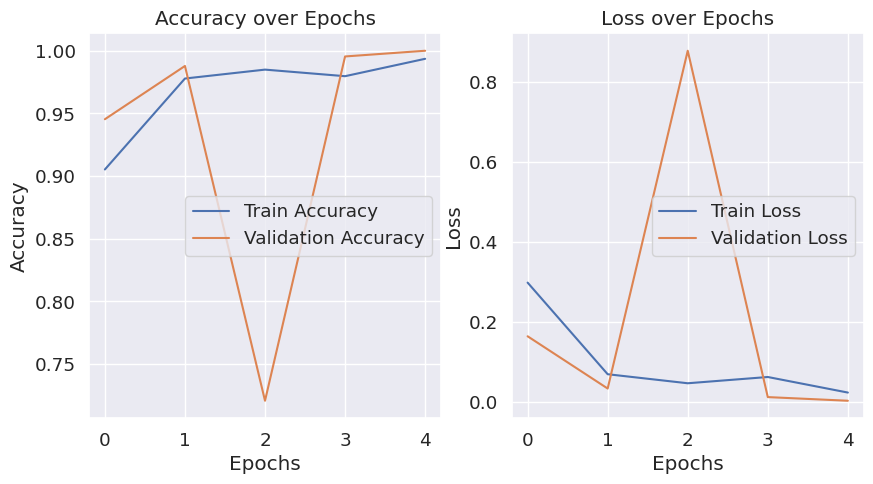

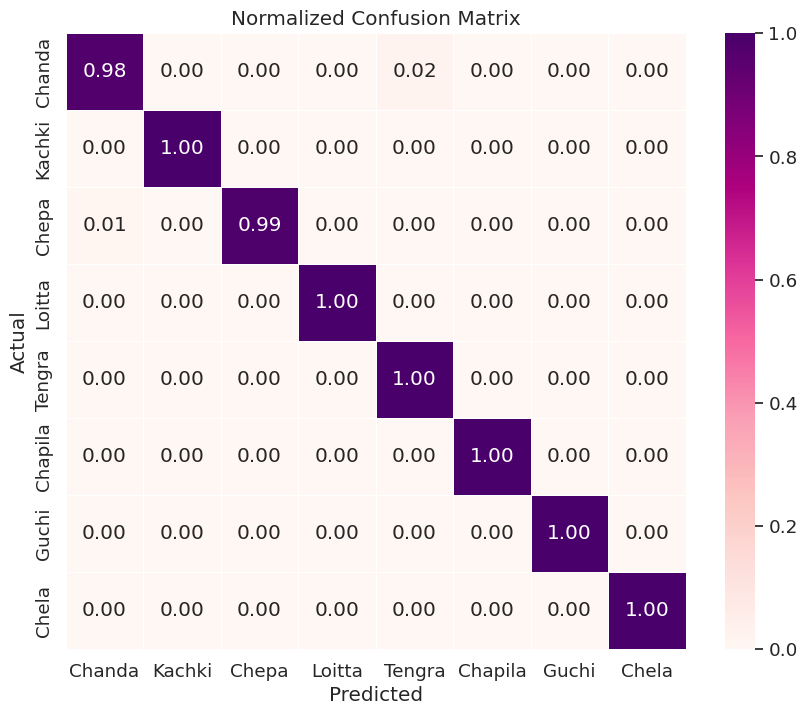

21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step


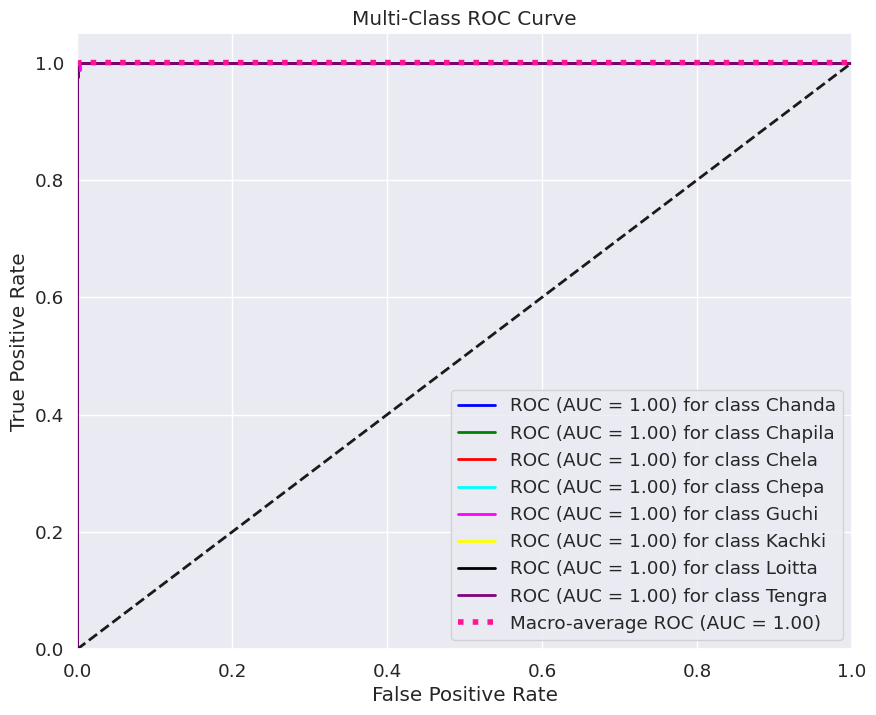

In [ ]:
# =====================================
# ✅ Reproducible ResNet50V2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = ResNet50V2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=5,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=5,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/DF_ALL_Augmented/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


✅ Reproducibility enabled with SEED = 33


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 206, 206,  │          0 │ input_layer_2[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 100, 100,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 102, 102,  │          0 │ conv1_conv[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 50, 50,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │        256 │ pool1_pool[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │          0 │ conv2_block1_pre… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 50, 50,    │      4,096 │ conv2_block1_pre… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 50, 50,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 50, 50,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_pad  │ (None, 52, 52,    │          0 │ conv2_block1_1_r… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 50, 50,    │     36,864 │ conv2_block1_2_p… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 50, 50,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 50, 50,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_pre… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_out    │ (None, 50, 50,    │          0 │ conv2_block1_0_c

 Total params: 23,581,192 (89.96 MB)

 Trainable params: 23,535,752 (89.78 MB)

 Non-trainable params: 45,440 (177.50 KB)

Epoch 1/5
740/740 ━━━━━━━━━━━━━━━━━━━━ 144s 150ms/step - accuracy: 0.8116 - loss: 0.5934 - val_accuracy: 0.9803 - val_loss: 0.0660
Epoch 2/5
740/740 ━━━━━━━━━━━━━━━━━━━━ 109s 147ms/step - accuracy: 0.9715 - loss: 0.0820 - val_accuracy: 0.9666 - val_loss: 0.1137
Epoch 3/5
740/740 ━━━━━━━━━━━━━━━━━━━━ 109s 147ms/step - accuracy: 0.9841 - loss: 0.0538 - val_accuracy: 1.0000 - val_loss: 0.0029
Epoch 4/5
740/740 ━━━━━━━━━━━━━━━━━━━━ 108s 146ms/step - accuracy: 0.9946 - loss: 0.0219 - val_accuracy: 0.9014 - val_loss: 0.2771
Epoch 5/5
740/740 ━━━━━━━━━━━━━━━━━━━━ 108s 146ms/step - accuracy: 0.9862 - loss: 0.0505 - val_accuracy: 0.8938 - val_loss: 0.3120
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - accuracy: 0.9970 - loss: 0.0170
Test Accuracy: 0.9924 | Test Loss: 0.0286
21/21 ━━━━━━━━━━━━━━━━━━━━ 5s 169ms/step

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99        81
           1       1.00      0.96      0.98        80


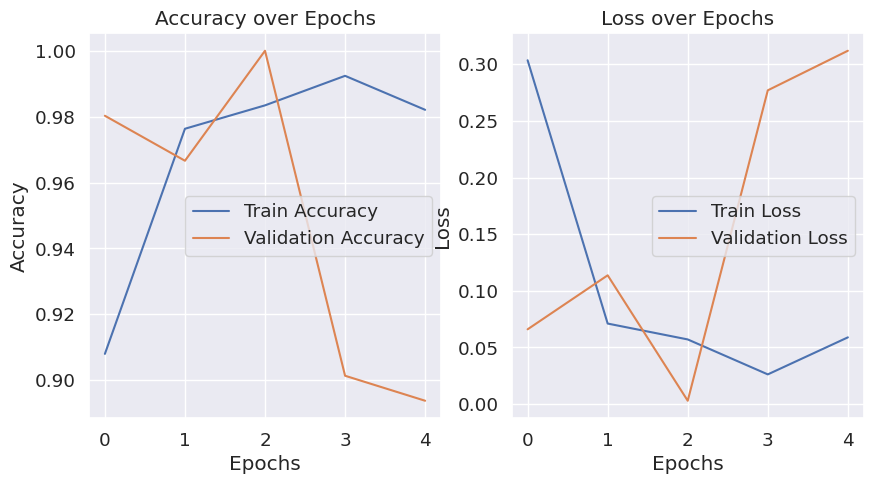

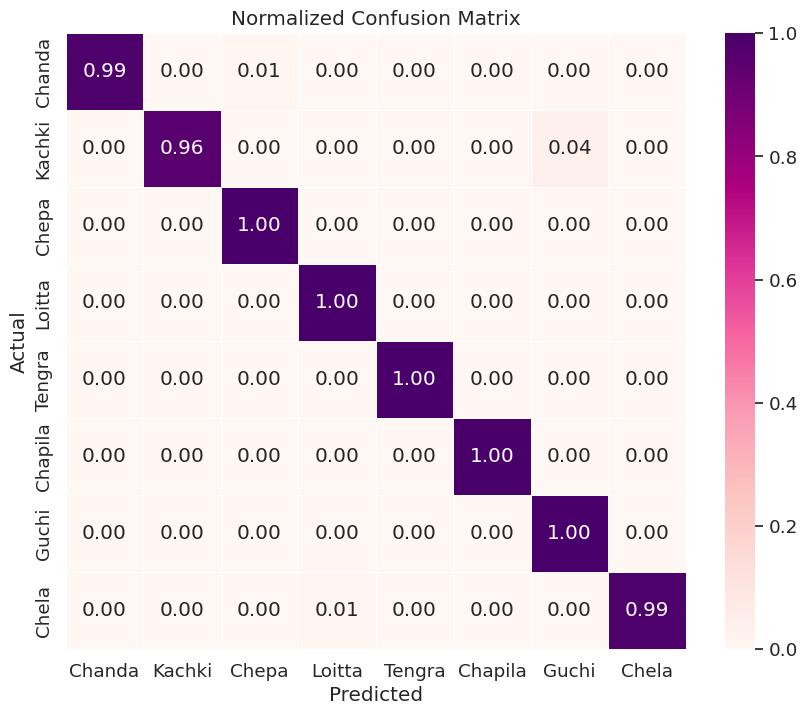

21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step


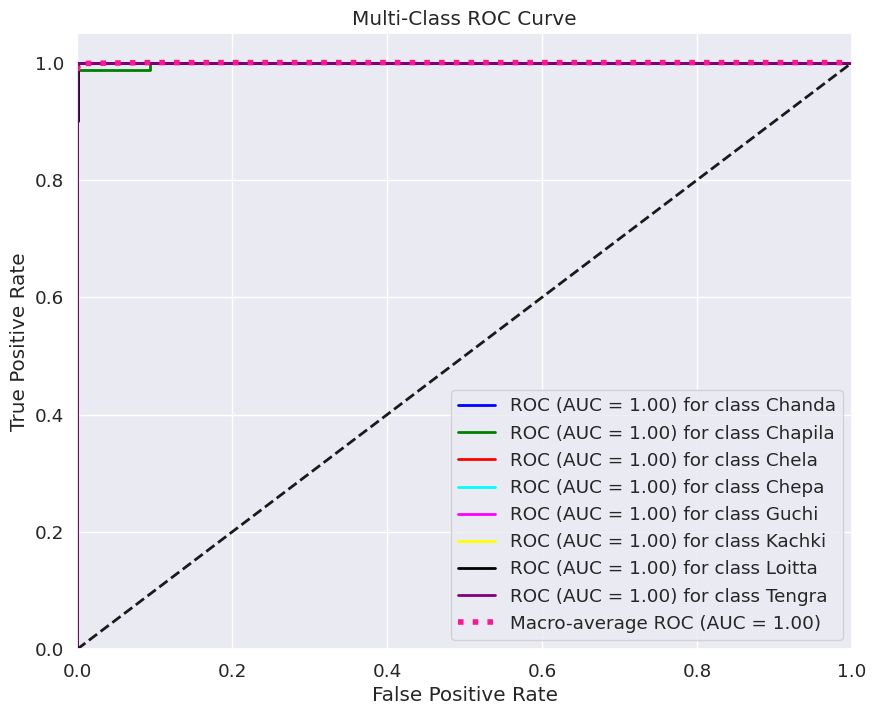

In [ ]:
# =====================================
# ✅ Reproducible ResNet50V2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 33

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = ResNet50V2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=5,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=5,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/DF_ALL_Augmented/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()


✅ Reproducibility enabled with SEED = 25
94668760/94668760 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 200, 200,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 206, 206,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 100, 100,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 102, 102,  │          0 │ conv1_conv[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 50, 50,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │        256 │ pool1_pool[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 50, 50,    │          0 │ conv2_block1_pre… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 50, 50,    │      4,096 │ conv2_block1_pre… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 50, 50,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 50, 50,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_pad  │ (None, 52, 52,    │          0 │ conv2_block1_1_r… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 50, 50,    │     36,864 │ conv2_block1_2_p… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 50, 50,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 50, 50,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_pre… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 50, 50,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_out    │ (None, 50, 50,    │          0 │ conv2_block1_0_c

 Total params: 23,581,192 (89.96 MB)

 Trainable params: 23,535,752 (89.78 MB)

 Non-trainable params: 45,440 (177.50 KB)

Epoch 1/5
740/740 ━━━━━━━━━━━━━━━━━━━━ 142s 144ms/step - accuracy: 0.8016 - loss: 0.5955 - val_accuracy: 0.9651 - val_loss: 0.1213
Epoch 2/5
740/740 ━━━━━━━━━━━━━━━━━━━━ 105s 142ms/step - accuracy: 0.9748 - loss: 0.0859 - val_accuracy: 0.9954 - val_loss: 0.0140
Epoch 3/5
740/740 ━━━━━━━━━━━━━━━━━━━━ 105s 142ms/step - accuracy: 0.9822 - loss: 0.0622 - val_accuracy: 0.9924 - val_loss: 0.0163
Epoch 4/5
740/740 ━━━━━━━━━━━━━━━━━━━━ 105s 142ms/step - accuracy: 0.9908 - loss: 0.0300 - val_accuracy: 0.9742 - val_loss: 0.0869
Epoch 5/5
740/740 ━━━━━━━━━━━━━━━━━━━━ 108s 145ms/step - accuracy: 0.9856 - loss: 0.0533 - val_accuracy: 0.9909 - val_loss: 0.0256
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - accuracy: 0.9971 - loss: 0.0147
Test Accuracy: 0.9924 | Test Loss: 0.0306
21/21 ━━━━━━━━━━━━━━━━━━━━ 5s 190ms/step

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99        81
           1       1.00      0.97      0.99        80


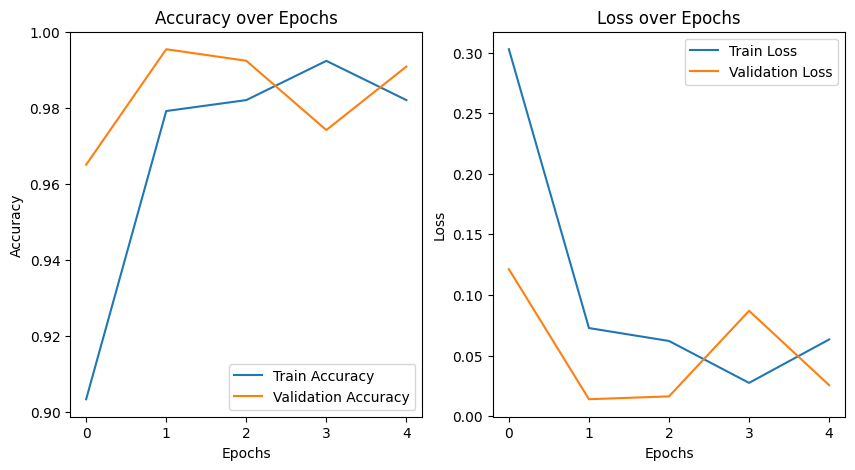

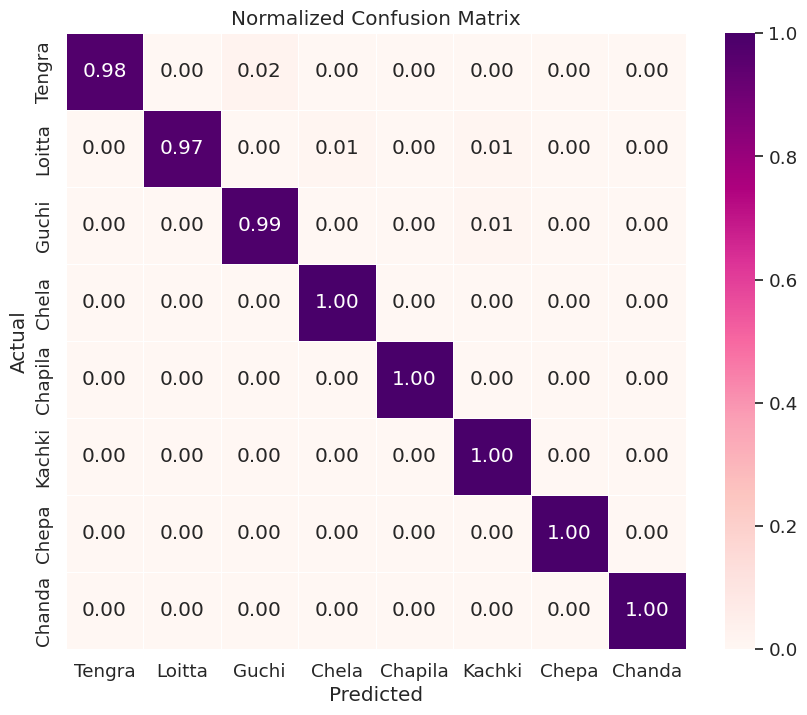

21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step


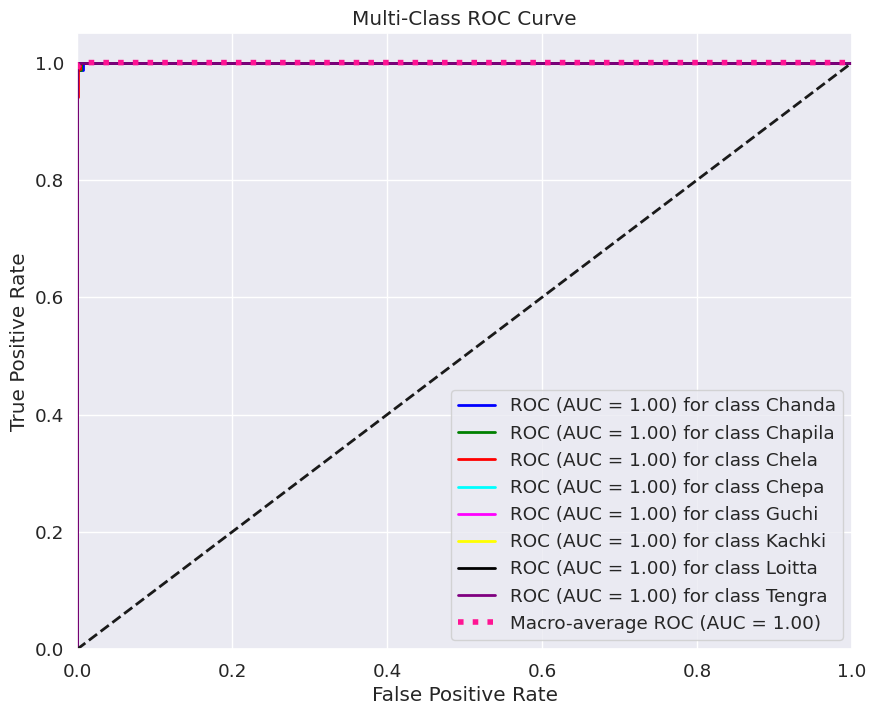

In [3]:
# =====================================
# ✅ Reproducible ResNet50V2 Training
# =====================================

# --- SEED SETUP (Reproducibility) ---
import os
import random
import numpy as np
import tensorflow as tf

SEED = 25

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"✅ Reproducibility enabled with SEED = {SEED}")

# =====================================
# ✅ Imports
# =====================================
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers, callbacks
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# =====================================
# ✅ Model Definition
# =====================================
input_tensor = Input(shape=(200, 200, 3))
base_model = ResNet50V2(input_tensor=input_tensor, weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(8, activation='softmax')(x)

model = Model(inputs=input_tensor, outputs=x)

# Compile
opt = optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Make all layers trainable
for layer in model.layers:
    layer.trainable = True

model.summary()

# =====================================
# ✅ Early Stopping Callback
# =====================================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',patience=5,
    restore_best_weights=True
)

# =====================================
# ✅ Training
# =====================================
history = model.fit(
    train_images,
    train_lables,
    batch_size=8,
    epochs=5,
    validation_data=(valid_images, valid_lables),
    callbacks=[early_stop],
    shuffle=True
)

# =====================================
# ✅ Evaluation
# =====================================
test_loss, test_acc = model.evaluate(test_images, test_lables)
print(f'Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}')

# =====================================
# ✅ Predictions
# =====================================
predictions = model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)

print("\nClassification Report:")
print(classification_report(test_lables, pred_labels))

# =====================================
# ✅ Accuracy & Loss Plot
# =====================================
def plot_accuracy_loss(history):
    plt.figure(figsize=(10, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_accuracy_loss(history)

# =====================================
# ✅ Confusion Matrix Plot
# =====================================
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(len(class_names) + 2, len(class_names)))
    sns.set(font_scale=1.2)
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap='RdPu', linewidths=.5,
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Normalized Confusion Matrix')
    plt.show()

# Example: get class names automatically
class_names = os.listdir('/content/drive/MyDrive/DF_ALL_Augmented/train')
plot_confusion_matrix(test_lables, pred_labels, class_names)

# =====================================
# ✅ Multi-Class ROC Curve
# =====================================
num_classes = 8
class_mapping = {'Chanda': 0, 'Chapila': 1, 'Chela': 2, 'Chepa': 3,
                 'Guchi': 4, 'Kachki': 5, 'Loitta': 6, 'Tengra': 7}
class_names_dict = {v: k for k, v in class_mapping.items()}

# Binarize labels for ROC
y_test_bin = label_binarize(test_lables, classes=range(num_classes))
y_score = model.predict(test_images)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
fpr["macro"], tpr["macro"] = all_fpr, mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'purple'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC (AUC = {roc_auc[i]:.2f}) for class {class_names_dict[i]}')

plt.plot(fpr["macro"], tpr["macro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.show()
